# Exploration des données des données
Created by: Thomas Durand-Texte, Jan. 2023
***

# Imports
## Import des packages

In [1]:
import pandas as pd
import numpy as np
import dask.dataframe as dd
pd.set_option("display.max_columns", 200)
import missingno as msno

import datetime as dt
import scipy.stats as st


import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

from sklearn.model_selection import train_test_split
from sklearn import neighbors

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import tools
cm = 1./2.54


## Reload module (for updates)

In [2]:
import importlib
cm = 1./2.54
importlib.reload(tools)
tools.set_theme( white_font=True )
# tools.plot_test_figure()

## Chargement des données

In [3]:
data = pd.read_pickle( 'data_clean.pkl' )

In [35]:
importlib.reload(tools)

def df2ltx( data, keys_replace_columns={'_':' '}, col_format='c' ):
    # print('data', data.shape)
    n_lines, n_keys = data.shape
    strng = '\\begin{tabular}{' + '{:}'.format( col_format*(n_keys+1) ) + '}\n\t'
    strng += '\\rowcolor{dfFirstRow}\n\t'
    for col in data.columns:
        for key,val in keys_replace_columns.items():
            col = col.replace(key,val)
        strng += ' & ' + col
    i = 1
    for index, row in zip( data.index, data.values ):
        i = (i+1)%2
        strng += ' \\tabularnewline\n\t\\rowcolor{' + ['dfEvenRow', 'dfOddRow'][i] + '}\n\t' + index.__str__()
        for cell in row:
            cell = cell.__str__()
            if cell == 'nan': cell = 'NaN'
            strng += ' & ' + cell

    strng += '\n\\end{tabular}'
    return strng

strng = df2ltx( data[['pnns_groups_1', 'energy-kj_100g']].head() )
print(strng)
# data.head()
data[['pnns_groups_1', 'energy-kj_100g']].head()



\begin{tabular}{ccc}
	\rowcolor{dfFirstRow}
	 & pnns groups 1 & energy-kj 100g \tabularnewline
	\rowcolor{dfEvenRow}
	0 & NaN & 427.0 \tabularnewline
	\rowcolor{dfOddRow}
	1 & NaN & NaN \tabularnewline
	\rowcolor{dfEvenRow}
	2 & NaN & 1397.0 \tabularnewline
	\rowcolor{dfOddRow}
	3 & beverages & 79.0 \tabularnewline
	\rowcolor{dfEvenRow}
	4 & milk and dairy products & 460.0
\end{tabular}


,pnns_groups_1,energy-kj_100g
0,NaN,427.0
1,NaN,NaN
2,NaN,1397.0
3,beverages,79.0
4,milk and dairy products,460.0


In [4]:
for value in data[['ingredients_text']].dropna().head().values:
    print('\nvalue:\n{:}'.format(value))


value:
['lait entier (99%); poudre de lait (1%), ferments lactiques, présure.']

value:
["jus d'orange 40% - jus de pomme 40% - jus d'ananas 9% - purée de banane - jus de raisin blanc - jus de pamplemousse - purée d'abricot - purée de pêche."]

value:
["1 boite  de garniture: tomates fraiches (51%), eau, oignons frais, huile d'olive vierge extra, huile de colza, sel, persil, concentré de tomate, jus concentré de citron, menthe, épaississants: farine de graines de caroube et gomme guar, arômes. 1 coupelle de semoule de blé dur précuite à la vapeur."]

value:
['farine de blé, sucre, beurre 12% (lait), sirop de sucre inverti, poudres à lever: carbonates de sodium, diphosphates, lactosérum en poudre lait), lat entier en poudre, sel, émulsifiant: lécithine de soja; acidifiant : acide citrique; arôme (oeufs entiers en poudre).']

value:
['palette de porc avec os 90 %, eau, sel, dextrose, conservateur : nitrite de sodium.']


***
# Stastistique

## pnns_groups / food_grade

keys: ['nutriscore_grade', 'pnns_groups_1', 'pnns_groups_2']


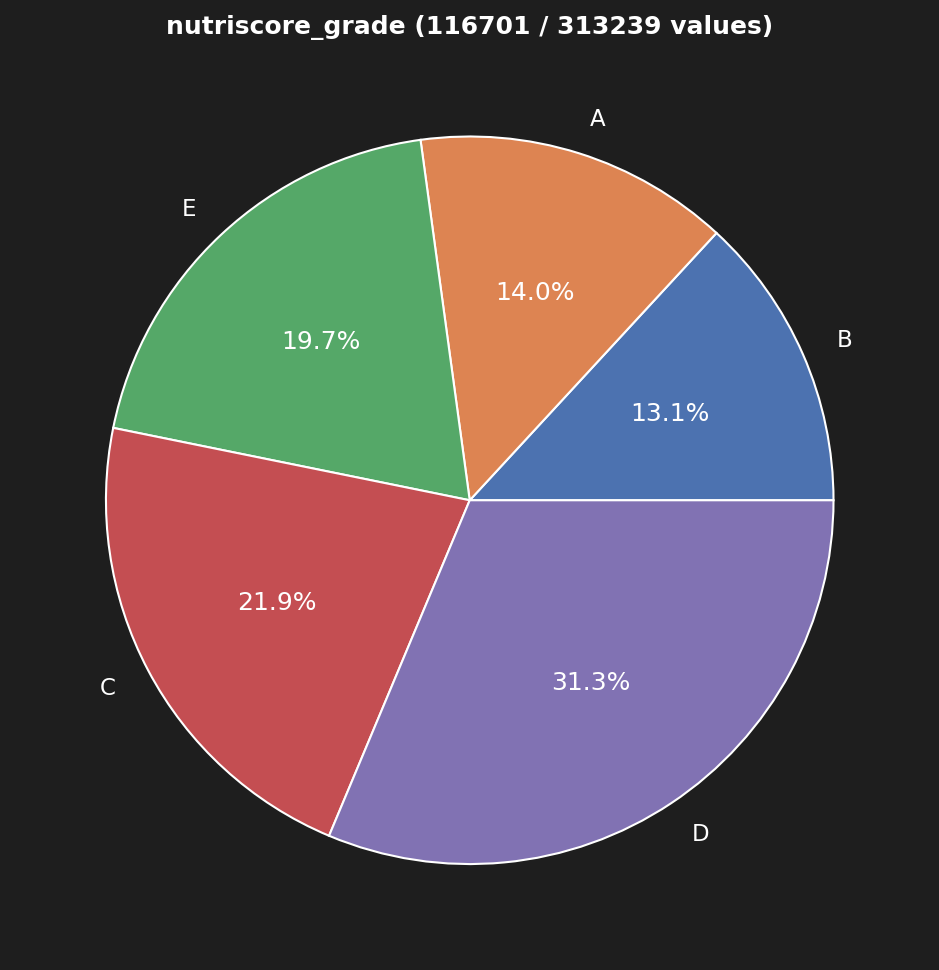

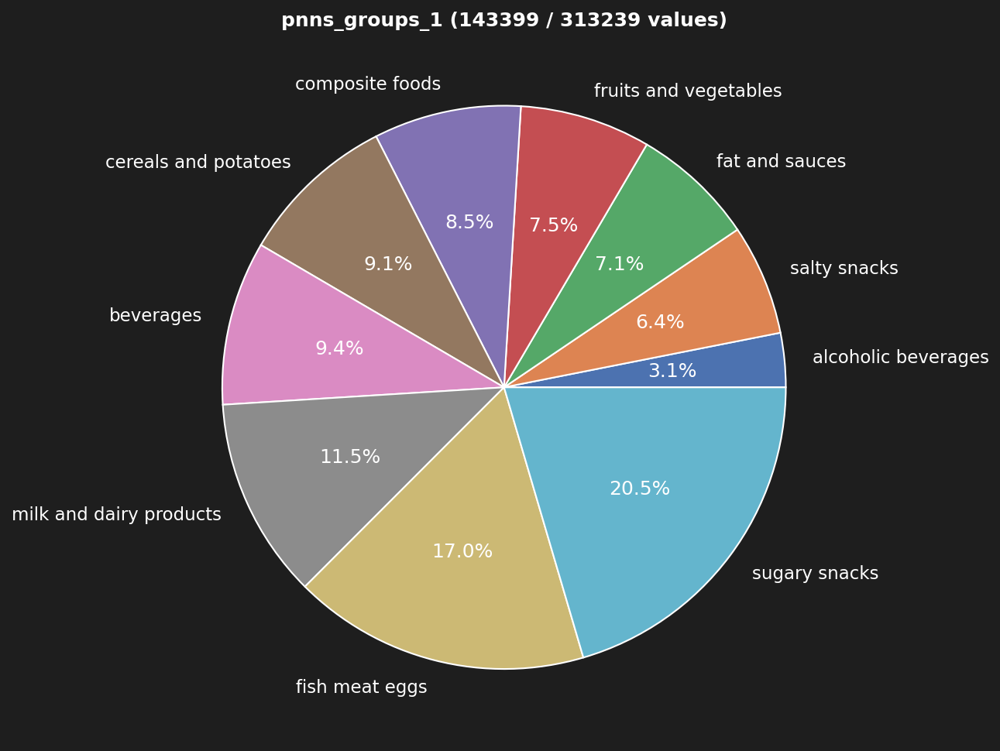

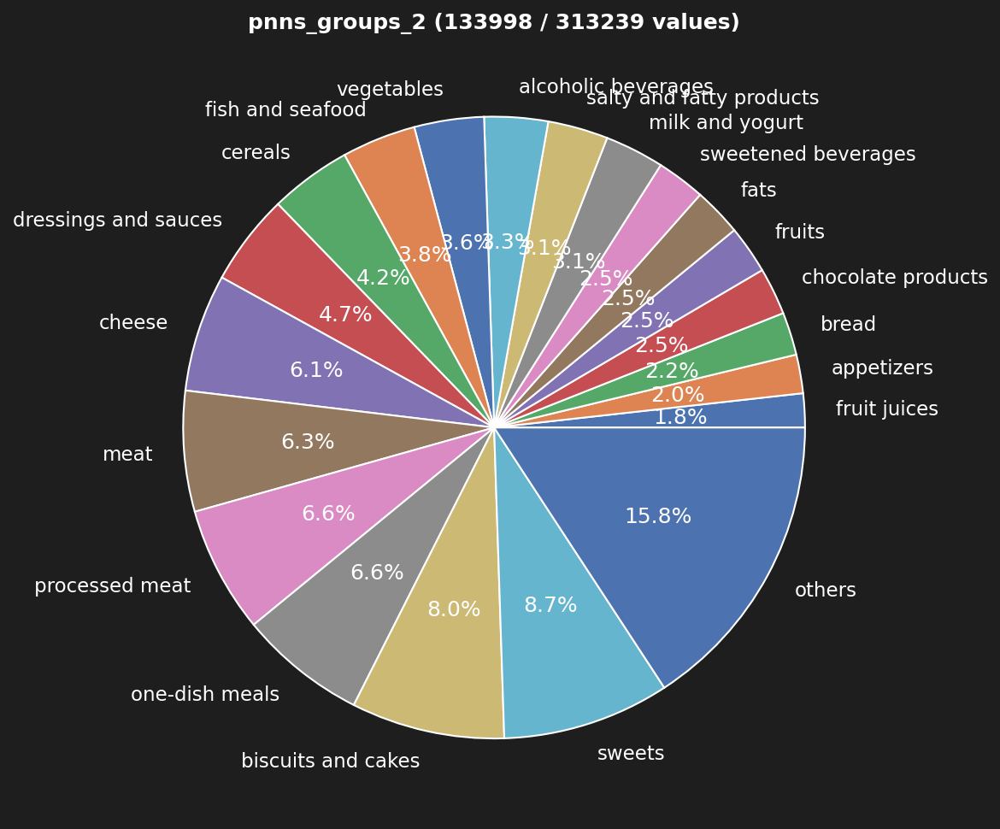

In [5]:
keys = data.keys()[data.keys().str.contains('pnns|nutriscore_grade')] #|main_categ|food_grou')]
print('keys:', keys.tolist())


n_lim_categories = 20
for key in keys:
    sr_plot = data[key].value_counts()
    n_sum = sr_plot.sum()

    if sr_plot.size > n_lim_categories:
        sr_plot = sr_plot.sort_values( ascending=False )
        sr_plot = pd.concat( [sr_plot[:n_lim_categories], 
                                pd.Series( [sr_plot[n_lim_categories:].sum()] , index=['others'] ),
                             ] )
        

    fig, ax = plt.subplots( figsize=(20*cm,20*cm))
    # pd.Series( sr_plot.sort_index( ascending=True ) ).plot( kind='pie' , ax=ax, autopct='%.1f%%' )
    pd.Series( sr_plot.sort_values( ascending=True ) ).plot( kind='pie' , ax=ax, autopct='%.1f%%' )
    ax.set_title( '{:} ({:} / {:} values)'.format( key, n_sum, len(data)), weight='bold')
    ax.set_ylabel('')

***
## Display NaN
### bar plot

<AxesSubplot: >

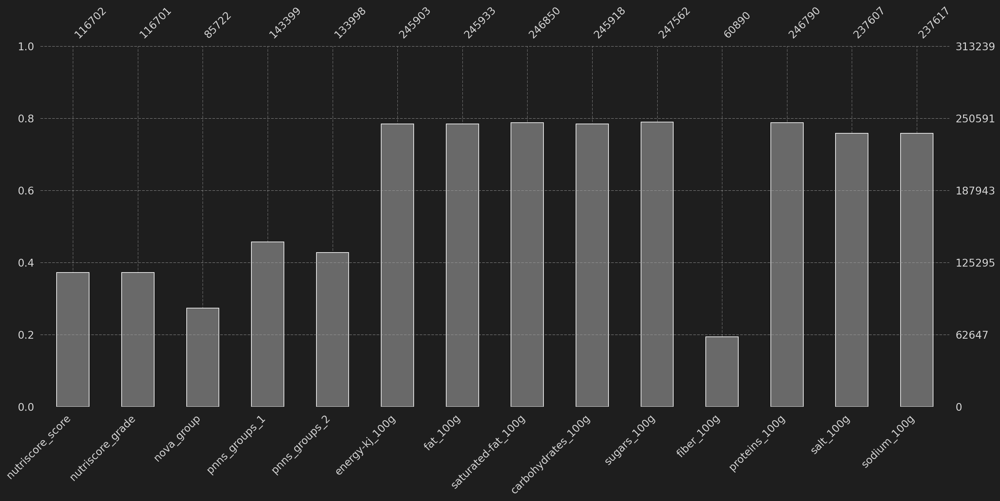

In [6]:
lst_to_hide = [ 'code',
                'name','quantity', 'labels', 'ingredie', 'allerg',
                'addit', 'ecoscore']
# lst_to_hide = ['code']
keys_used_0 = data.keys()[ ~data.keys().str.contains('|'.join(lst_to_hide)) ]
msno.bar( data[ keys_used_0 ] )

### choix des variables numériques
Les données sur les fibres sont relativement peu nombreuses, donc elles sont enlevées.

In [7]:
keys_100g = pd.Series( keys_used_0[ keys_used_0.str.contains('_100g') 
                        & ~keys_used_0.str.contains('fiber') ] )
print( 'keys 100g:', keys_100g.tolist() )

keys 100g: ['energy-kj_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']


### Matrix plot

<AxesSubplot: >

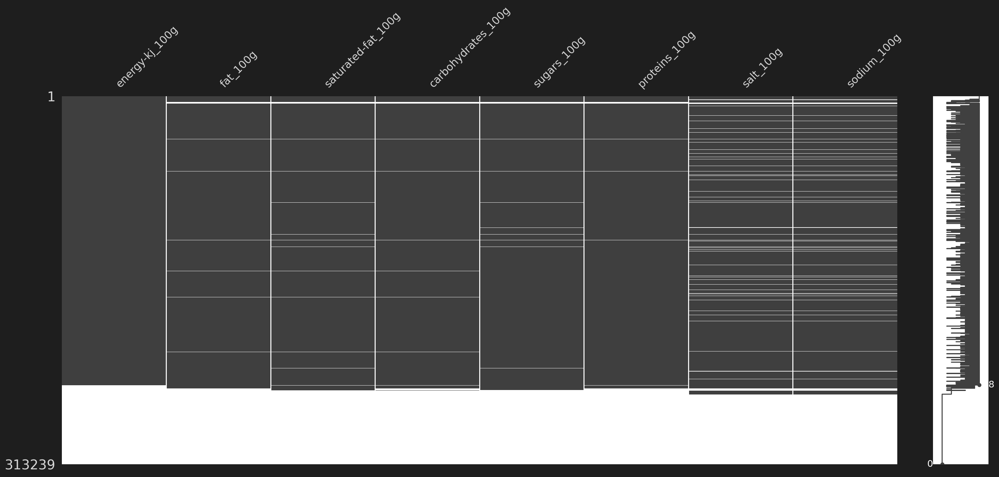

In [8]:
msno.matrix( data[keys_100g].sort_values( by=keys_100g.tolist()) )

Quelques NaN éparses sont visibles, mais pour la majeur partie des NaN sont sur toute la ligne.
Le plus sain est donc d'enlever les lignes pour lequelles toutes les valeurs sont NaN.

59491 rows dropped on 313239


<AxesSubplot: >

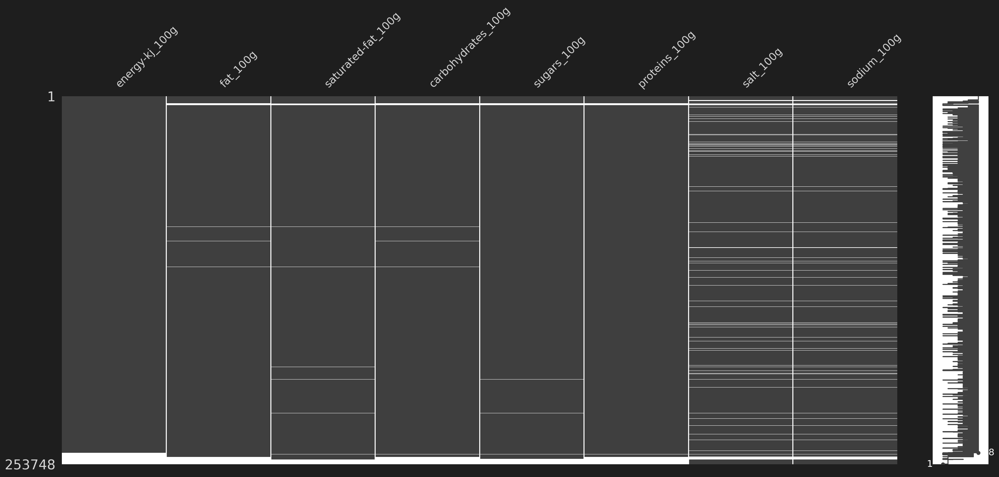

In [9]:
sr_is_ful_na = data[keys_100g].isna().sum(1) == len(keys_100g)

print('{:} rows dropped on {:}'.format( sr_is_ful_na.sum() , len(sr_is_ful_na) ))

data.drop( index = sr_is_ful_na[sr_is_ful_na].index , inplace=True )
msno.matrix( data[keys_100g].sort_values( by=keys_100g.tolist()) )

Il reste quelques lignes avec trop peu de valeurs, qui sont donc préférables d'enlever

6776 rows dropped on 253748


<AxesSubplot: >

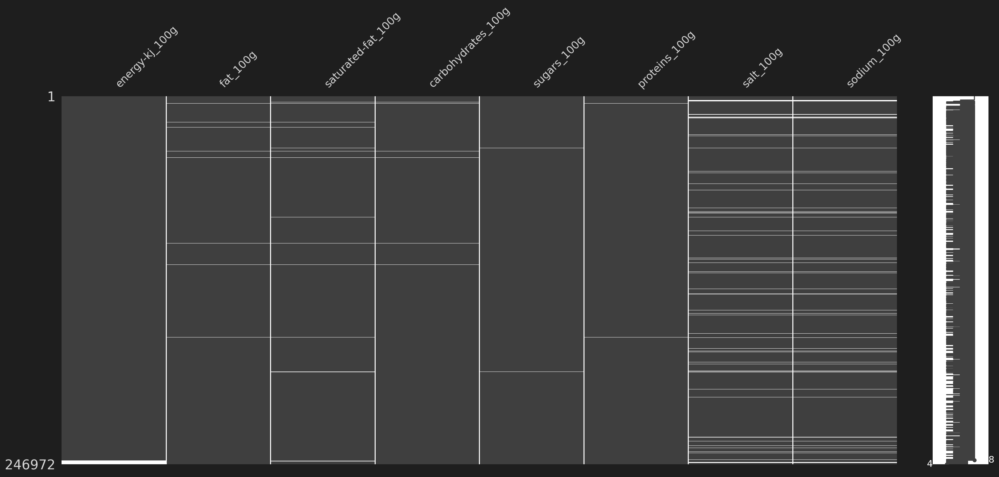

In [10]:
sr_loc = data[keys_100g].isna().sum(1) > (len(keys_100g) - 4 )

print('{:} rows dropped on {:}'.format( sr_loc.sum() , len(sr_loc) ))

data.drop( index=sr_loc[sr_loc].index, inplace=True )
msno.matrix( data[keys_100g].sort_values( by=keys_100g.tolist()) )

## Uniquement valeurs == 0

In [11]:
sr_loc = data[keys_100g].max(1)==0
print('n max(row) == 0 : {:} over {:} rows'.format( sr_loc.sum(), len(sr_loc)) )
data.drop( index= sr_loc[sr_loc].index, inplace=True )

n max(row) == 0 : 2847 over 246972 rows


## Analyse proteins + carbohydrates + fat


<span style="color:orange"> AJOUT FIBER </span>

<span style="color:red"> À faire dans le nettoyage ? </span>

count    244125.000000
mean         50.490918
std          30.975213
min           0.000000
25%          23.400000
50%          47.000000
75%          82.600000
max         200.000000
Name: Prot+carbo+fat, dtype: float64

Q3+1.5*IQ: 171.400, n_outliers : 6
n > 100 : 725


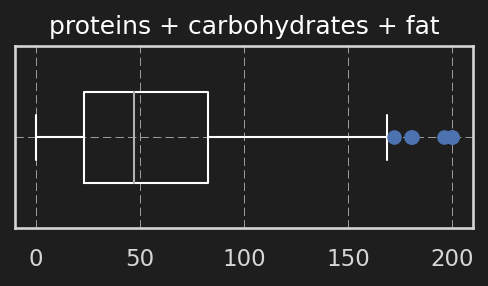

In [12]:
key = 'Prot+carbo+fat'
data[key] = data[['proteins_100g', 'fat_100g', 'carbohydrates_100g']].fillna(0.).sum(1)
df = data[key].describe()
display(df)
Q3, IQ = df['75%'], df['75%']-df['25%']
sr_out = data[key] > Q3 + 1.5*IQ
print('Q3+1.5*IQ: {:.3f}, n_outliers :'.format(Q3+1.5*IQ), sr_out.sum() )

sr_out = data[key] > 100.
print('n > 100 :', sr_out.sum() )

fig, ax = plt.subplots( figsize=(10*cm,4*cm))
data.boxplot( column=key, vert=False, ax=ax, sym='bo', 
            boxprops={'color':'w'}, whiskerprops={'color':'w'},
            capprops={'color':'w'}, widths=0.5 )
# print('label', ax.get_yticklabels()[0].get_text())
ax.set_title( 'proteins + carbohydrates + fat' )
ax.set_yticklabels( [] )

if False:
    data = data.drop( index=sr_out[sr_out].index, inplace=True )

    fig, ax = plt.subplots()
    data.boxplot( column=key, vert=False, ax=ax )


## Remplissage avec la valeur moyenne par pnns_groups_1
Clairement, les distributions ne sont `pas Gaussiennes` dans chaque catégorie: plusieurs `modes` sont visibles. `Remplacer` les `NaN` avec la `valeur moyenne` dans chaque catégorie `modifie` la `forme` des `distributions`.

<span style="color:red"> Problème d'affichages due au violin sur alcoholic beverages </span>

<span style="color:red"> Faire un équivalent violin avec histogrammes ? + 2 moustaches ? </span>

In [13]:
if False:
    # plot histogram chart for var2
    n_bins = 20
    # get positions and heights of bars
    heights, bins = np.histogram(df.var2, density=True, bins=n_bins) 
    # multiply by -1 to reverse it
    heights *= -1
    bin_width = np.diff(bins)[0]
    bin_pos =( bins[:-1] + bin_width / 2) * -1

    # plot
    plt.bar(bin_pos, heights, width=bin_width, edgecolor='black')

In [14]:
sr_loc = data['pnns_groups_1'] == 'alcoholic beverages'
alcohol_isna = data.loc[ sr_loc, 'fat_100g' ].isna()
print('{:} (over {:}) data on alcoholic beverages are NaN'.format( alcohol_isna.sum() , len(alcohol_isna) ) )

9 (over 376) data on alcoholic beverages are NaN


Number of added values:


energy-kj_100g        1556
fat_100g               627
saturated-fat_100g    1237
carbohydrates_100g     569
sugars_100g            563
proteins_100g          173
salt_100g             3070
sodium_100g           3067
dtype: int64

number of not equal data: 46
mean (initial data) energy-kj_100g: 764.881
initial data:
11018    NaN
11332    NaN
18961    NaN
27659    NaN
30180    NaN
33404    NaN
37016    NaN
37373    NaN
43892    NaN
47629    NaN
69639    NaN
70636    NaN
72925    NaN
75879    NaN
76996    NaN
82046    NaN
93310    NaN
93992    NaN
103767   NaN
119301   NaN
121096   NaN
127973   NaN
136463   NaN
143793   NaN
148780   NaN
151135   NaN
168473   NaN
178571   NaN
197224   NaN
209768   NaN
209885   NaN
233345   NaN
260720   NaN
261224   NaN
263067   NaN
263592   NaN
264303   NaN
276351   NaN
279911   NaN
281063   NaN
281782   NaN
284476   NaN
284985   NaN
290354   NaN
297793   NaN
308966   NaN
Name: energy-kj_100g, dtype: float64
data_mean:
11018     764.881374
11332     764.881374
18961     764.881374
27659     764.881374
30180     764.881374
33404     764.881374
37016     764.881374
37373     764.881374
43892     764.881374
47629     764.881374
69639     764.881374
70636     764.881374
72925     764.8

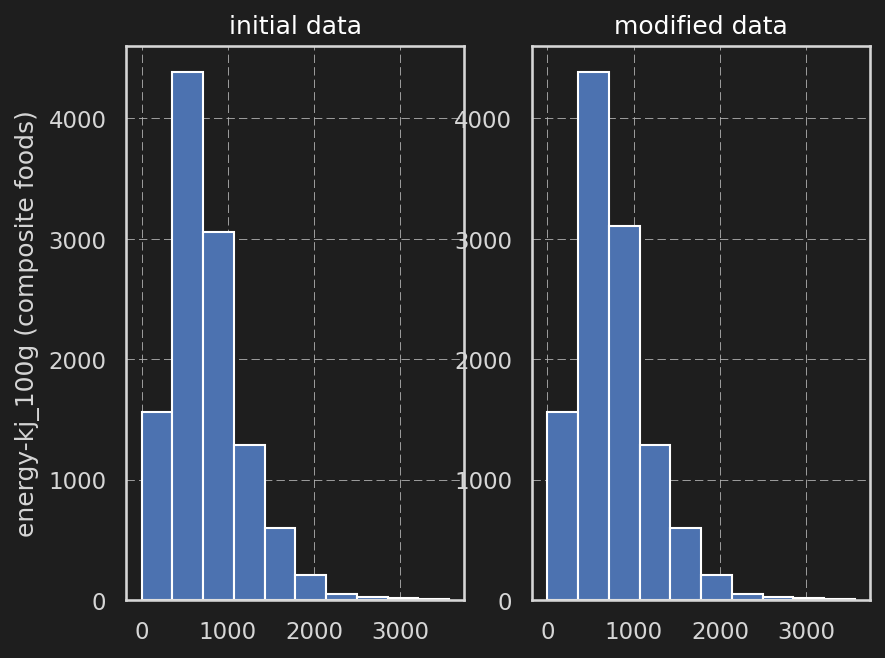

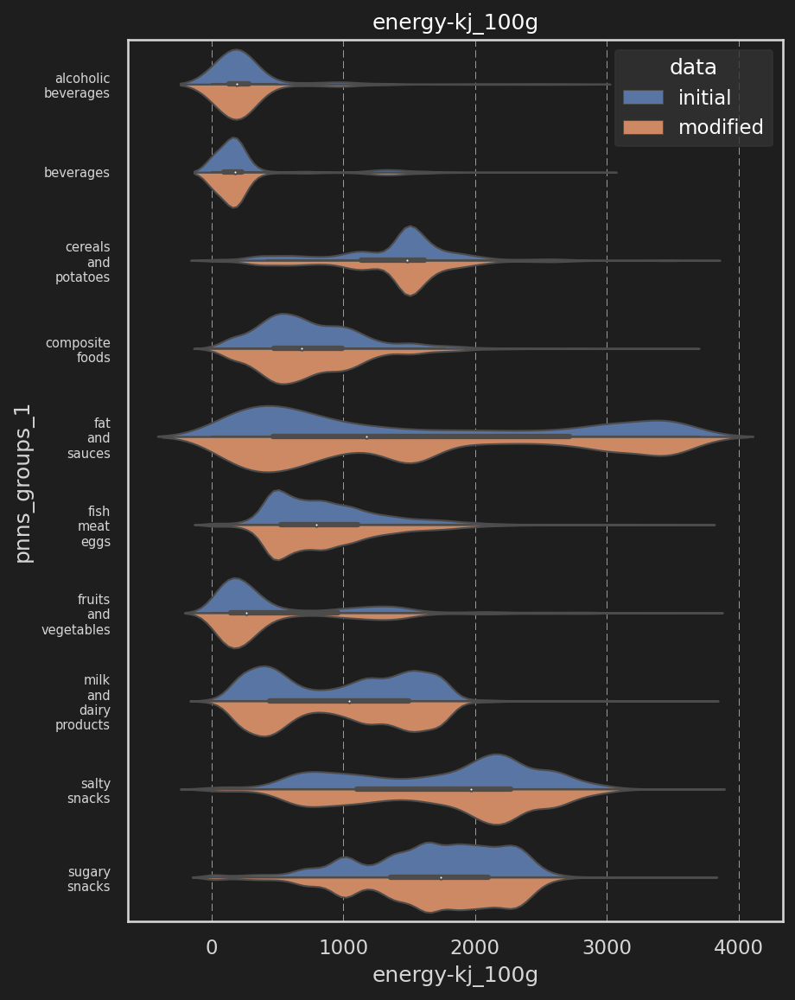

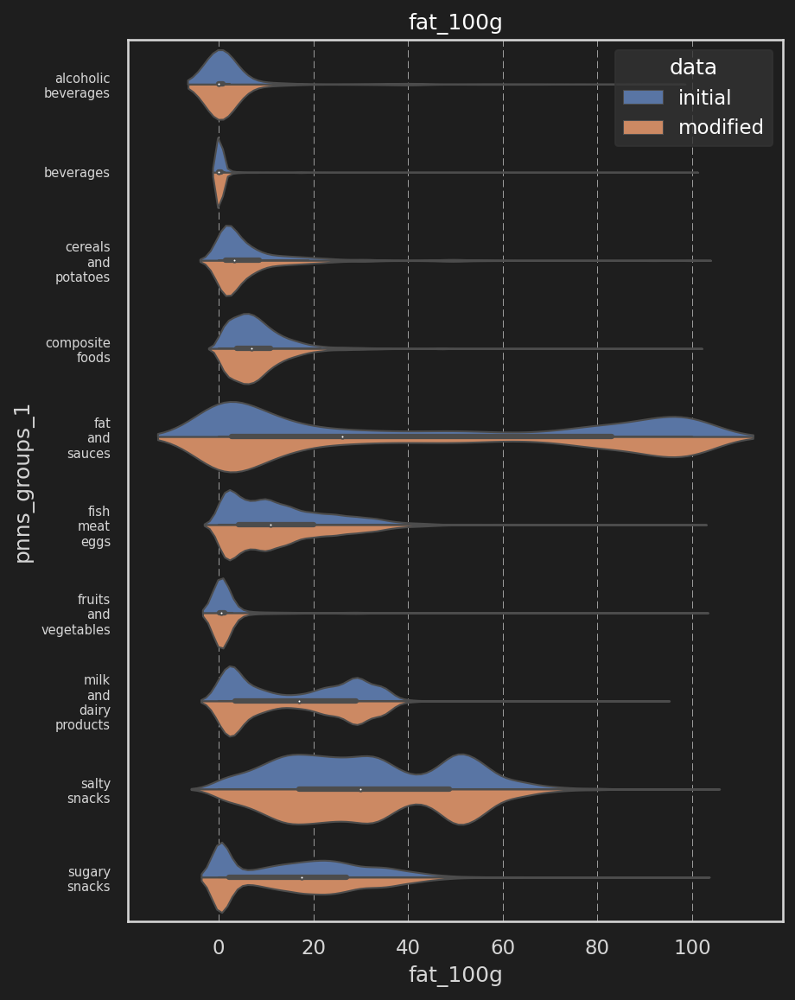

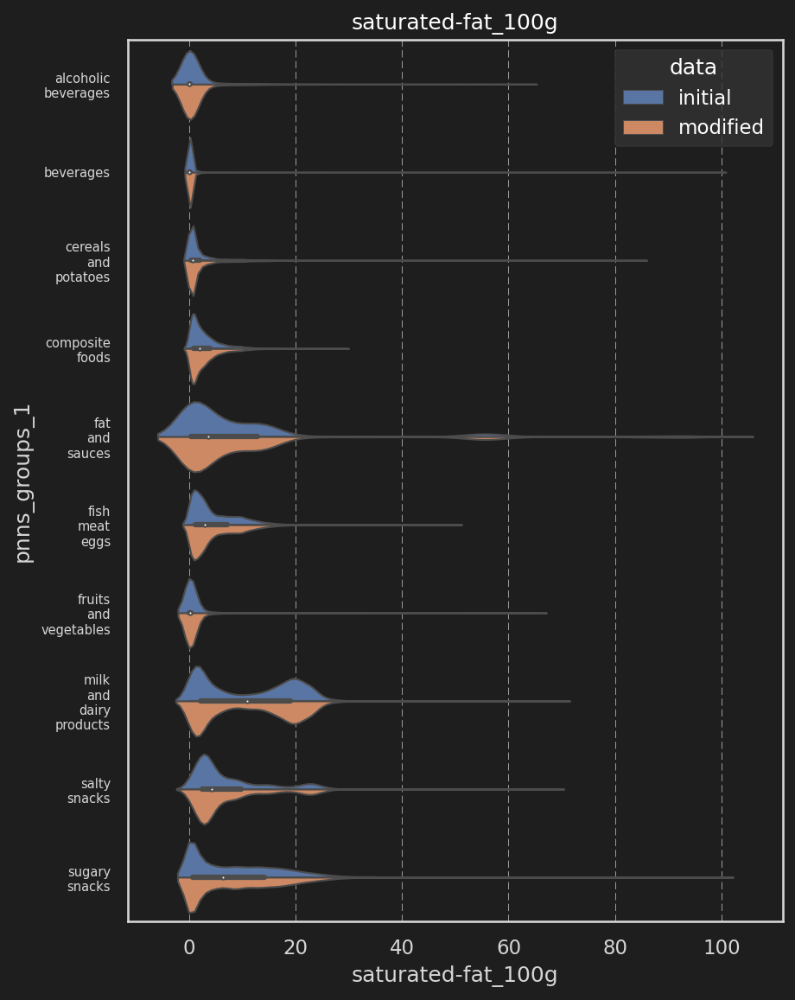

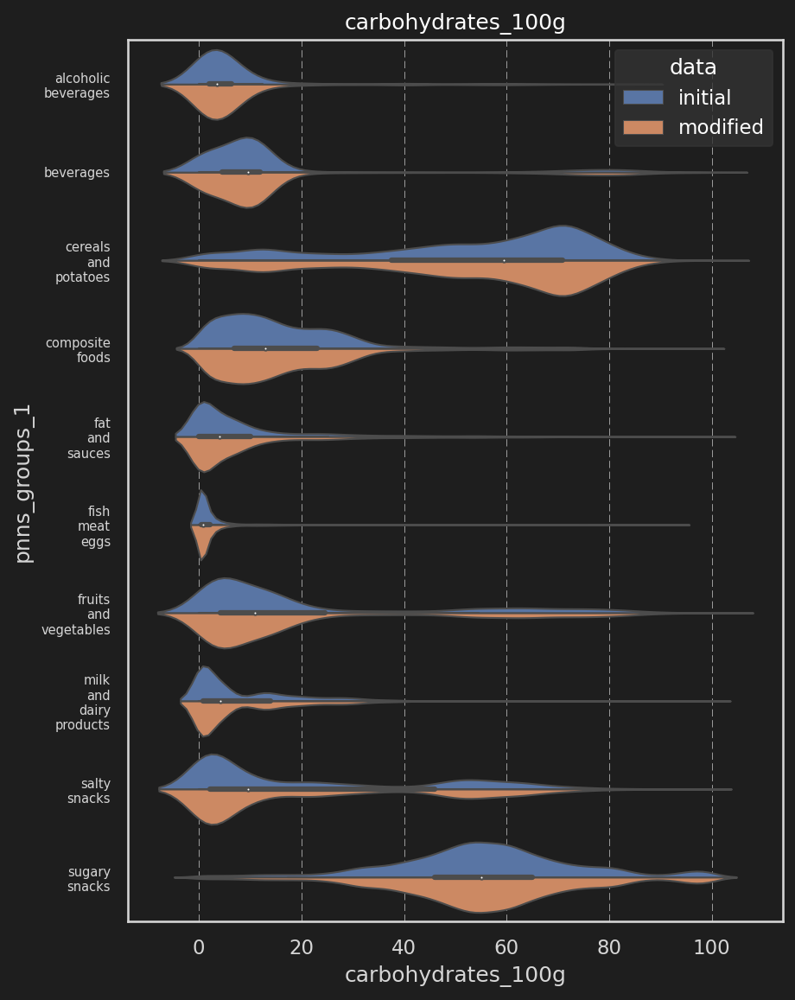

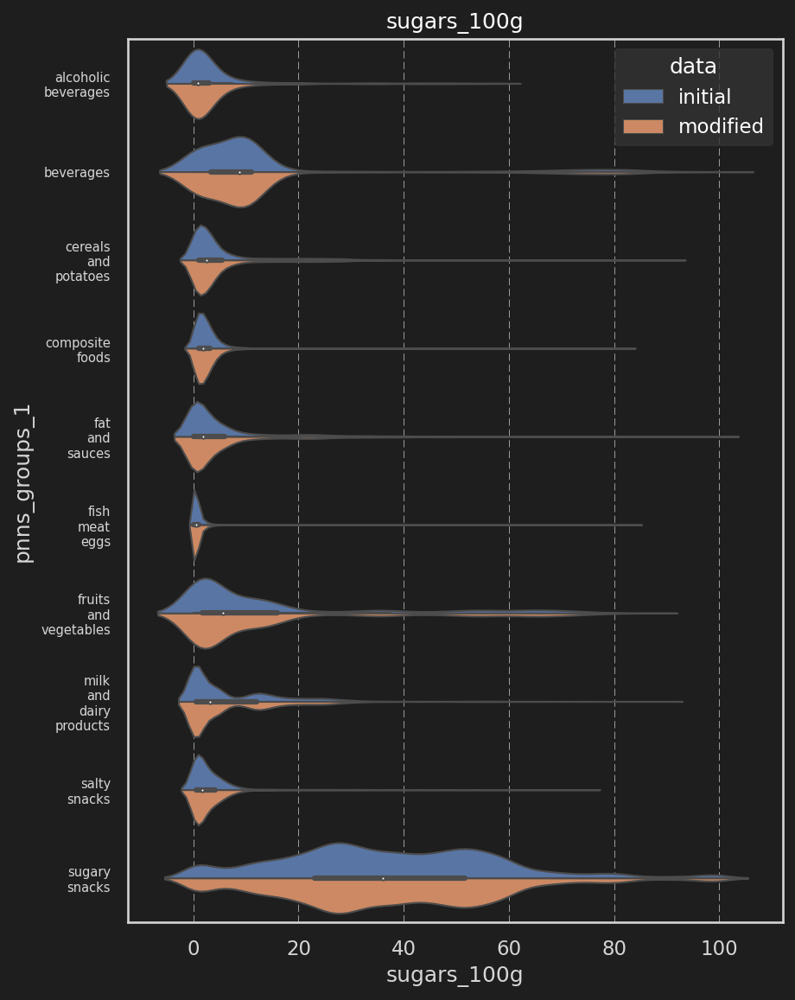

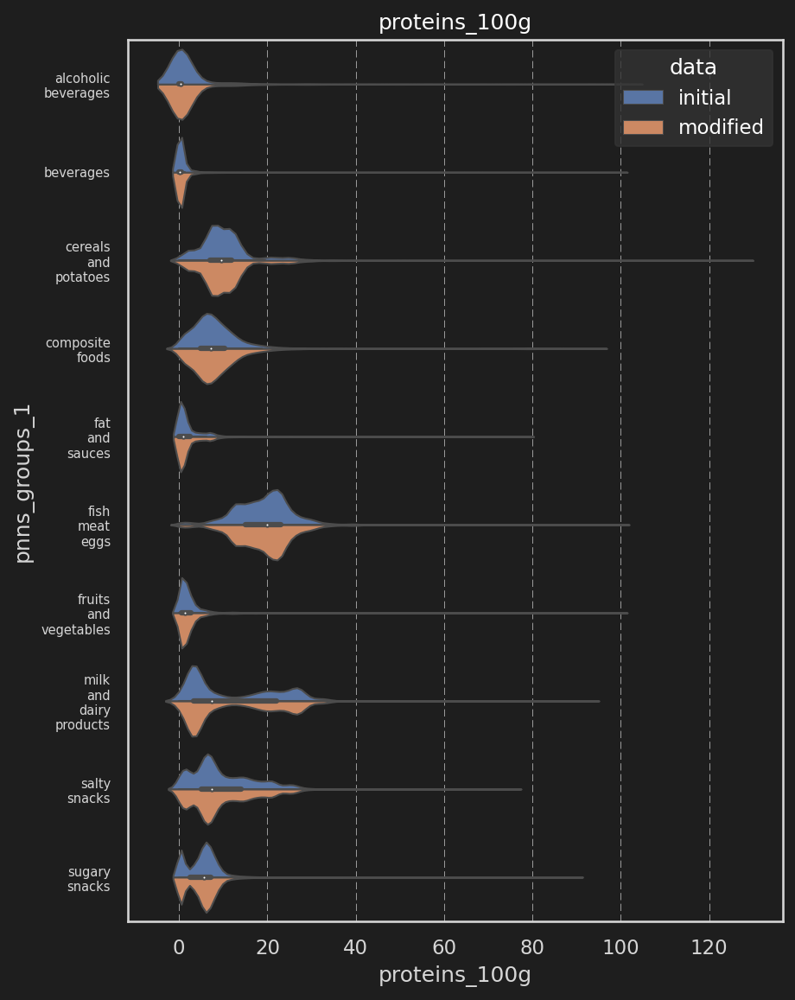

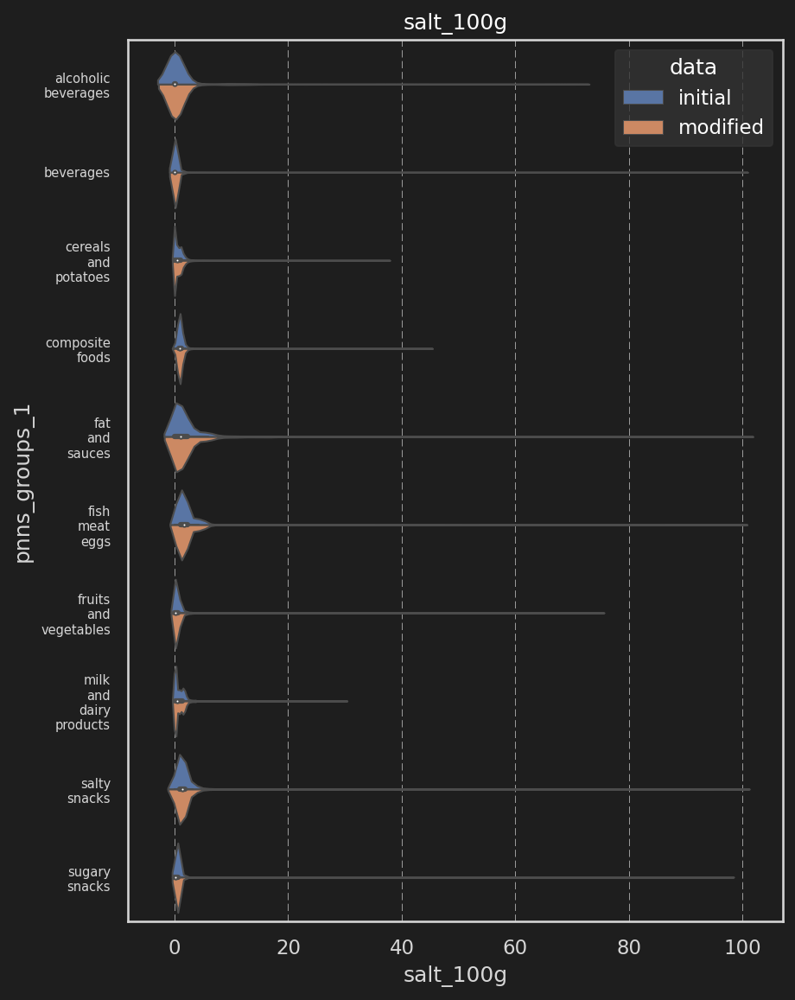

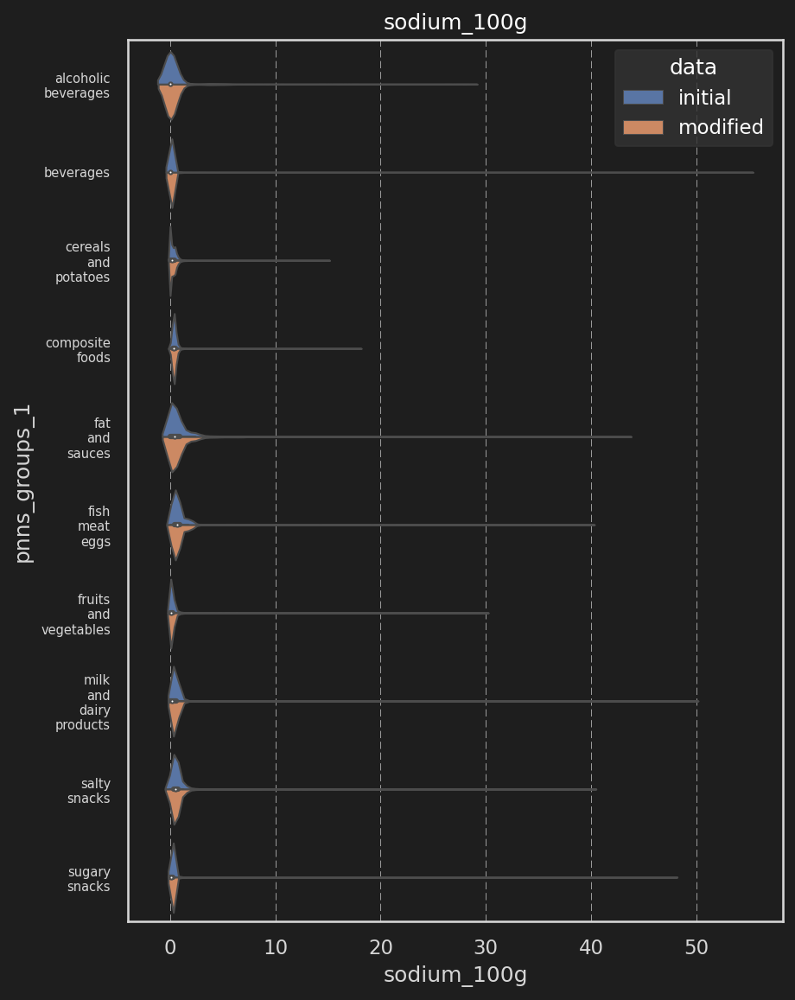

In [15]:
data['data'] = pd.Series('initial', index=data.index, dtype='category')

# new data set with fillna with median value in each pnns_groups_1
data_mean = data.copy()
data_mean['data'] = data_mean['data'].map( {'initial':'modified'} )
groups = data[ keys_100g.tolist() + ['pnns_groups_1'] ].groupby( 'pnns_groups_1' )

# .transform(lambda x: x.fillna(x.mean()))

# apply only if pnns_groups is defined
data_mean.loc[ ~(data_mean['pnns_groups_1'].isna()) , keys_100g ] = data_mean[keys_100g].fillna( groups.transform('mean') )


print('Number of added values:')
display( data[keys_100g].isna().sum(0) - data_mean[keys_100g].isna().sum(0) )

# check process
key = 'energy-kj_100g'
pnns = 'alcoholic beverages'
pnns = 'composite foods'
sr_loc = data[key].isna() & (data['pnns_groups_1'] == pnns)
sr_loc0 = ~data[key].isna() & (data['pnns_groups_1'] == pnns)

print( 'number of not equal data:', (data_mean.loc[sr_loc, key] != data[key].mean()).sum() )

print('mean (initial data) {:}: {:.3f}'.format(key, data.loc[ data['pnns_groups_1']==pnns, key].mean()  ))
print( 'initial data:')
print( data.loc[sr_loc, key] )
print( 'data_mean:')
print( data_mean.loc[sr_loc, key] )

sr_loc2 = (data['pnns_groups_1'] == pnns)
print('\ninitial:')
print('data {:} ({:}) mean: {:.3f}, modified: {:.3f}'.format( key, pnns, data.loc[sr_loc0,key].mean(), data_mean.loc[sr_loc,key].mean() ) )
print('\nre-computed loc:\ndata {:} ({:}) mean: {:.3f}, modified: {:.3f}'.format( key, pnns, data.loc[sr_loc2,key].mean(), data_mean.loc[sr_loc2,key].mean() ) )

fig, axs = plt.subplots( ncols=2 )
axs[0].hist( data.loc[sr_loc2, key] )
axs[1].hist( data_mean.loc[sr_loc2, key] )
axs[0].set_ylabel( '{:} ({:})'.format(key, pnns) )
axs[0].set_title('initial data')
axs[1].set_title('modified data')

for key in keys_100g:
    fig, ax = plt.subplots( figsize=(16*cm,20*cm) )
    ax.set_title( key )
    sns.violinplot( y='pnns_groups_1', x=key, data=pd.concat( (data, data_mean) ), ax=ax,
        linewidth=1, scale='count', hue='data', split=True )
    # sns.violinplot( x='pnns_groups_1', y=key, data=data_mean, ax=axs[1],
    #     linewidth=1, scale='width' )
    # ax.set_xticklabels([])
    ax.set_yticklabels( [label.get_text().replace(' ', '\n') for label in ax.get_yticklabels()] , fontsize=7 )
    # axs[1].set_ylabel( axs[1].get_ylabel() + ' (ajout mean)')
    # ax.set_xlabel('')
    # ax.set_ylabel('initial')
    # axs[1].set_ylabel('modifié')

    fig.tight_layout()

    # ax.legend( ncols=4, fontsize=7 )
    # break


## Affichage des histogrammes pour les différentes variabes float
- Au moins 2 groupes sont visibles pour différentes variables
- les distributions présentent un `skweness empirique > 0`
- 1 second groupe (très petit) est parfois visible 
    - on imagine facilement les huiles / les pacquets de sel pour les variables "fat" et "salt"

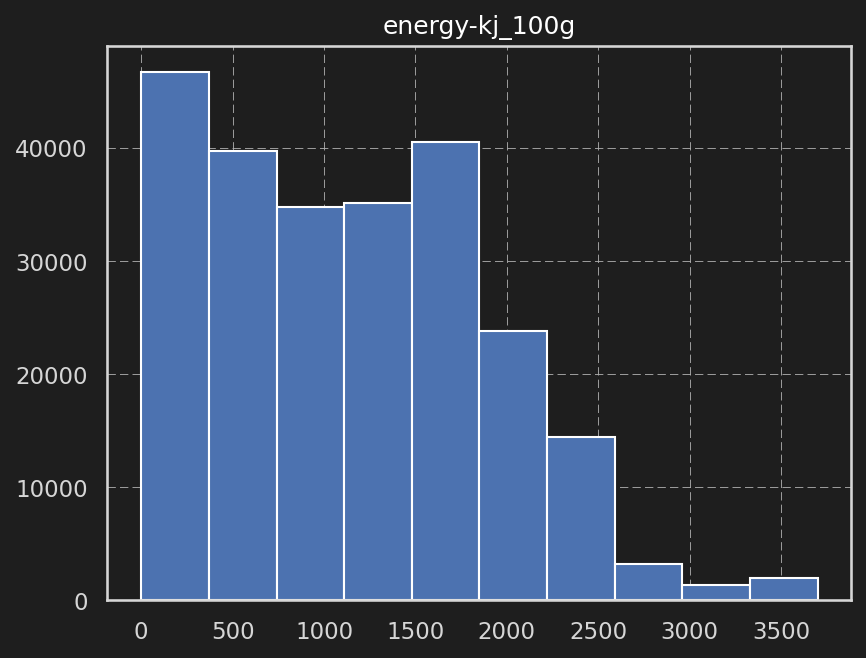

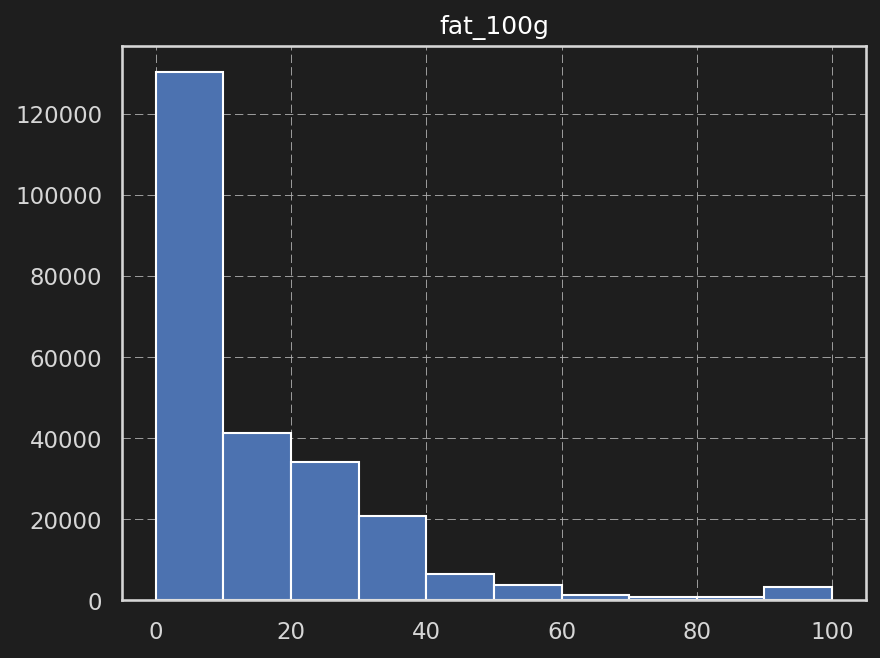

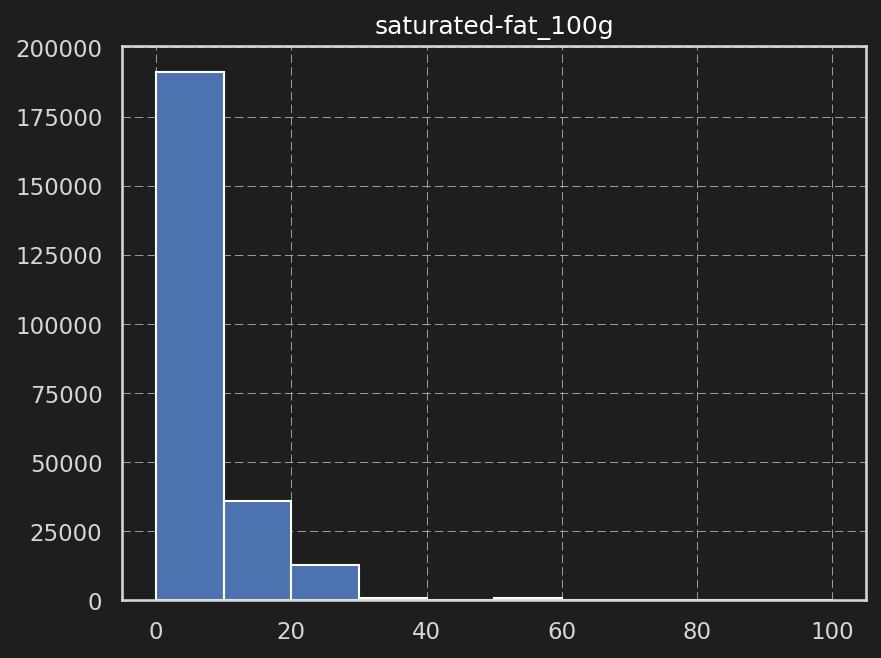

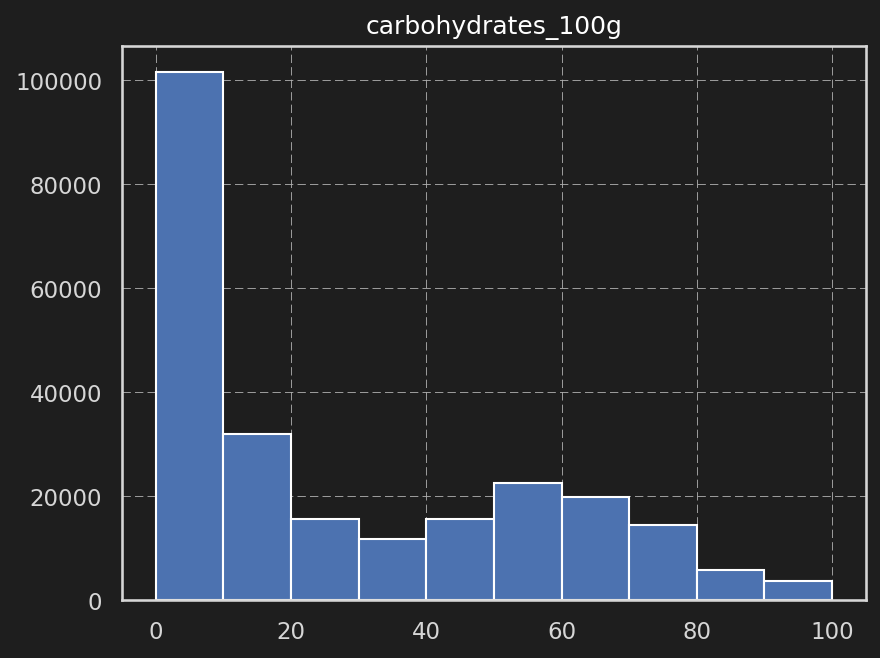

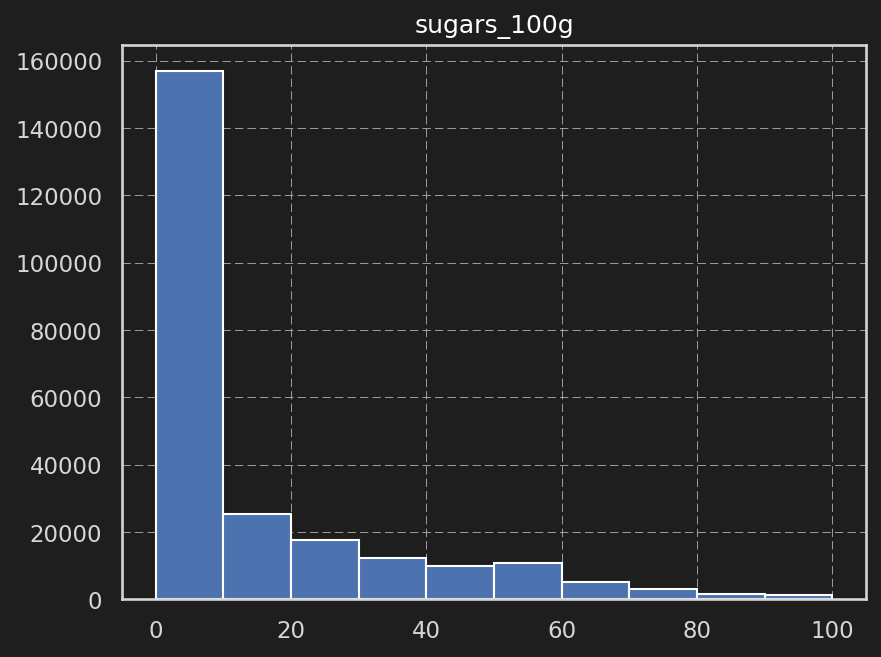

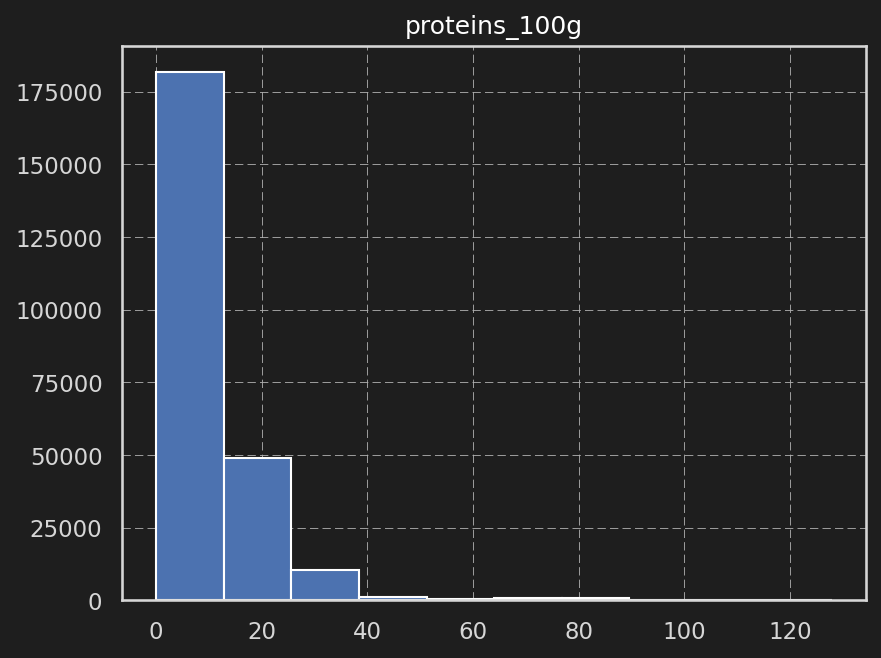

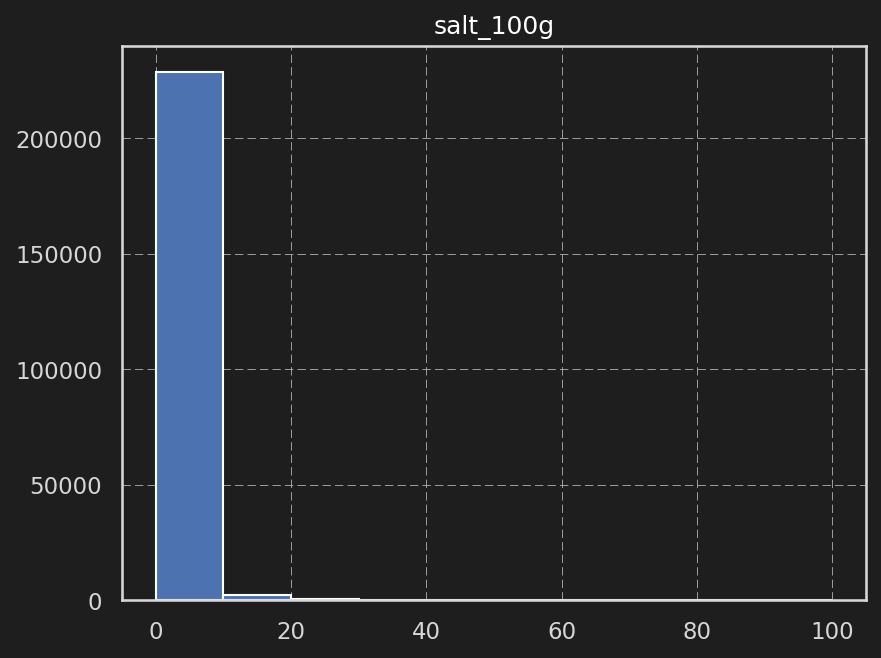

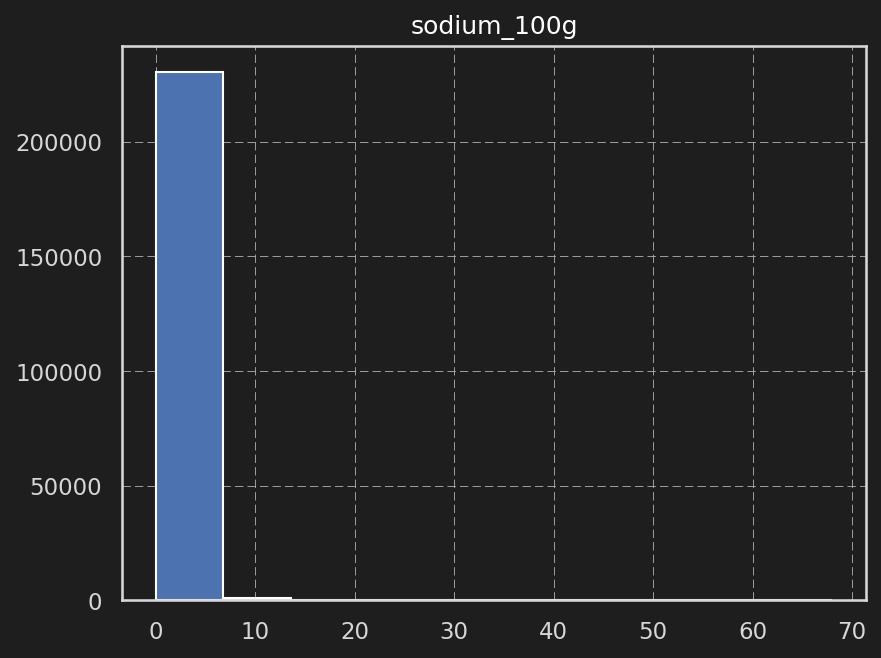

In [40]:
for key in keys_100g:
    fig, ax = plt.subplots()
    data[ key ].hist( ax=ax )
    ax.set_title(key)

<span style="color:red"> IL RESTE DES PROTEINS > 100g (values non dropped before) </span>

In [41]:
data[keys_100g].describe()

,energy-kj_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g
count,241485.000000,242950.000000,242081.000000,242987.000000,243291.000000,243891.000000,231822.000000,231831.000000
mean,1144.639843,14.373635,5.512094,27.329823,13.801436,8.992661,1.287196,0.517181
std,754.469878,17.485664,7.973885,27.656573,19.998828,9.976207,4.301473,1.756249
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,485.000000,1.200000,0.280000,2.900000,0.700000,1.700000,0.090000,0.036000
50%,1105.000000,8.300000,2.100000,14.000000,3.530000,6.300000,0.590000,0.236000
75%,1673.000000,22.600000,8.100000,52.000000,20.000000,13.000000,1.370000,0.548000
max,3700.000000,100.000000,100.000000,100.000000,100.000000,128.000000,100.000000,68.000000


## Iterative imputer
Les résultats semblent `corrects` (peu de modification des distributions) excepté pour les boissons alcolisées qui montrent une forte modification

<span style="color:red"> Problème affichage violinplot </span>

Number of added values:


energy-kj_100g         2640
fat_100g               1175
saturated-fat_100g     2044
carbohydrates_100g     1138
sugars_100g             834
proteins_100g           234
salt_100g             12303
sodium_100g           12294
dtype: int64

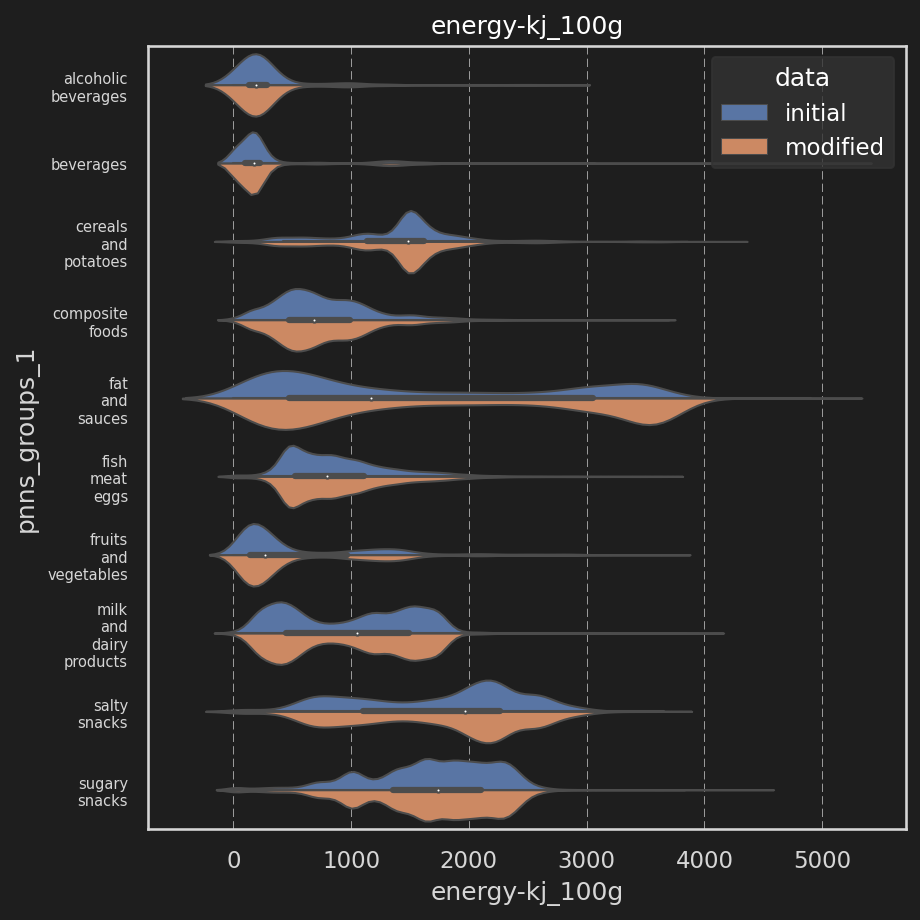

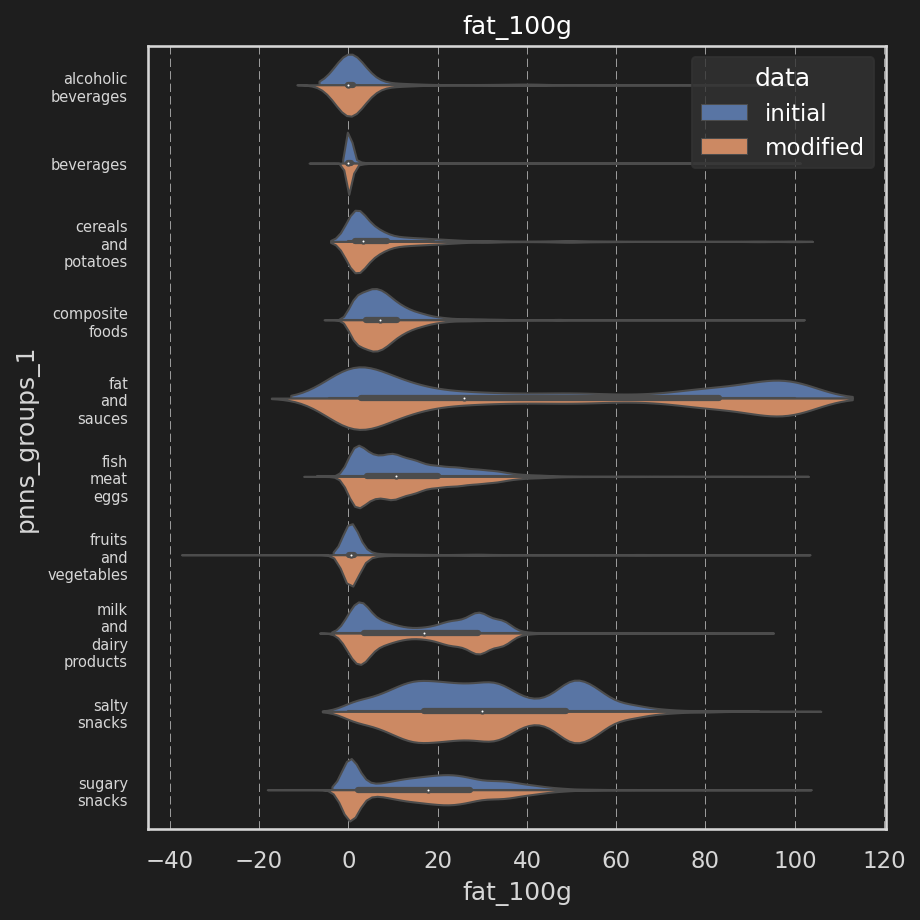

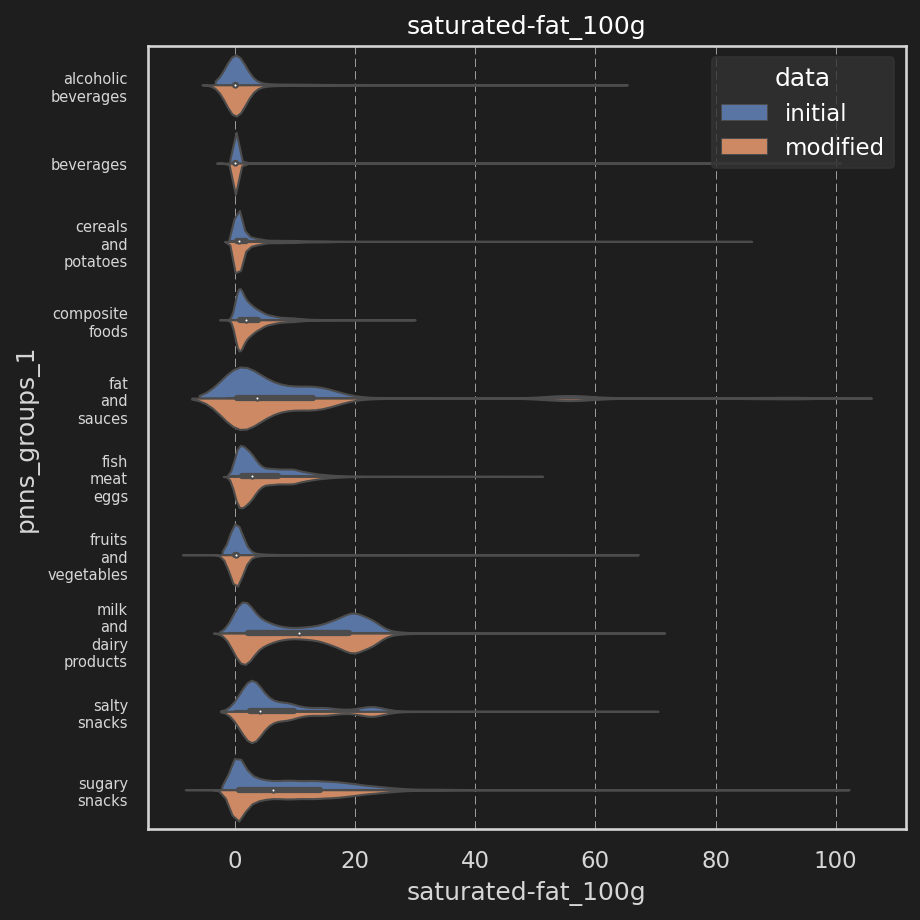

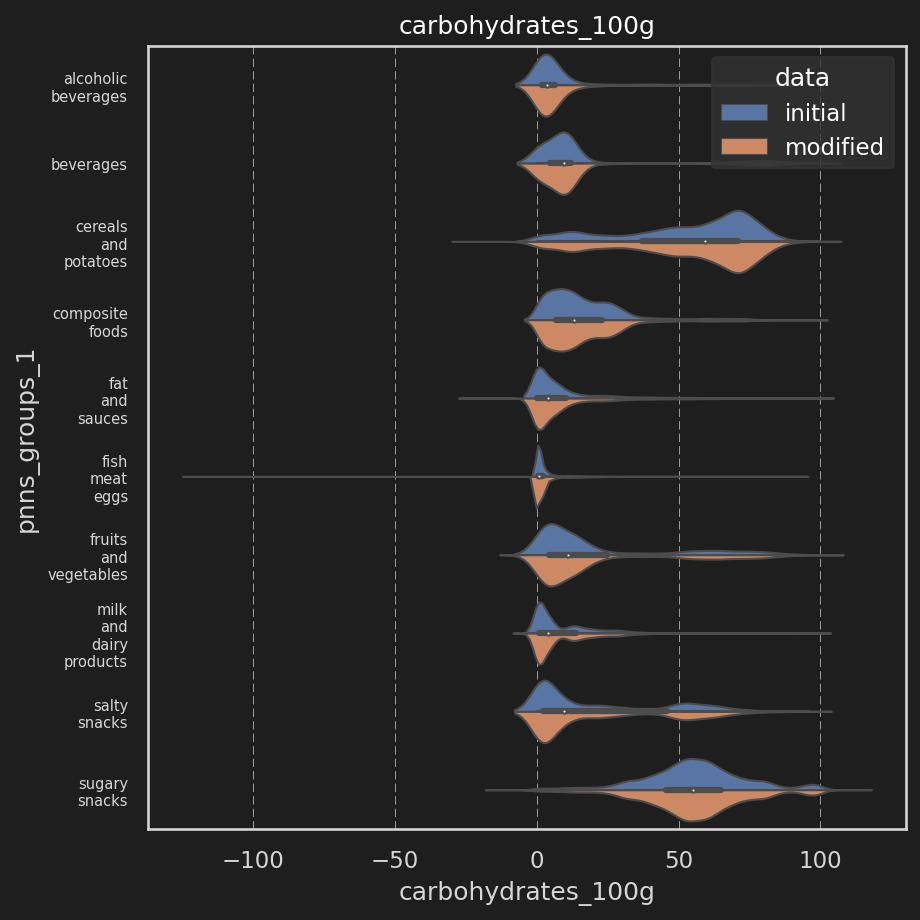

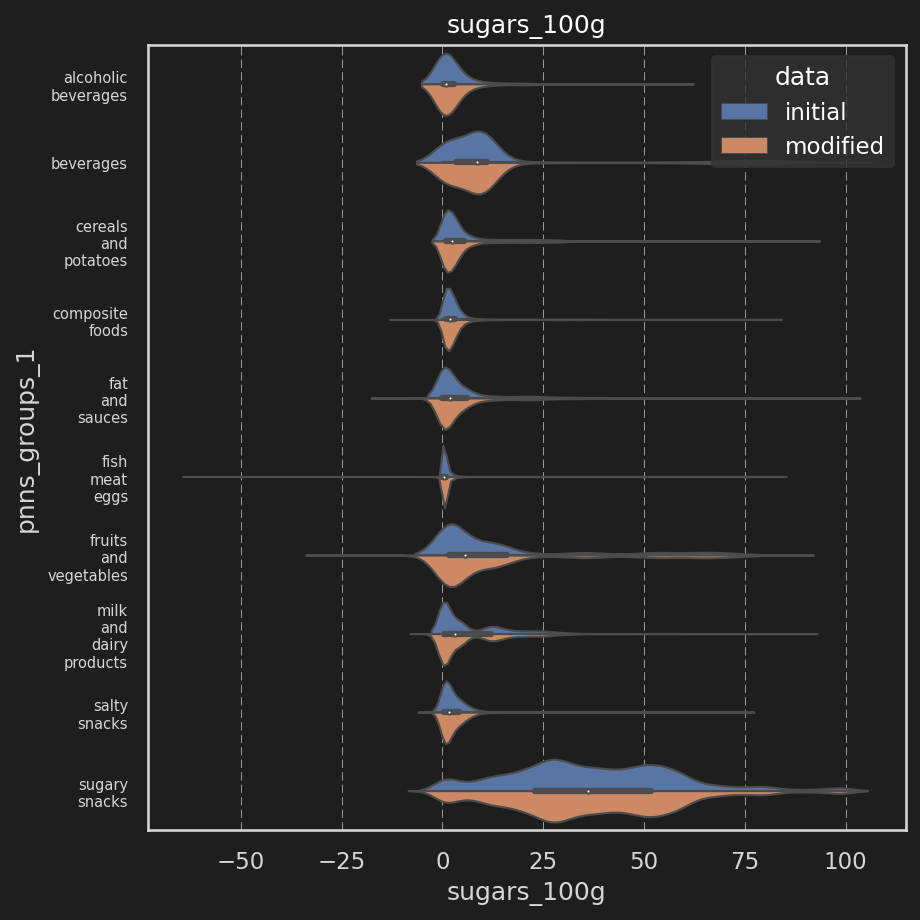

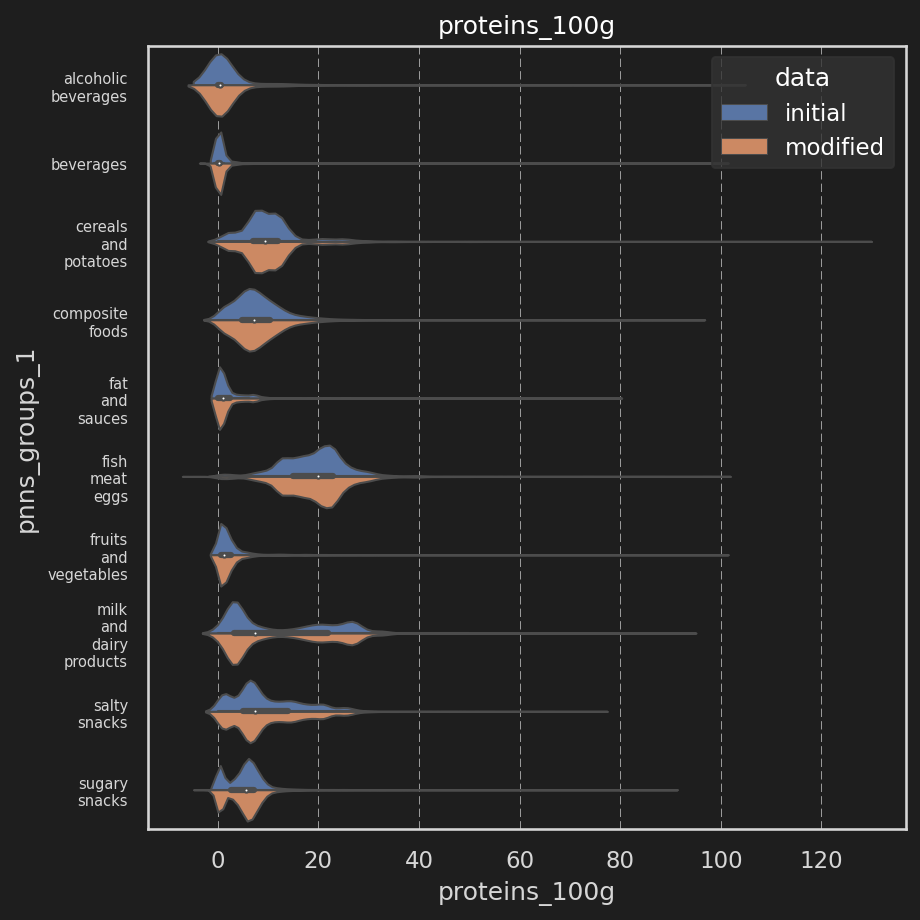

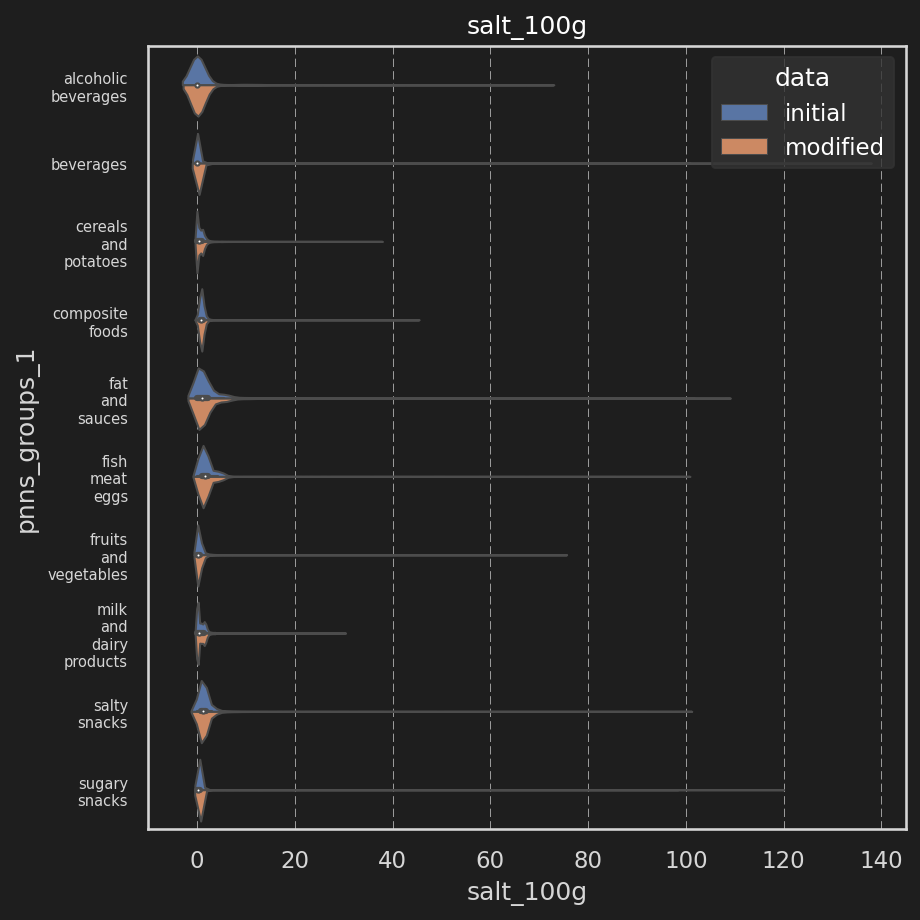

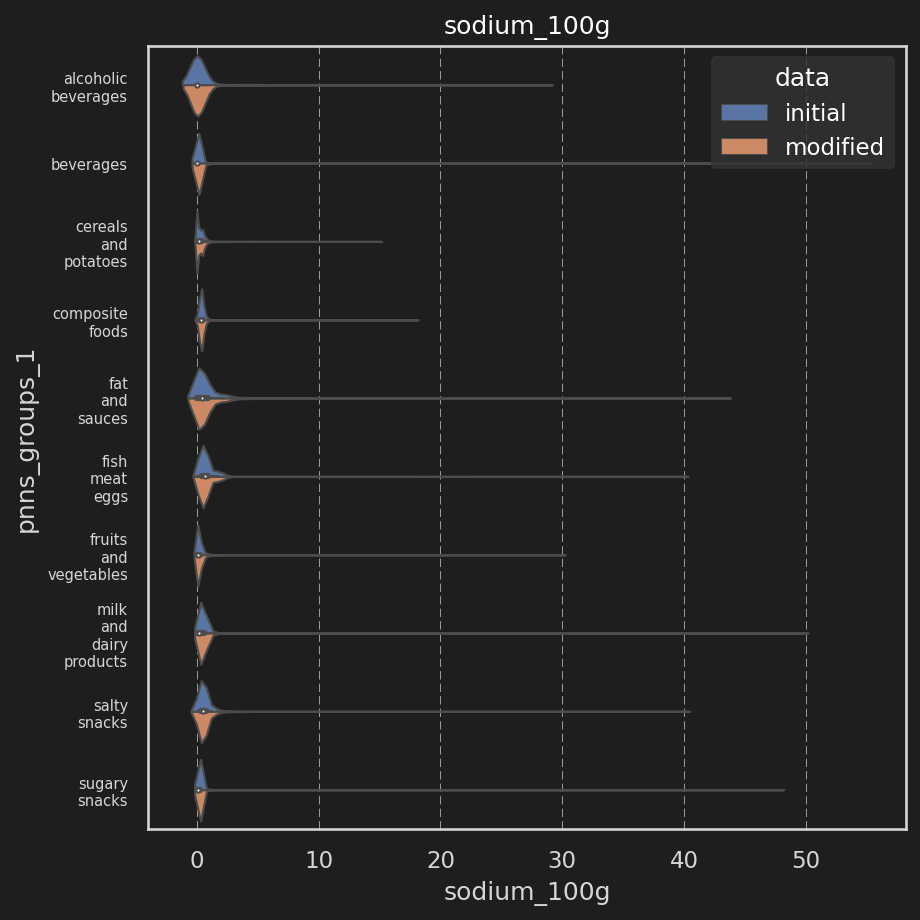

In [42]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


v_isall_filled = data[keys_100g].isna().sum(1) == 0


imp = IterativeImputer(max_iter=20, random_state=0)

# X_fit = np.hstack( (xtrain, ytrain.reshape(-1,1)) )

imp.fit( data.loc[ v_isall_filled, keys_100g].values )
IterativeImputer(random_state=0)

# X_test = np.hstack( (xtest, np.full(shape=xtest[:,:1].shape, fill_value=np.nan) ) )

# X_pred = imp.transform( data[keys_100g].values )
# data_imputer = pd.Series( {key: x for key,x in zip( keys_100g, X_pred.T )} )
# data_imputer['pnns_groups_1'] = data['pnns_groups_1']

data_imputer = data.copy()
data_imputer['data'] = data_imputer['data'].map( {'initial': 'modified'} )

data_imputer.loc[ ~v_isall_filled, keys_100g ] = \
                imp.transform( data.loc[~v_isall_filled, keys_100g ].values )

print('Number of added values:')
display( data[keys_100g].isna().sum(0) - data_imputer[keys_100g].isna().sum(0) )


for key in keys_100g:
    fig, ax = plt.subplots( figsize=(16*cm,16*cm) )
    ax.set_title( key )
    sns.violinplot( y='pnns_groups_1', x=key, data=pd.concat((data, data_imputer)), ax=ax,
        linewidth=1, scale='count', hue='data', split=True )
    # axs[0].set_xticklabels([])
    ax.set_yticklabels( [label.get_text().replace(' ', '\n') for label in ax.get_yticklabels()] , fontsize=7 )
    # axs[1].set_ylabel( axs[1].get_ylabel() + ' (ajout Imputer)')

    fig.tight_layout()

    # ax.legend( ncols=4, fontsize=7 )
    # break


***
# K-nn : nutriscore

Définition d'une fonction k-nn

In [43]:
def fit_and_test_knn( xtrain,ytrain, xtest,ytest, kmin, kmax ):
    errors, dico_knn = [], {}
    for k in range(kmin, min(kmax+1, len(ytrain) ) ):
        print('k: {:02}'.format(k), end='\r')
        if ytrain.dtype in ['object', 'category']:
            knn = neighbors.KNeighborsClassifier(k)
        else:
            knn = neighbors.KNeighborsRegressor(k)
        dico_knn[k] = knn
        # knn.fit(xtrain, ytrain)
        errors.append(100*(1-knn.fit(xtrain, ytrain).score(xtest, ytest) ) )
    return dico_knn, np.array(errors)

Définition d'une fonction plot

In [58]:
def plot_knn( kmin, errors, ntrain, ntest, xtest_scaled,
            ytest, knn, key_target, key=None,
            label=None, axs=None, color='b' ):
    imin_error_knn = np.argmin(errors)
    k_min_error = kmin + imin_error_knn

    if axs is None:
        fig, axs = plt.subplots( ncols=2, figsize=(20*cm, 8*cm))
    else:
        fig = axs[0].get_figure()

    ax = axs[0]
    if not ytest is None and len(ytest) > 0:
        if key is None:
            fig.suptitle( 'n train: {:}, n test: {:}'.format( ntrain, len(ytest) ) )
        else:
            fig.suptitle( '{:} - n train: {:}, n test {:}'.format(key, ntrain, len(ytest) ) )

    ax.plot( range(kmin, kmin+len(errors)), errors, 'o-', color=color, label=label )
    ax.plot( [k_min_error], [errors[imin_error_knn]], 'or' )
    ax.set_xlabel( 'n neighbors')
    ax.set_ylabel(r'100*(1-R$^2$)')
    ax.annotate( '{:.2f}%'.format(errors[imin_error_knn]), 
            [k_min_error, errors[imin_error_knn] + 0.1*np.ptp(errors) ],
            color='r', va='bottom', ha='center')

    if label is None:
        label = 'prediction'
    else:
        label = None

    ax = axs[1]
    if not ytest is None and len(ytest) > 0: 
        ax.plot( ytest, 'r', label='y test' )
    ax.plot( knn.predict( xtest_scaled ), 'o', color=color,
                markersize=1, zorder=0, label=label )
    lgnd = ax.legend( )
    for handle in lgnd.legendHandles:
        handle.set_markersize(6.0) # change markersize in legend

    ax.set_xlabel( 'i test' )
    ax.set_ylabel( key_target )

    fig.tight_layout()
    return fig, axs

(<Figure size 1181.1x472.441 with 2 Axes>,
 array([<AxesSubplot: xlabel='n neighbors', ylabel='100*(1-R$^2$)'>,
        <AxesSubplot: xlabel='i test', ylabel='nutriscore_score'>],
       dtype=object))

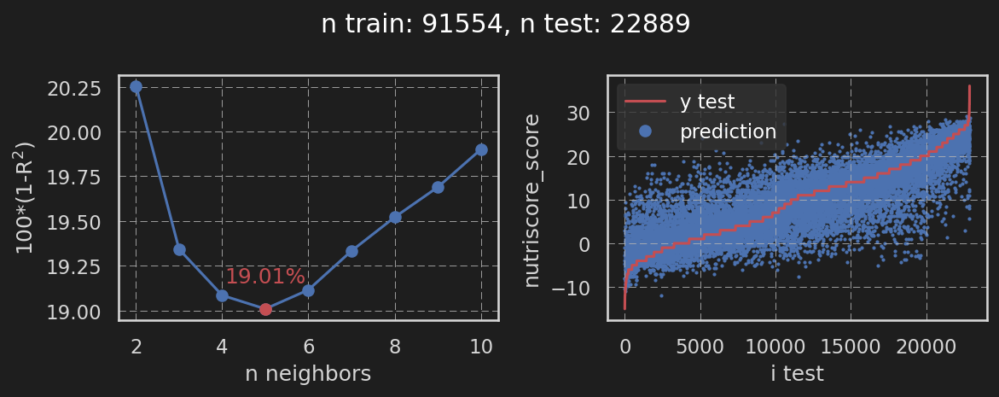

In [45]:
key_target = 'nutriscore_score'
sr_loc = data[keys_100g.tolist() + [key_target]].isna().sum(1) == 0


xtrain, xtest, ytrain, ytest = train_test_split( data.loc[sr_loc, keys_100g].values , 
                                    data.loc[sr_loc, key_target].values, train_size=0.8)

argsort = ytest.argsort()
xtest, ytest = xtest[argsort], ytest[argsort]

kmin, kmax = 2, 10

dico_knn, errors = fit_and_test_knn( xtrain,ytrain, xtest,ytest, kmin, kmax )

imin_error_knn = errors.argmin()
k_min_error = kmin + imin_error_knn
knn = dico_knn[imin_error_knn]

plot_knn( kmin, errors, len(ytrain), len(ytest), xtest, ytest, knn, key_target, key=None )

Les résultats semblent assez peu fiables. Des améliorations sont clairement à apporter.

## Vérification de la (non-)corrélation des variables
- `carbohydrates` et `sugars`, `fat` et `saturated-fat` sont assez évidemment corrélés
- `salt` et `sodium` sont quasi parfaitement corrélés 

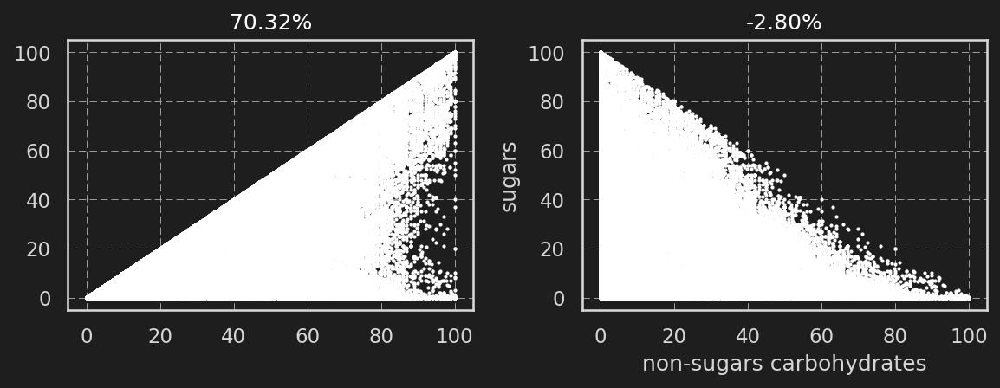

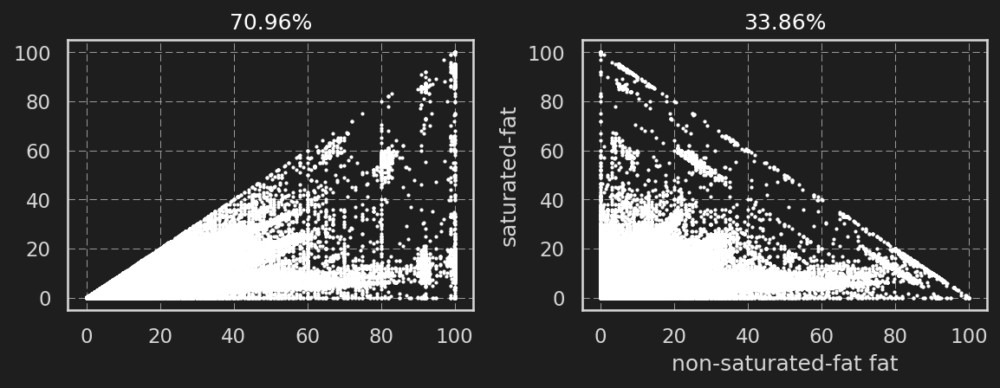

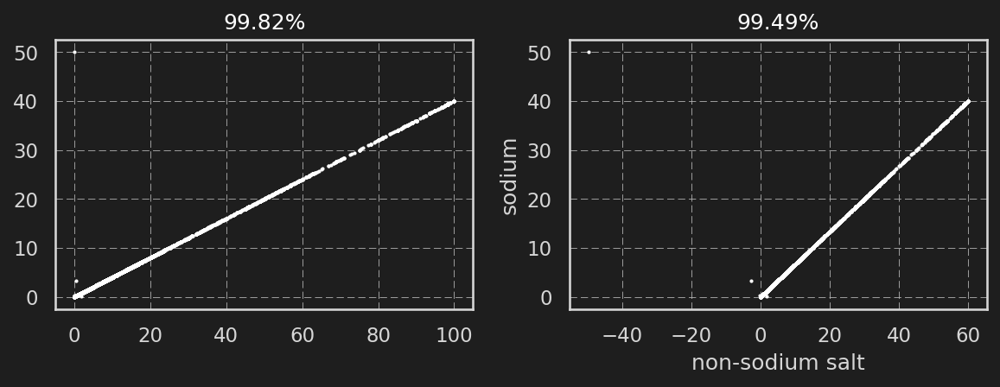

In [46]:
for key1,key2 in [('carbohydrates_100g','sugars_100g') , ('fat_100g', 'saturated-fat_100g'), ('salt_100g','sodium_100g') ]:
    df = data.loc[ data[[key1,key2]].isna().sum(1) == 0 , [key1,key2] ]
    fig, axs = plt.subplots( ncols=2, figsize=(20*cm,8*cm) )

    x, y = data[key1], data[key2]
    sr_loc = ~(x.isna() | y.isna())
    x, y = x.loc[sr_loc], y.loc[sr_loc]

    axs[0].plot( x, y, 'wo', markersize=1 )
    r = st.pearsonr( x, y)[0]
    axs[0].set_title('{:.2f}%'.format( 100*r ) )
    axs[1].set_xlabel( '{:}'.format( key1.replace('_100g', '') ) )
    axs[1].set_ylabel( '{:}'.format( key2.replace('_100g', '') ) )

    # df.plot( kind='scatter', x=key1, y=key2, s=1, c='w' , ax=axs[0] )

    axs[1].plot( x-y, y, 'wo', markersize=1 )
    r = st.pearsonr( x-y, y)[0]
    axs[1].set_title('{:.2f}%'.format( 100*r ) )
    
    axs[1].set_xlabel( 'non-{:} {:}'.format( key2.replace('_100g', ''), key1.replace('_100g', '') ) )
    axs[1].set_ylabel( '{:}'.format( key2.replace('_100g', '') ) )

    fig.tight_layout()

## Mise à jour des variables
Fonction pour extraire un nouveau dataset:
- sans sodium
- fat $\rightarrow$ non-saturated-fat
- carbohydrates $\rightarrow$ non-sugar-carbohydrates

In [47]:
def updated_data( data ):
    data_new = data[ ['energy-kj_100g', 'saturated-fat_100g', 'sugars_100g',
                    'proteins_100g', 'salt_100g'] ].copy()
    data_new['non-saturated-fat_100g'] = data['fat_100g'] - data['saturated-fat_100g']
    data_new['non-sugar-carbohydrates_100g'] = data['carbohydrates_100g'] \
                                                - data['sugars_100g']
    return data_new

Test avec les nouvelles variables : pas d'amélioration flagrante pour le moment

(<Figure size 1181.1x472.441 with 2 Axes>,
 array([<AxesSubplot: xlabel='n neighbors', ylabel='100*(1-R$^2$)'>,
        <AxesSubplot: xlabel='i test', ylabel='nutriscore_score'>],
       dtype=object))

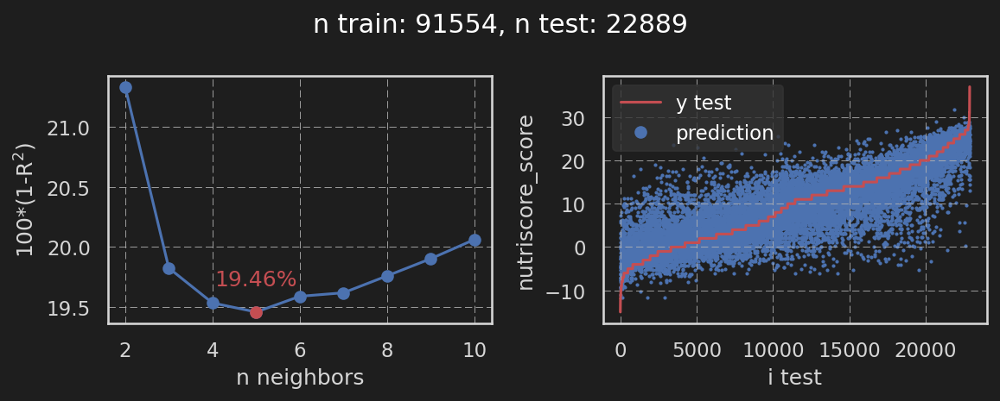

In [48]:
sr_loc = data[keys_100g.tolist() + [key_target]].isna().sum(1) == 0
xtrain, xtest, ytrain, ytest = train_test_split( updated_data(data.loc[sr_loc, keys_100g]).values , 
                                    data.loc[sr_loc, key_target].values, train_size=0.8 )

argsort = ytest.argsort()
xtest, ytest = xtest[argsort], ytest[argsort]

dico_knn, errors = fit_and_test_knn( xtrain,ytrain, xtest,ytest, kmin, kmax )

imin_error_knn = errors.argmin()
k_min_error = kmin + imin_error_knn
knn = dico_knn[imin_error_knn]

plot_knn( kmin, errors, len(ytrain), len(ytest), xtest, ytest, knn, key_target, key=None )


## Scaling
Centrer et normer les données améliore les résultats, mais les écarts restent conséquents.

(<Figure size 1181.1x472.441 with 2 Axes>,
 array([<AxesSubplot: xlabel='n neighbors', ylabel='100*(1-R$^2$)'>,
        <AxesSubplot: xlabel='i test', ylabel='nutriscore_score'>],
       dtype=object))

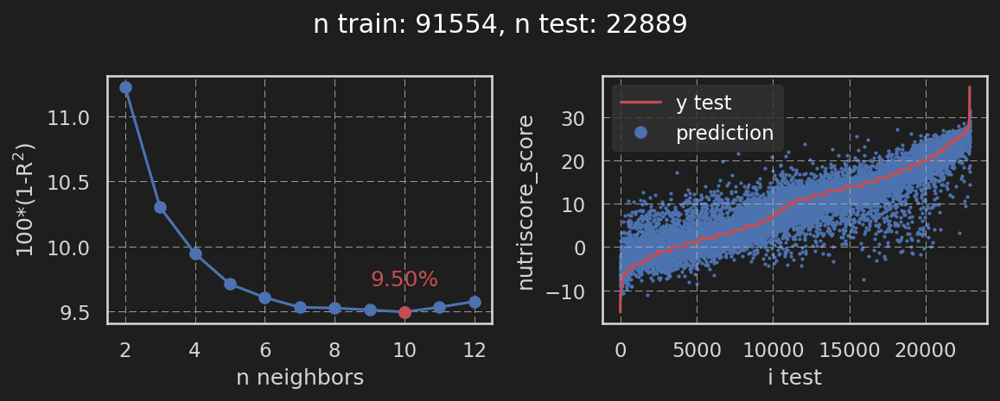

In [49]:
scaler = StandardScaler()
scaler.fit(xtrain)
xtrain_scaled = scaler.transform(xtrain)
xtest_scaled = scaler.transform(xtest)


kmin, kmax = 2, 12


dico_knn, errors = fit_and_test_knn( xtrain_scaled,ytrain, xtest_scaled,ytest, kmin, kmax )

imin_error_knn = errors.argmin()
k_min_error = kmin + imin_error_knn
knn = dico_knn[imin_error_knn]

plot_knn( kmin, errors, len(ytrain), len(ytest), xtest_scaled, ytest, knn, key_target, key=None )

## Avec fibres

In [50]:
data_w_fibres = updated_data(data.loc[sr_loc, keys_100g])
data_w_fibres['fiber_100g'] = data.loc[sr_loc, 'fiber_100g']

y_fibres = data.loc[sr_loc, key_target].values

xtrain, xtest, ytrain, ytest = train_test_split( data_w_fibres.values , 
                                    y_fibres, train_size=0.8 )

isna_train = np.isnan( xtrain[:,-1] )
isna_test = np.isnan( xtest[:,-1] )
xtrain[isna_train,-1] = 0. # supposition that NaN values corresponds to 0 values
xtest[isna_test,-1] = 0.

argsort = ytest.argsort()
xtest, ytest = xtest[argsort], ytest[argsort]


scaler = StandardScaler()
scaler.fit(xtrain[:,:-1])
xtrain_scaled = scaler.transform(xtrain[:,:-1])
xtest_scaled_0 = scaler.transform(xtest[:,:-1])


kmin, kmax = 2, 12


dico_knn_0, errors_0 = fit_and_test_knn( xtrain_scaled,ytrain, xtest_scaled_0,ytest, kmin, kmax )

imin_error_knn_0 = errors_0.argmin()
k_min_error_0 = kmin + imin_error_knn_0
knn_0 = dico_knn_0[imin_error_knn_0]

# fig, axs = plot_knn( kmin, errors, len(ytrain), len(ytest), 
#                 xtest_scaled, ytest, knn, key_target, key=None, label='without fiber' )


scaler = StandardScaler()
scaler.fit(xtrain)
xtrain_scaled = scaler.transform(xtrain)
xtest_scaled_1 = scaler.transform(xtest)




dico_knn_1, errors_1 = fit_and_test_knn( xtrain_scaled,ytrain, xtest_scaled_1,ytest, kmin, kmax )

imin_error_knn_1 = errors_1.argmin()
k_min_error_1 = kmin + imin_error_knn_1
knn_1 = dico_knn_1[imin_error_knn_1]

# axs[0].plot( range(kmin, kmax+1), errors, 'o-y', label='with fiber' )
# axs[0].legend()
# plot_knn( kmin, errors, len(ytrain), len(ytest), xtest_scaled, ytest, knn, key_target, key=None )

Affichage des résultats

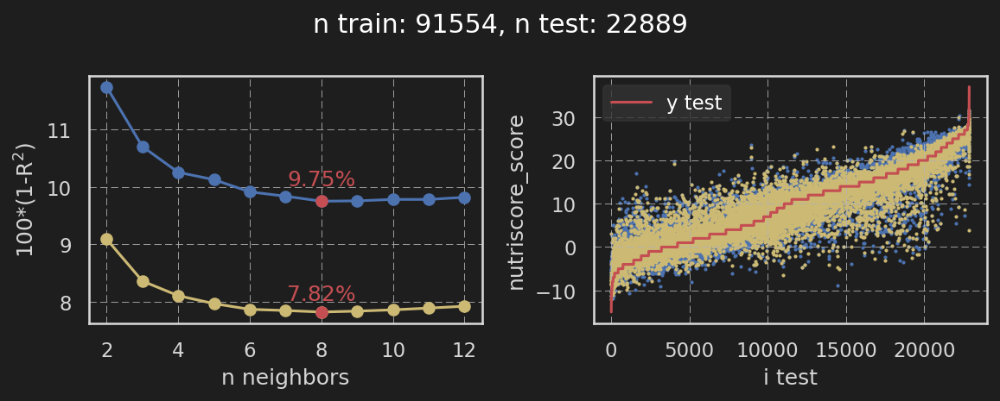

In [60]:
fig, axs = plt.subplots( ncols=2, figsize=(20*cm, 8*cm))
_ = plot_knn( kmin, errors_0, len(ytrain), len(ytest), xtest_scaled_0,
        ytest, knn_0, key_target, key=None,
        label='without fiber', axs=axs, color='b' )

_ = plot_knn( kmin, errors_1, len(ytrain), len(ytest), xtest_scaled_1,
        None, knn_1, key_target, key=None,
        label='with fiber', axs=axs, color='y' )

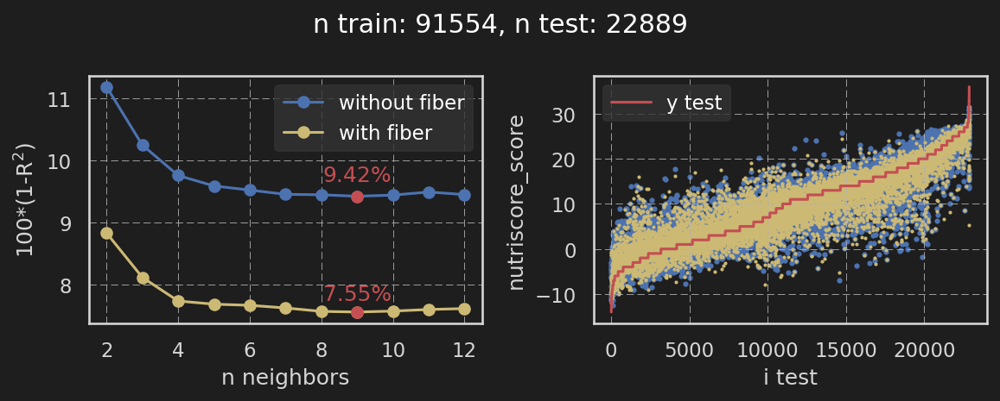

In [27]:
if False:
        fig, axs = plt.subplots( ncols=2, figsize=(20*cm, 8*cm))

        ax = axs[0]
        fig.suptitle( 'n train: {:}, n test: {:}'.format( xtrain.shape[0], len(ytest) ) )

        clr0 = 'b'
        clr1 = 'y'

        ax.plot( range(kmin, kmin+len(errors_0)), errors_0, 'o-', color=clr0, label='without fiber')
        ax.plot( range(kmin, kmin+len(errors_1)), errors_1, 'o-', color=clr1, label='with fiber')
        ax.plot( [k_min_error_0], [errors_0[imin_error_knn_0]], 'or' )
        ax.plot( [k_min_error_1], [errors_1[imin_error_knn_1]], 'or' )
        ax.set_xlabel( 'n neighbors')
        ax.set_ylabel(r'100*(1-R$^2$)')
        ax.annotate( '{:.2f}%'.format(errors_0[imin_error_knn_0]), 
                [k_min_error_0, errors_0[imin_error_knn_0] + 0.1*np.ptp(errors_0) ],
                color='r', va='bottom', ha='center')
        ax.annotate( '{:.2f}%'.format(errors_1[imin_error_knn_1]), 
                [k_min_error_1, errors_1[imin_error_knn_1] + 0.1*np.ptp(errors_1) ],
                color='r', va='bottom', ha='center')
        ax.legend()

        argsort = ytest.argsort()
        ax = axs[1]
        ax.plot( ytest[argsort], 'r', label='y test', zorder=2 )
        ax.plot( knn_0.predict( xtest_scaled_0 )[argsort], 'o', color=clr0, 
                markersize=2, zorder=0) #, label='prediction\nwithout fiber' )
        ax.plot( knn_1.predict( xtest_scaled_1 )[argsort], 'o', color=clr1, 
                markersize=1, zorder=0) #, label='prediction\nwith fiber' )

        lgnd = ax.legend( )
        for handle in lgnd.legendHandles:
        handle.set_markersize(6.0) # change markersize in legend

        ax.set_xlabel( 'i test' )
        ax.set_ylabel( key_target )

        fig.tight_layout()

## Ajout de la variable pnns_group (code)
Amélioration non négligeable des résultats
`Expliquer la hierachie / non hierachie`

(<Figure size 1181.1x472.441 with 2 Axes>,
 array([<AxesSubplot: xlabel='n neighbors', ylabel='100*(1-R$^2$)'>,
        <AxesSubplot: xlabel='i test', ylabel='nutriscore_score'>],
       dtype=object))

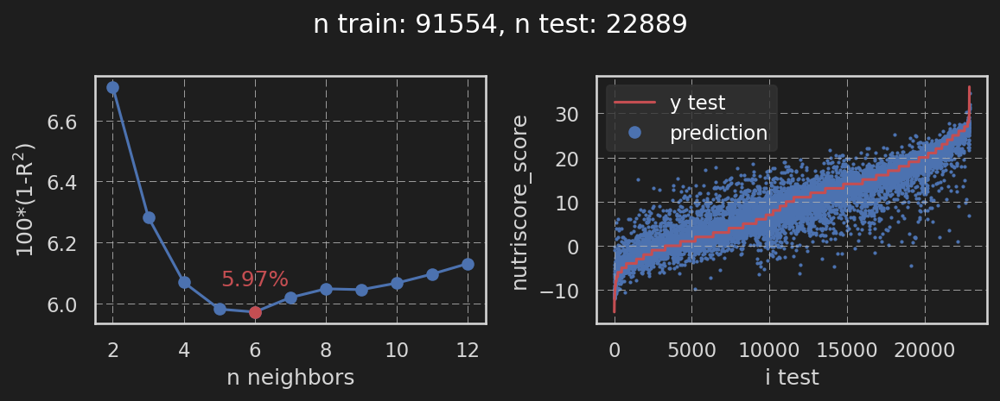

In [62]:
data_new = updated_data(data.loc[sr_loc, keys_100g.tolist() ])
data_new['pnns_groups_1'] = data['pnns_groups_1'].cat.codes

data_new['fiber_100g'] = data.loc[sr_loc, 'fiber_100g']

xtrain, xtest, ytrain, ytest = train_test_split( data_new.values , 
                                data.loc[sr_loc, key_target].values, train_size=0.8)

argsort = ytest.argsort()
xtest, ytest = xtest[argsort], ytest[argsort]

isna_train = np.isnan( xtrain[:,-1] )
isna_test = np.isnan( xtest[:,-1] )
xtrain[isna_train,-1] = 0. # supposition that NaN values corresponds to 0 values
xtest[isna_test,-1] = 0.



scaler = StandardScaler()
scaler.fit(xtrain)
xtrain_scaled = scaler.transform(xtrain)
xtest_scaled = scaler.transform(xtest)


kmin, kmax = 2, 12

dico_knn, errors = fit_and_test_knn( xtrain_scaled,ytrain, xtest_scaled,ytest, kmin, kmax )

imin_error_knn = errors.argmin()
k_min_error = kmin + imin_error_knn
knn = dico_knn[imin_error_knn]

plot_knn( kmin, errors, len(ytrain), len(ytest), xtest_scaled, ytest, knn, key_target, key=None )


## K-NN par pnns_group
Résultats intéressants pour certaines catégories, mais pour la pluspart il n'y a pas asse de données

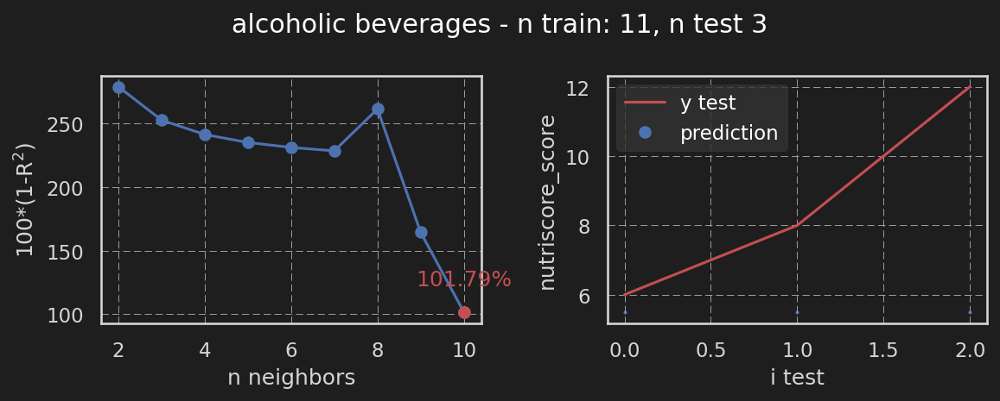

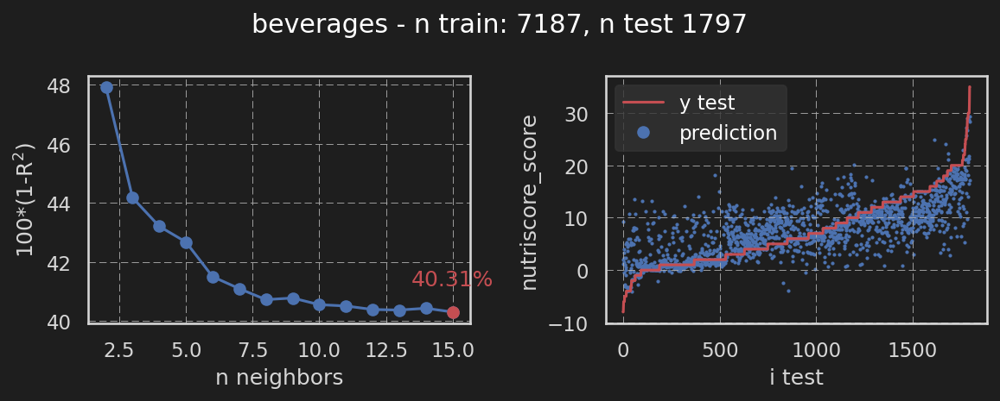

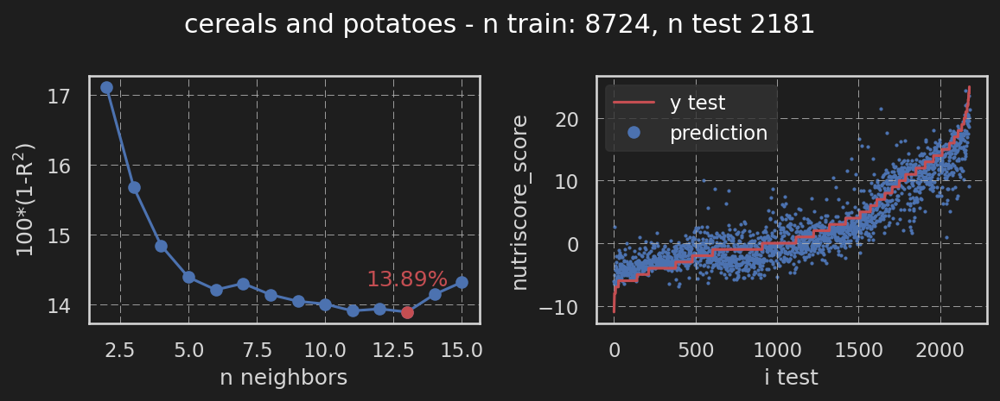

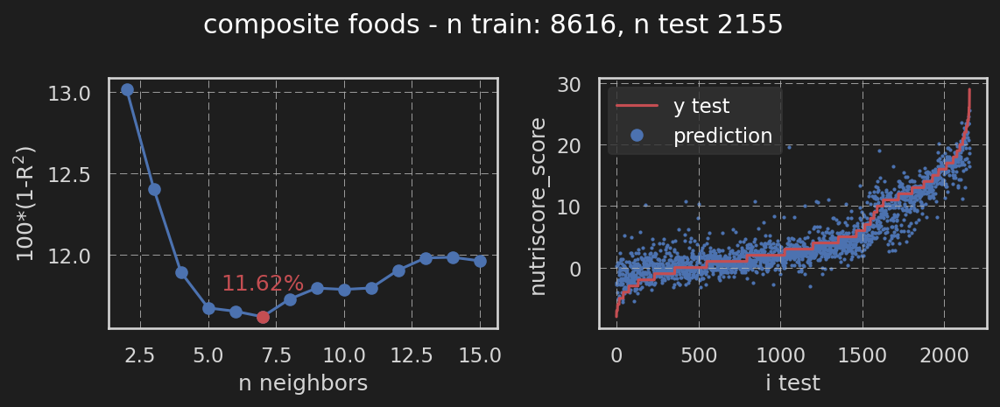

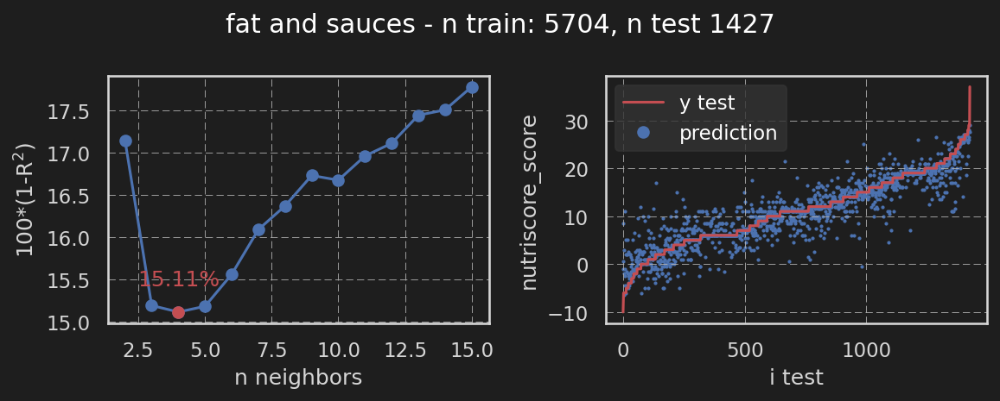

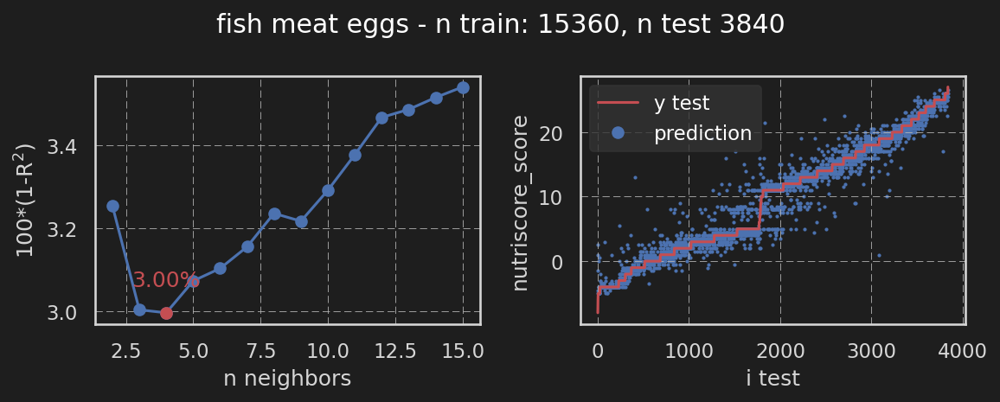

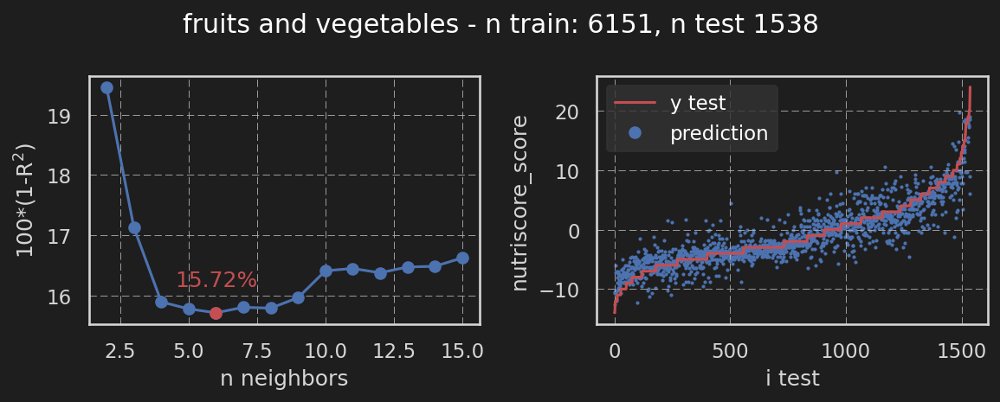

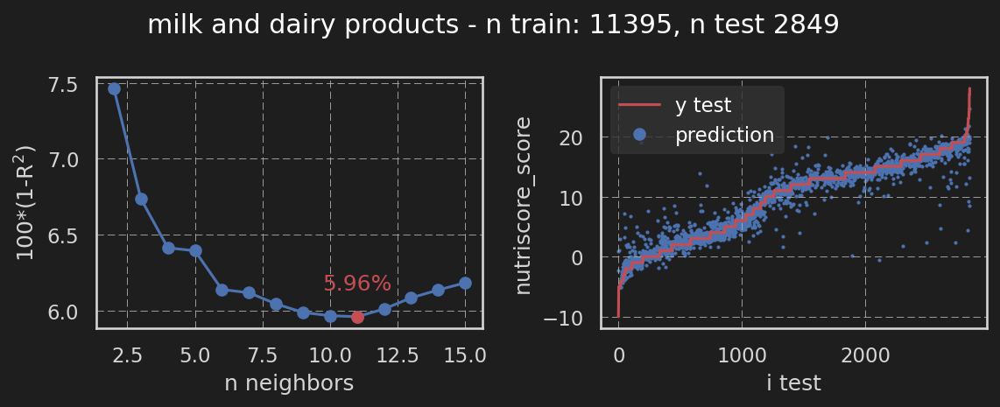

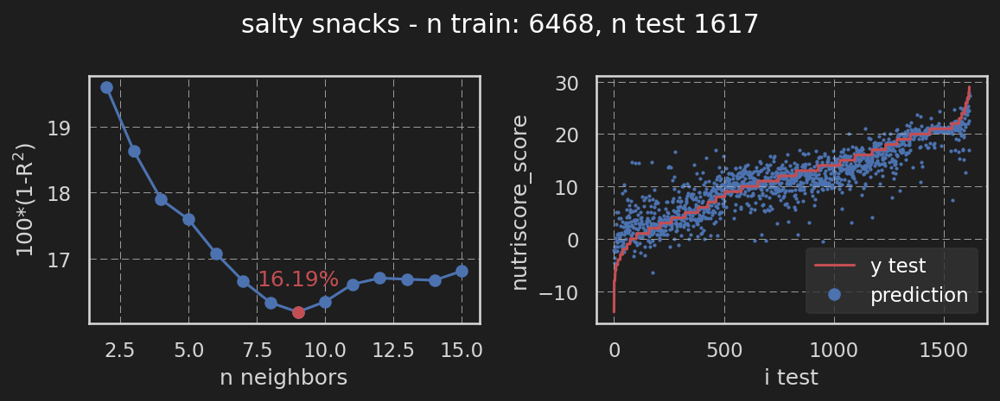

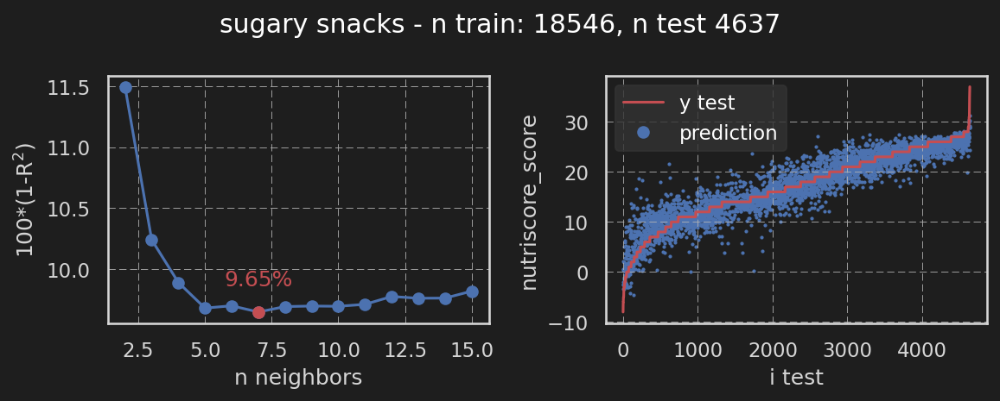

In [64]:
kmin, kmax = 2, 15

sr_0 = data[keys_100g.tolist() + [key_target]].isna().sum(1) == 0
None
dico_knns = {}
for key in data['pnns_groups_1'].cat.categories:
    sr_loc = (data['pnns_groups_1'] == key) & sr_0
    
    xtrain, xtest, ytrain, ytest = train_test_split( updated_data(data.loc[sr_loc, keys_100g]).values , 
                                    data.loc[sr_loc, key_target].values, train_size=0.8)

    argsort = ytest.argsort()
    xtest, ytest = xtest[argsort], ytest[argsort]

    scaler = StandardScaler()
    scaler.fit(xtrain)
    xtrain_scaled = scaler.transform(xtrain)
    xtest_scaled = scaler.transform(xtest)


    dico_knn, errors = fit_and_test_knn( xtrain_scaled,ytrain, xtest_scaled,ytest, kmin, kmax )

    imin_error_knn = errors.argmin()
    k_min_error = kmin + imin_error_knn
    knn = dico_knn[imin_error_knn]

    plot_knn( kmin, errors, len(ytrain), len(ytest), xtest_scaled, ytest, knn, key_target, key=key )

    dico_knns[key] = (knn, scaler)

In [65]:
print(keys_100g.tolist())

['energy-kj_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']


 # PCA

Code PCA réalisé à partir du notebook "P2C6_TP_cours_effectuees.ipynb" (cours OopenClassRooms Effectuez une analyse exploratoire de données). Version du notebook:
* version : 0.0.2
* last update:  2022-08-03
* author : [Alexandre Gazagnes](https://twitter.com/Alex_Gazagnes)

1. faire fonctions -> tools
1. PCA sur variables
1. afficher résultats
1. interprétation

## Extration des données
`prendre valeurs avec knn nutriscore`

In [66]:

data_new = updated_data(data[ keys_100g.tolist() + ['nutriscore_score'] ].dropna() )
# data_new['pnns_groups_1'] = data['pnns_groups_1'].cat.codes
pca_pnns_groups = data.loc[ data_new.index, 'pnns_groups_1'] # for analysis below

data_new['fiber_100g'] = data.loc[data_new.index, 'fiber_100g'].copy()
data_new['fiber_100g'].fillna(0., inplace=True) # Assuming NaN correspond to 0.
data_new['nutriscore_score'] = data.loc[data_new.index, 'nutriscore_score'].copy()

print( 'number of NaN:')
print( data_new.isna().sum(0) )

X = data_new.values
indexes = data_new.index
features = data_new.columns

print('\nX:', X.shape)
print('features:', features)

number of NaN:
energy-kj_100g                  0
saturated-fat_100g              0
sugars_100g                     0
proteins_100g                   0
salt_100g                       0
non-saturated-fat_100g          0
non-sugar-carbohydrates_100g    0
fiber_100g                      0
nutriscore_score                0
dtype: int64

X: (114443, 9)
features: Index(['energy-kj_100g', 'saturated-fat_100g', 'sugars_100g', 'proteins_100g',
       'salt_100g', 'non-saturated-fat_100g', 'non-sugar-carbohydrates_100g',
       'fiber_100g', 'nutriscore_score'],
      dtype='object')


## Scaling, instanciation et entrainement ACP

In [67]:
scaler_pca = StandardScaler()
X_scaled = scaler_pca.fit_transform(X) # fit and transform

# Vérification moyenne et écart type
idx = ["mean", "std"]
display( pd.DataFrame(X_scaled).describe().round(2).loc[idx, :] )

n_components = 6
pca = PCA(n_components=n_components)

# entrainement
pca.fit(X_scaled)

,0,1,2,3,4,5,6,7,8
mean,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


PCA(n_components=6)

## Éboulis des valeurs prorpres - Affichage de la variance captée
On note que l'inertie est relativement bien partagée, avec `X%` pour la première valeur propre et $\approx$ `9.35` pour la $6^{\text{ème}}$

<span style="color:red"> METTRE A JOURS DONNEES </span>

scree: [29.55 16.8  15.64 10.91  8.92  8.6 ]
sum scree: 90.41


Text(0.5, 1.0, 'Éboulis des valeurs prorpres')

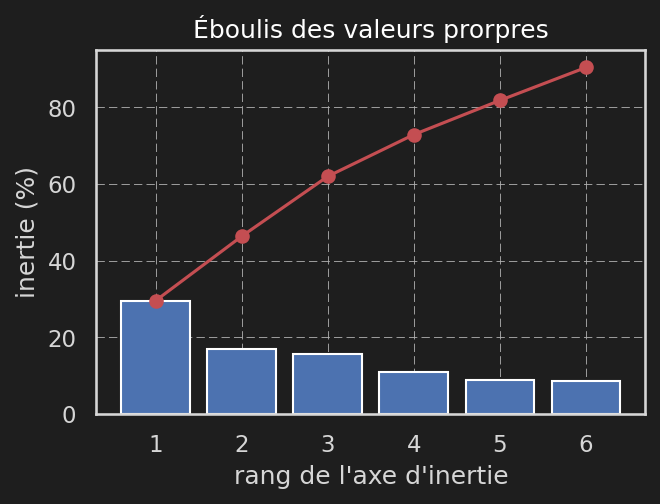

In [68]:
x_list = range(1, n_components+1)
scree = (pca.explained_variance_ratio_*100)
print('scree:', scree.round(2))
print('sum scree:', scree.sum().round(2))
fig, ax = plt.subplots( figsize=(12*cm,8*cm))
ax.bar( x_list, scree )
ax.plot( x_list, scree.cumsum(), c='r', marker='o')
ax.set_xlabel("rang de l'axe d'inertie")
ax.set_ylabel("inertie (%)")
ax.set_title('Éboulis des valeurs prorpres')

## Composantes

,F1,F2,F3,F4,F5,F6
energy-kj_100g,0.56,-0.12,0.26,-0.03,-0.10,-0.05
saturated-fat_100g,0.48,0.11,-0.12,-0.14,0.23,-0.13
sugars_100g,0.16,-0.63,-0.23,0.23,0.30,0.06
proteins_100g,0.12,0.56,0.20,0.03,0.47,-0.41
salt_100g,0.06,0.38,-0.07,0.82,-0.17,0.32
non-saturated-fat_100g,0.42,0.16,0.16,-0.32,-0.43,0.42
non-sugar-carbohydrates_100g,0.02,-0.27,0.59,0.30,-0.35,-0.50
fiber_100g,-0.00,-0.13,0.61,0.07,0.53,0.51
nutriscore_score,0.49,-0.08,-0.29,0.25,0.09,-0.11


<AxesSubplot: >

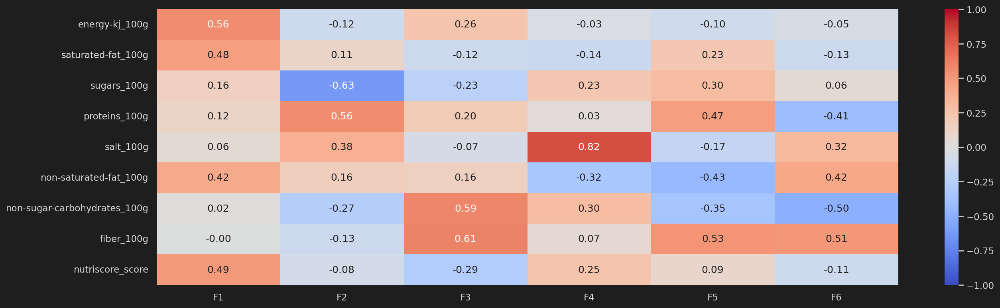

In [69]:
pcs = pd.DataFrame( pca.components_ )
pcs.columns = features
indexes = [f"F{i}" for i in x_list]
pcs.index = indexes
display( pcs.round(2).T ) #.sort_values(by=indexes , ascending=False) )
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

## Cercle des corrélations

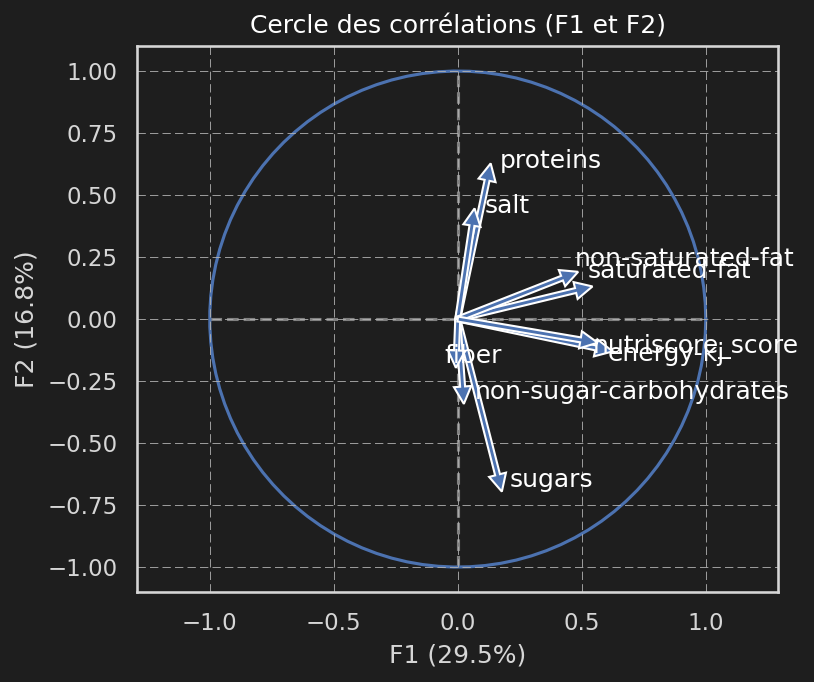

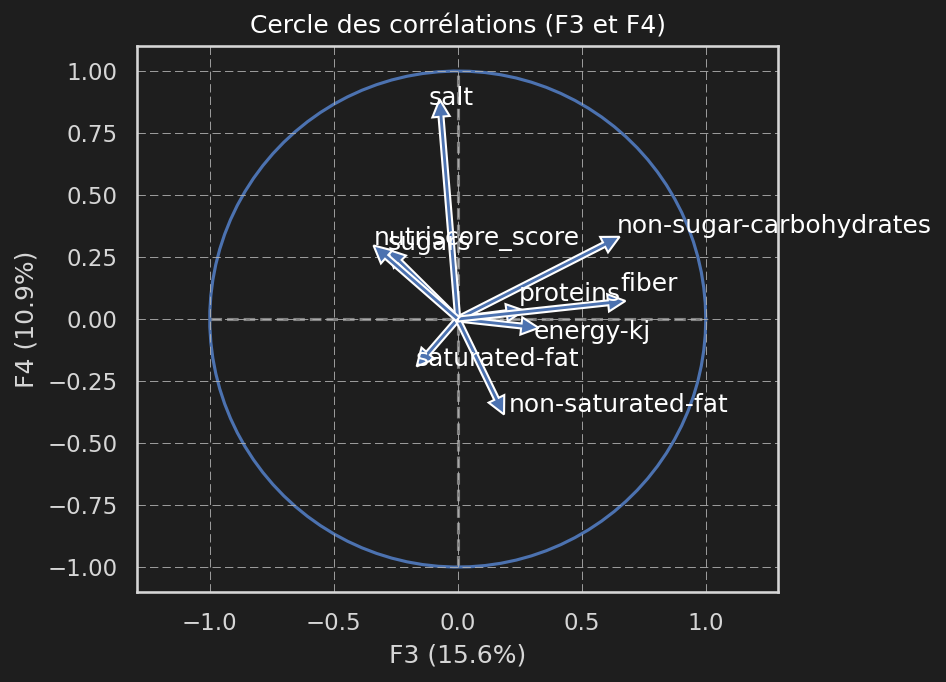

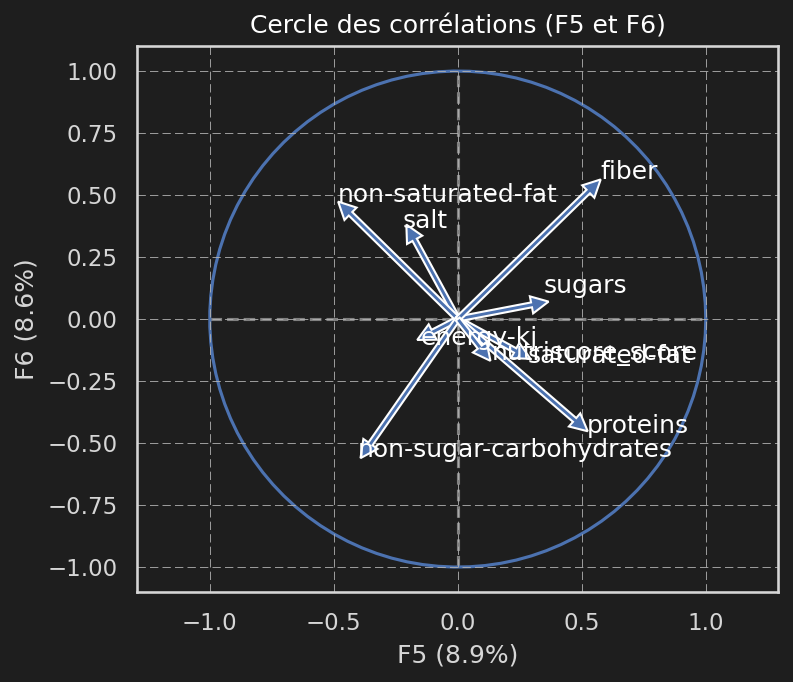

In [72]:
importlib.reload(tools)

features_2 = [feature.replace('_100g', '') for feature in features]
# features_2[features_2.index('saturated-fat')] += '\n' # for lisibility

for i in range(3):
    fig, ax = plt.subplots( figsize=(14*cm, 12*cm))
    tools.correlation_graph( pca, [i+i,i+i+1], features_2, ax=ax )

## Projection - plans factoriels

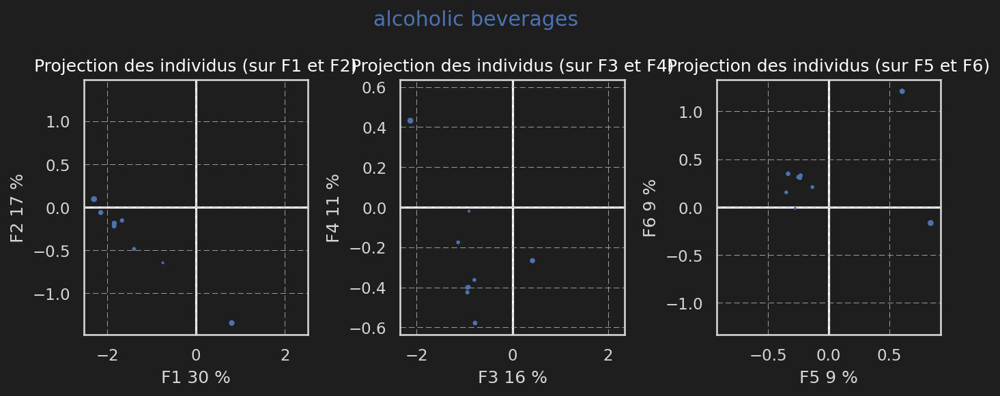

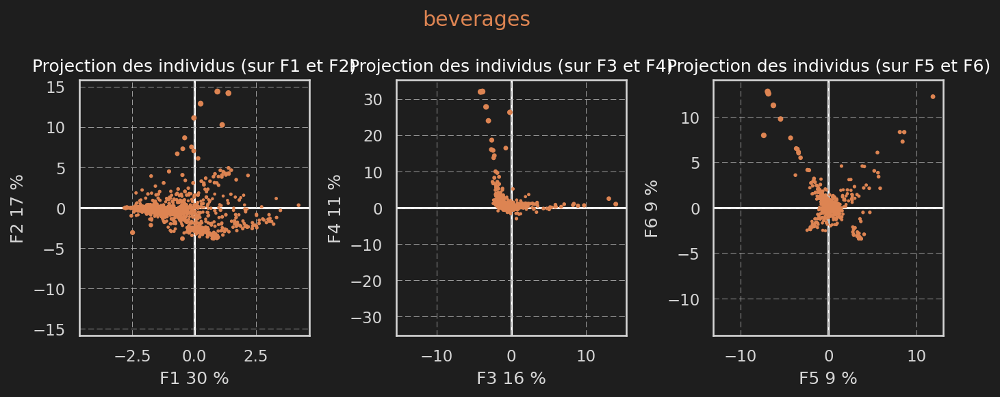

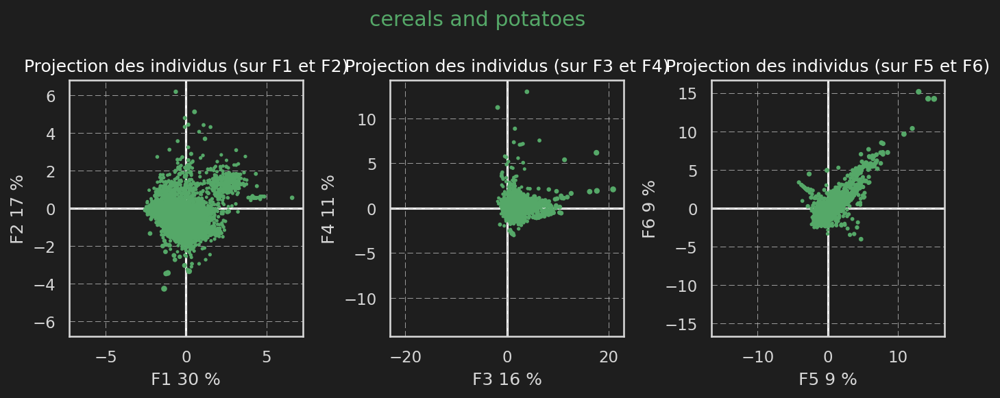

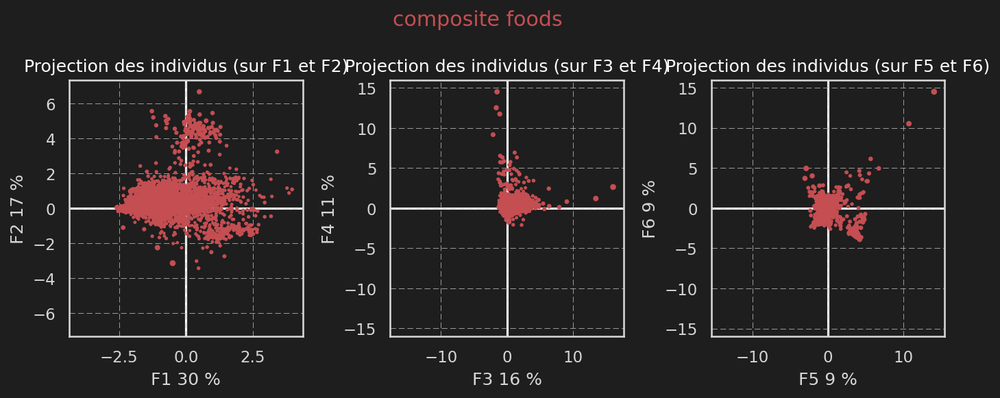

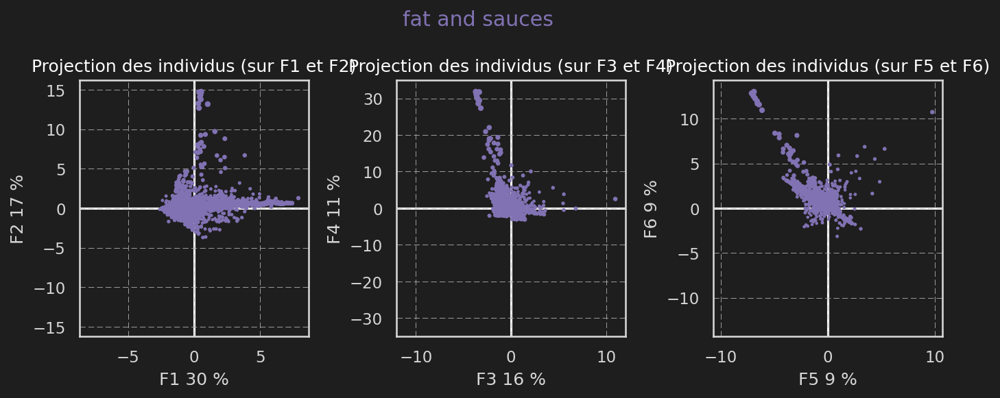

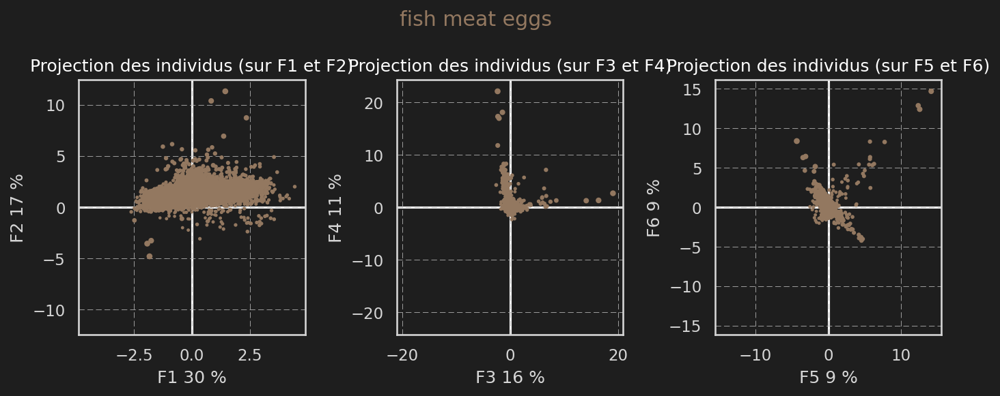

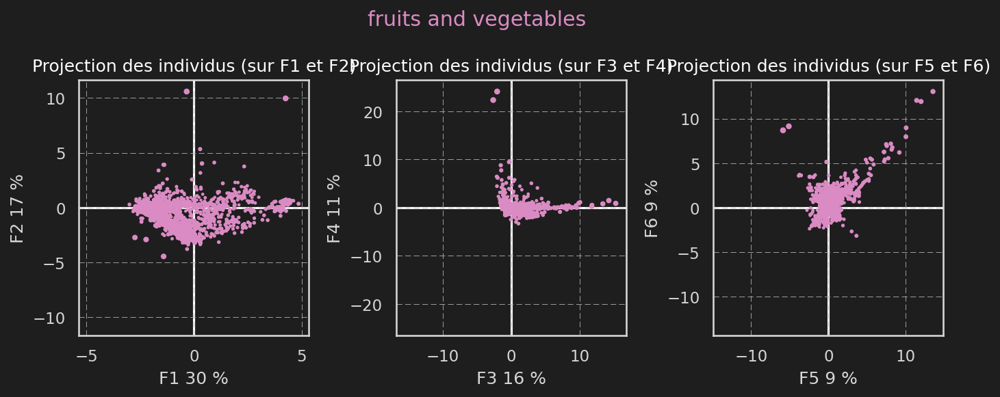

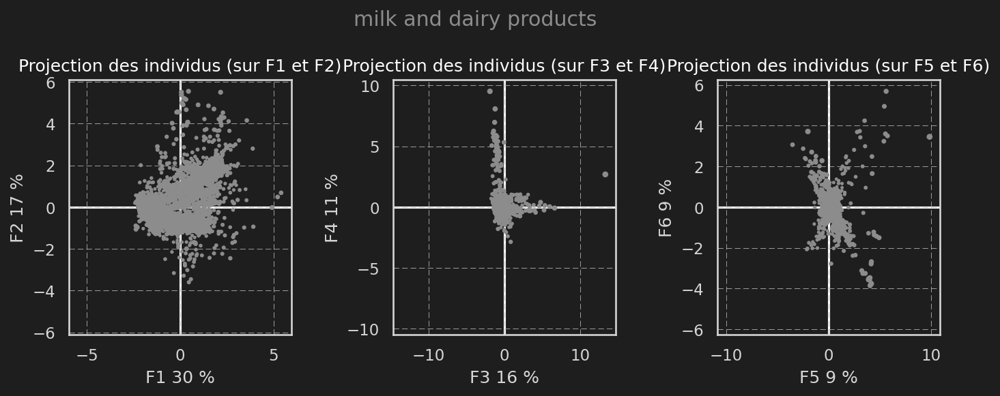

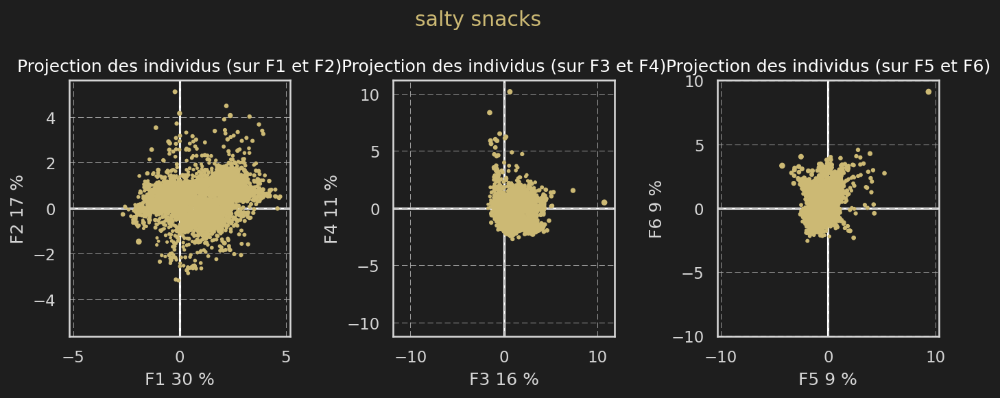

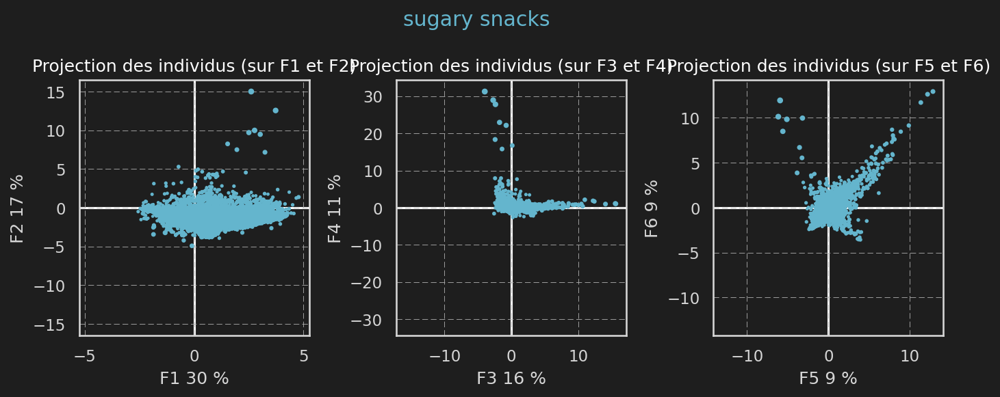

In [74]:
importlib.reload(tools)


prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

for name, clr in zip( data['pnns_groups_1'].cat.categories, colors ) :
    sr_loc = pca_pnns_groups == name

    fig, axs = plt.subplots( ncols=3, figsize=(24*cm,10*cm))
    fig.suptitle( name, color=clr )

    X_ = X_scaled[sr_loc.values]
    for i, ax in enumerate( axs ):
        tools.display_factorial_planes( X_, [i+i,i+i+1], pca, labels = None,
                                    color=clr, alpha=1, ax=axs[i],
                                    marker=".", smin=1, smax=10 )
        xlim, ylim = ax.get_xlim(), ax.get_ylim()
        ax.plot( xlim, [0,0], 'w', zorder=0)
        ax.plot( [0,0], ylim, 'w', zorder=0)
    fig.tight_layout()

## ...

***
# SUITE

## Remove empty and some usused/unusable columns

## Visualisation of NaN for new DataFrame

In [ ]:
print(sum_isnull.size, len(categories), len(data.keys()))
with pd.option_context('display.max_rows', None):
    print( sum_isnull[data.keys()].sort_values() )
msno.bar( data )

175 175 44
code                                                          0
created_t                                                     0
created_datetime                                              0
last_modified_t                                               0
last_modified_datetime                                        0
states_tags                                                   0
states                                                        0
states_en                                                     0
creator                                                       1
pnns_groups_2                                               108
pnns_groups_1                                               108
countries                                                  2300
countries_tags                                             2301
countries_en                                               2301
product_name                                              31080
energy_100g                  

## Check dtypes

In [ ]:
with pd.option_context('display.max_rows', None):
    display(data.dtypes)

code                                                       object
creator                                                    object
created_t                                                   int64
created_datetime                                           object
last_modified_t                                             int64
last_modified_datetime                                     object
product_name                                               object
categories                                                 object
categories_tags                                            object
categories_en                                              object
labels                                                     object
labels_tags                                                object
labels_en                                                  object
countries                                                  object
countries_tags                                             object
countries_

## Création de listes des catégories: string / float64 / others

In [ ]:
categories_float, categories_others = [], []
for cat in data.keys():
    if data.dtypes[cat] == 'float64': categories_float.append( cat )
    else: categories_others.append( cat )
# ax = msno.heatmap( data[ [key for key in data.keys() if (not key in categories_full) and (not '_100g' in key) or 'score' in key] ] )
categories_string = []
# print('\nstrings to lowercase')
for key in categories_others: 
    # print(key, 'type', data[key].dtype)
    if data[key].dtype != 'object': continue
    categories_string.append( key )
    # data[key].str.lower()

categories_others = [key for key in categories_others if not key in categories_string]
print("float categories:", categories_float )
print("\nstring categories:", categories_string )
print("\nothers categories:", categories_others )


float categories: ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'nutriscore_score', 'energy-kcal_100g', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g', 'nutrition-score-fr_100g']

string categories: ['code', 'creator', 'created_datetime', 'last_modified_datetime', 'product_name', 'categories', 'categories_tags', 'categories_en', 'labels', 'labels_tags', 'labels_en', 'countries', 'countries_tags', 'countries_en', 'ingredients_text', 'pnns_groups_1', 'pnns_groups_2', 'food_groups', 'food_groups_tags', 'food_groups_en', 'states', 'states_tags', 'states_en', 'main_category', 'main_category_en']

others categories: ['created_t', 'last_modified_t', 'nutriscore_grade', 'nova_group']


## Pré-traitement des variables `"category"`
1. rename_categories 
    - nitriscore_grade $\rightarrow$ upper
    - nova_group $\rightarrow$ int
1. String columns $\rightarrow$ str.lower
1. `'pnn_groups'` et `'food_groups'`: `unknown` $\rightarrow$ `NaN`  
1. food_groups: `'en:'` $\rightarrow$ `''`,  `'-'` $\rightarrow$ `' '`(for readability)
1. print first values for each category

In [ ]:
string_catergories_to_value_count = ['nova_group', 'nutriscore_grade', 'pnns_groups_1', 'pnns_groups_2', 'food_groups']

# Modification of categories (nitriscore_grade -> upper, nova_group -> int)
data['nutriscore_grade'] = data['nutriscore_grade'].cat.rename_categories( {cat:cat.upper() for cat in data['nutriscore_grade'].cat.categories} )
data['nova_group'] = data['nova_group'].cat.rename_categories( {cat:int(float(cat)) for cat in data['nova_group'].cat.categories} )


# lower all string
for key in string_catergories_to_value_count:
    print('\n', key, data[key].dtype.kind)
    # if data[key].dtype.kind != 'O': continue # Check if dtyp is object
    # if not pd.api.types.is_string_dtype( data[key].dtype ): continue
    if data[key].dtype != 'object': continue
    data[key] = data[key].str.lower()


# replace "en:" and "-" in food_groups to improve readability
data['food_groups'] = data['food_groups'].str.replace( 'en:' , '' , regex=False )
data['food_groups'] = data['food_groups'].str.replace( '-', ' ' , regex=False )


# replace 'unknown' to NaN
data.replace( {'pnns_groups_1':'unknown',
                'pnns_groups_2':'unknown',
                'food_groups':'unknown'}, np.nan, inplace=True )
# data.replace( { 'pnns_groups_1':{'unknown':np.nan},
#                 'pnns_groups_2':{'unknown':np.nan} }, inplace=True )



# astype category
# data[string_catergories_to_value_count] = data[string_catergories_to_value_count].astype('category')

for key in string_catergories_to_value_count:
    print('\n', key, data.dtypes[key])
    i = 0
    for value in data[key] :
        if pd.isnull( value ) : continue
        print(value )
        i += 1
        if i == 10: break


 nova_group O

 nutriscore_grade O

 pnns_groups_1 O

 pnns_groups_2 O

 food_groups O

 nova_group category
3
4
3
3
3
4
4
1
1
4

 nutriscore_grade category
D
E
D
A
D
B
B
B
A
D

 pnns_groups_1 object
beverages
milk and dairy products
beverages
fish meat eggs
fish meat eggs
milk and dairy products
fat and sauces
beverages
fish meat eggs
fish meat eggs

 pnns_groups_2 object
teas and herbal teas and coffees
dairy desserts
waters and flavored waters
fish and seafood
meat
cheese
dressings and sauces
fruit juices
meat
meat

 food_groups object
teas and herbal teas and coffees
dairy desserts
waters and flavored waters
fish and seafood
poultry
cheese
dressings and sauces
unsweetened beverages
poultry
poultry


## Calcul et affichage: value_counts des varialbes category

,nova_group,nutriscore_grade,pnns_groups_1,pnns_groups_2,food_groups
0,4,5,10,40,45


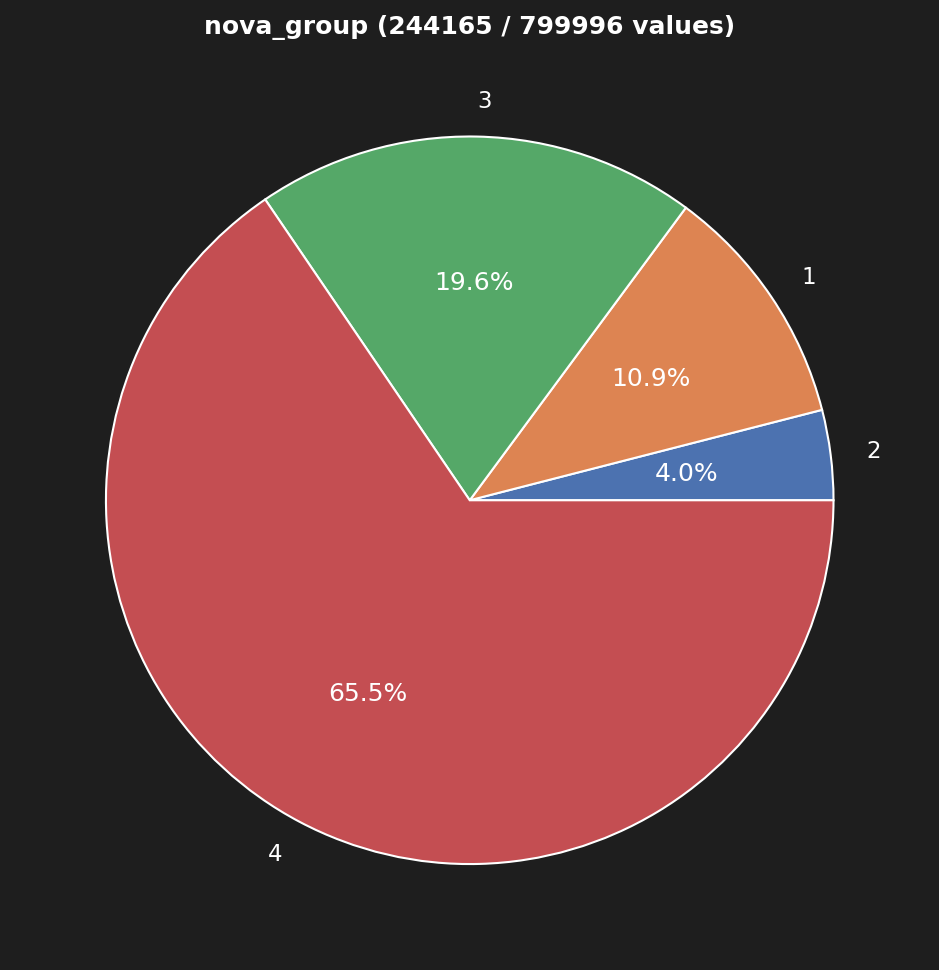

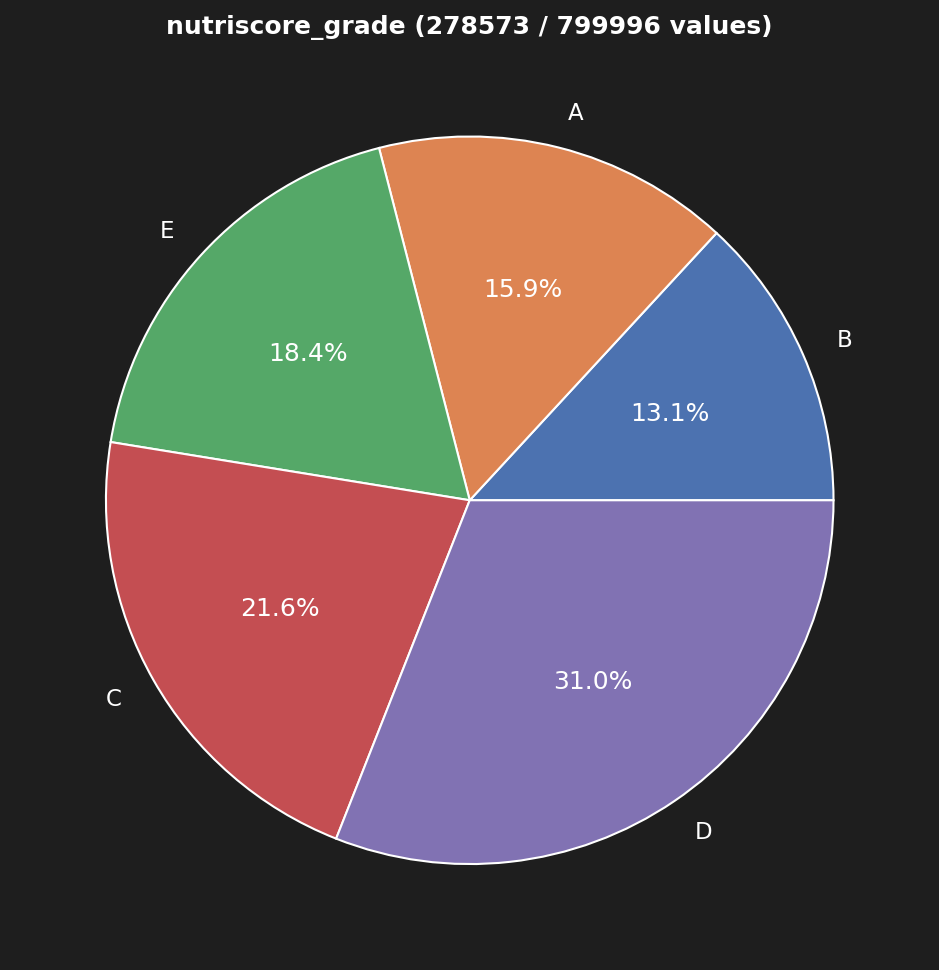

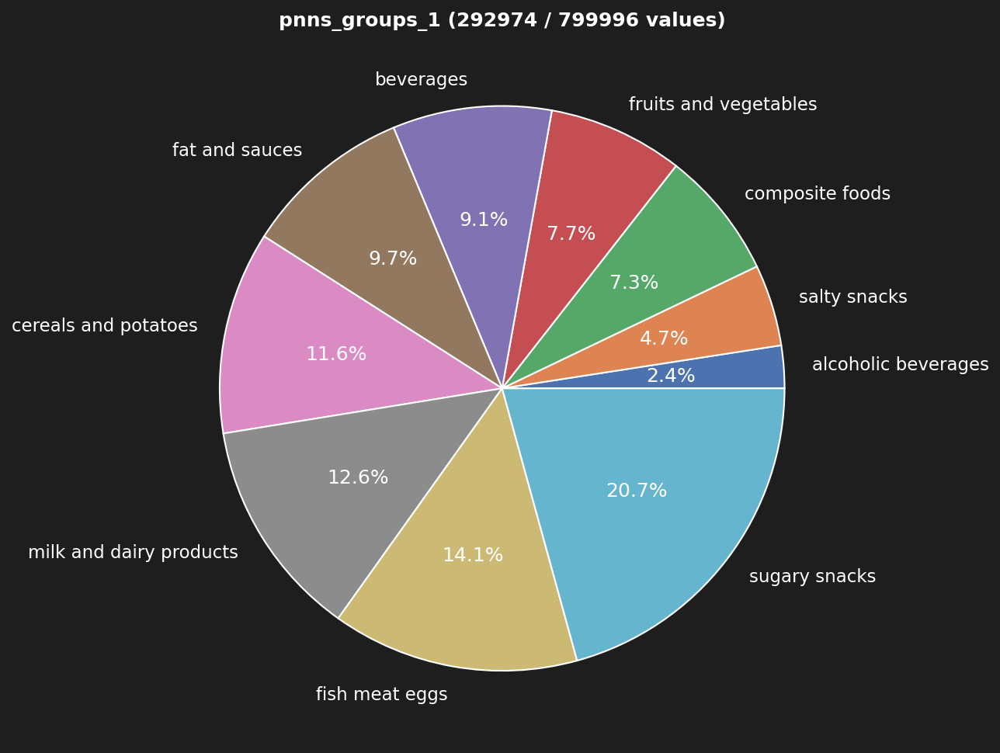

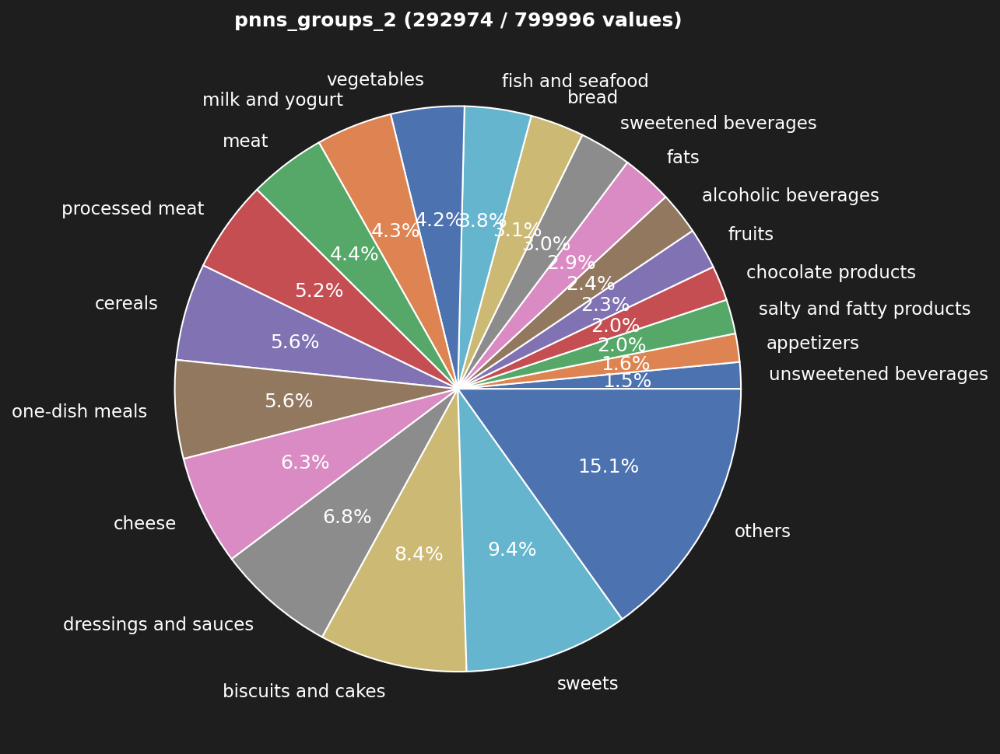

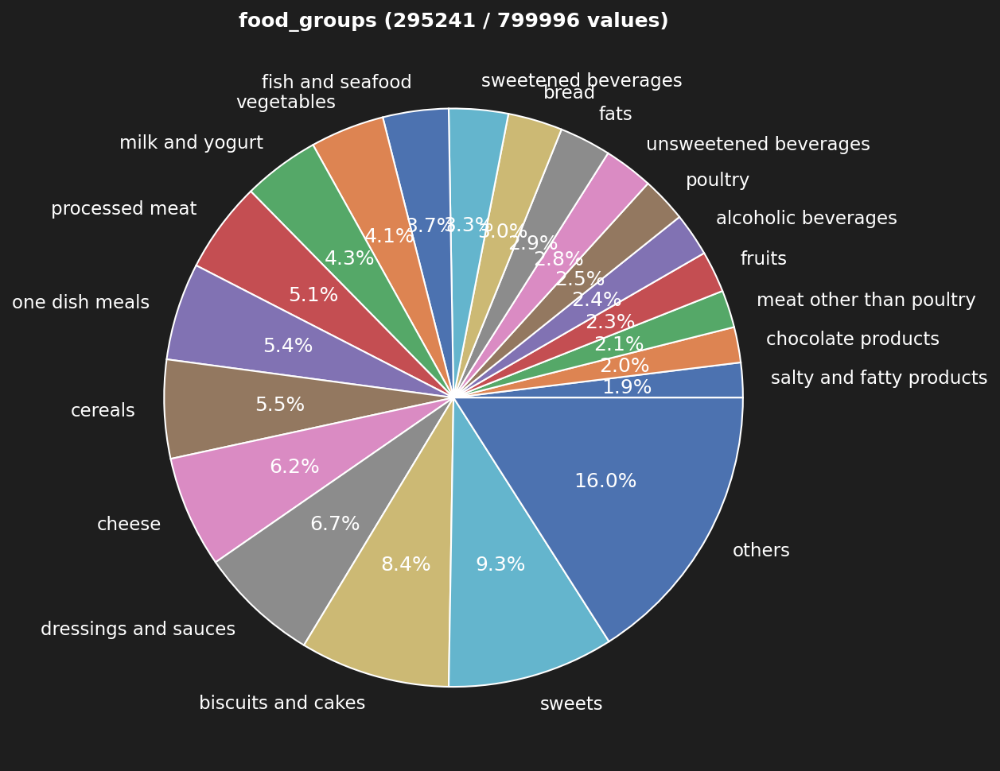

In [ ]:
dico_value_counts = { key: data[key].value_counts().sort_values() for key in string_catergories_to_value_count }
data_value_counts = pd.DataFrame( {key:[len(dico_value_counts[key])] for key in string_catergories_to_value_count} )
display(data_value_counts)
# data_value_counts.plot( kind='bar' )

# print('min counts', data_value_counts.iloc[0,:].min() )

n_lim_categories = 20
for key in string_catergories_to_value_count:
    sr_plot = dico_value_counts[key]
    n_sum = sr_plot.sum()

    if dico_value_counts[key].size > n_lim_categories:
        sr_plot = sr_plot.sort_values( ascending=False )
        sr_plot = pd.concat( [sr_plot[:n_lim_categories], 
                                pd.Series( [sr_plot[n_lim_categories:].sum()] , index=['others'] ),
                             ] )
        

    fig, ax = plt.subplots( figsize=(20*cm,20*cm))
    # pd.Series( sr_plot.sort_index( ascending=True ) ).plot( kind='pie' , ax=ax, autopct='%.1f%%' )
    pd.Series( sr_plot.sort_values( ascending=True ) ).plot( kind='pie' , ax=ax, autopct='%.1f%%' )
    ax.set_title( '{:} ({:} / {:} values)'.format( key, n_sum, n), weight='bold')
    ax.set_ylabel('')

    # fig, ax = plt.subplots( figsize=(20*cm, 10*cm*(data_value_counts[key][0]/10)) )
    # pd.Series( dico_value_counts[key] ).plot( kind='barh' , ax=ax )
    # ax.set_title(key)

if False: # barplot
    cat_pos = np.arange( len(string_catergories_to_value_count) )
    print(cat_pos)
    fig, ax = plt.subplots( figsize=(20*cm,10*cm))
    if True: # horizontal
        ax.bar( cat_pos, data_value_counts.iloc[0,:] , align='center')
        ax.set_xticks(cat_pos, labels=string_catergories_to_value_count)
    else:
        ax.barh( cat_pos, data_value_counts.iloc[0,:] , align='center')
        ax.set_yticks(cat_pos, labels=string_catergories_to_value_count)
        ax.invert_yaxis()  # labels read top-to-bottom

    fig.tight_layout()
    del cat_pos


## Comparaison pnns_groups_1/_2 et food_groups: tableaux de contingences
L'objectif est de vérifier si il est possible et utile de remplir la variable 'pnns_groups_1' à partir de 'pnns_groups_2' ou 'food_groups'

1. Copie des données pour pnns_groups et food_groups
1. msno heatmap $\rightarrow$ vérification de la corrélation entre les NaN des différentes variables
1. Drop des lignes avec au moin un NaN
1. Calcul et affichage d'une image type tableau de contingence

nan in data_chi:
pnns_groups_1    505679
pnns_groups_2    507982
food_groups      505717
dtype: int64

nan in data_chi:
pnns_groups_1    0
pnns_groups_2    0
food_groups      0
dtype: int64


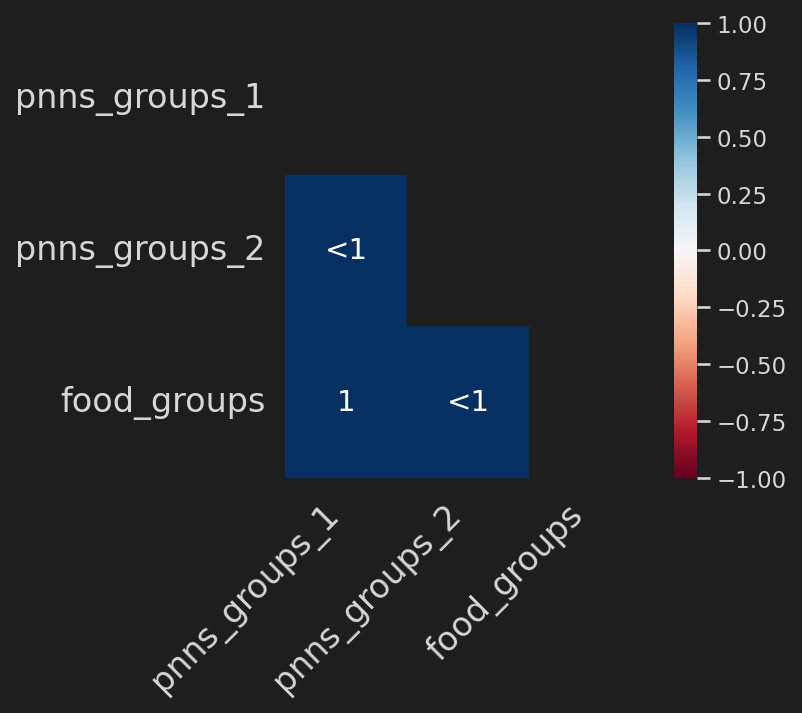

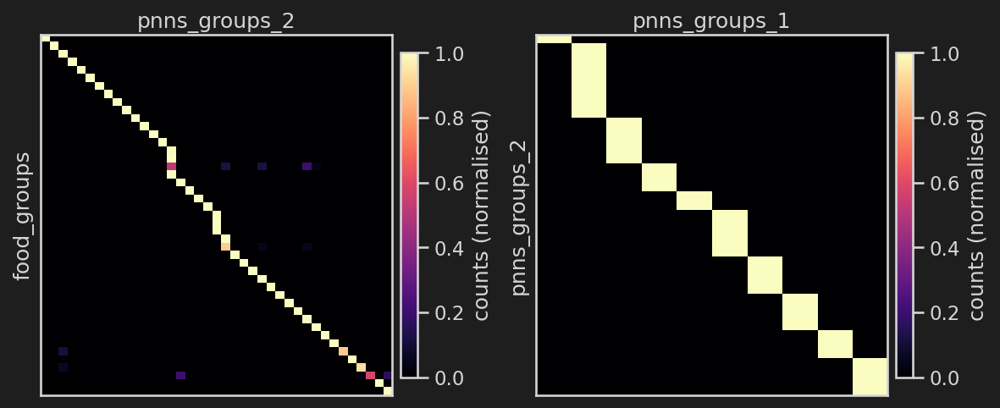

In [ ]:
data_chi = data[['pnns_groups_1', 'pnns_groups_2', 'food_groups']].copy()

print('nan in data_chi:')
print( data_chi.isnull().sum() )


fig, ax = plt.subplots( figsize=(10*cm,10*cm))
msno.heatmap( data_chi , ax=ax )

data_chi_isnull = data_chi.isnull()

# drop all rows with at least one NaN
data_chi.drop( data_chi.index[ data_chi_isnull.sum(1) > 0 ] , inplace=True )

# check drop
print('\nnan in data_chi:')
print( data_chi.isnull().sum() )

type_plot = ['xi', 'count'][1]

X2, Y2 = 'pnns_groups_2', 'pnns_groups_1'
X1, Y1 = 'food_groups', 'pnns_groups_2'

maps = [ None, None ]
fig, axs = plt.subplots( 1,2, figsize= (20*cm, 8*cm) )
for i, (X,Y) in enumerate( [ (X1,Y1), (X2,Y2) ] ):
    xi_ij, contingences = tools.chi2( data_chi, X, Y )

    image = contingences.values
    image = image[:-1,:-1] / image[:-1,-1:]
    argmax_col = image.argmax(1)
    maps[i] = pd.Series( { key_in:contingences.keys()[imax_col] for key_in, imax_col in zip(contingences[:-1].index, argmax_col)} )
    argsort_rows = argmax_col.argsort()
    # display( contingences.iloc[argsort_rows,:] )
    if type_plot == 'xi':
        image = xi_ij.values[:-1,:-1]
        label = r'$\xi_{ij} \, / \, \xi_{n}$'
    else:
        label = r'counts (normalised)'
    image = image[ argsort_rows ]

    # figsize = tools.image_size_from_height_and_shape( 12*cm, image.shape, xmargin=1*cm)
    # print( 'figsize', figsize)
    # fig, ax = plt.subplots( figsize=figsize )
    im = axs[i].imshow( image , cmap='magma', aspect='auto' )
    # axs[i].axis('off')
    # cb = plt.colorbar( im, ax=ax, orientation='horizontal', pad=0.01, label=r'$\xi_{ij} \, / \, \xi_{n}$')
    cb = plt.colorbar( im, ax=axs[i], pad=0.02, shrink=[0.9, 0.9][i], label=label)

axs[0].set_xlabel(Y1)
axs[0].set_ylabel(X1)

axs[1].set_xlabel(Y2)
axs[1].set_ylabel(X2)
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top') 


# display( contingences )
# display( maps[0] )
# display( maps[1] )

# map food_group -> pnns_groups_1
# there are some 'pnns_groups_1' values in the 'food_groups' for which 'pnns_groups_1' is NaN
food_to_pnns_groups = pd.concat( (maps[1][maps[0]], 
                pd.Series( {key:key for key in dico_value_counts['pnns_groups_1'].keys()} ) ) )


fig.tight_layout( pad=0.4 )
plt.show()
del image, cb, im, axs, fig
del X1,Y1, X2,Y2, maps

## Gestion des NaN dans "pnns_groups_1"
1. détection des NaN
1. chercher NaN "pnns_groups_1" et non NaN "food_groups"
1. remplacer selon "food_groups" et "food_to_pnns_groups"

In [ ]:
print( "sum 'pnns_groups_1 NaN and 'pnns_groups_2' not Nan: {:}".format( 
    ( data_chi_isnull['pnns_groups_1'] & ~data_chi_isnull['pnns_groups_2'] ).sum() ) )

sum 'pnns_groups_1 NaN and 'pnns_groups_2' not Nan: 0


In [ ]:
b_map = data_chi_isnull['pnns_groups_1'] & ~data_chi_isnull['food_groups']
# display( food_to_pnns_groups)
data.loc[b_map, 'pnns_groups_1'] = food_to_pnns_groups[ data.loc[b_map,'food_groups'] ].values

***
# Gestion et analyse uni-varié des variables float
Mis à NaN:
- (nitruscore < -15) & (nutriscore > 40)
- values < 0 (sauf nutriscore)
- values > 100 (sauf energy)
- energy > 900 (kcal) <span style="color:orange"> compétence métier </span>
- sodium > salt
- saturated-fat > fat
- sugars > carbohydrates

Check $\sum$("proteins", "carbohydrates", "fat" ) > 100

<span style="color:red"> Quid de la somme > 100 ? quelle limite ? </span>

In [ ]:
# A VOIR POUR SPEED UP ?
if False:
    _, bp = pd.DataFrame.boxplot(df, return_type='both')

    outliers = [flier.get_ydata() for flier in bp["fliers"]]
    boxes = [box.get_ydata() for box in bp["boxes"]]
    medians = [median.get_ydata() for median in bp["medians"]]
    whiskers = [whiskers.get_ydata() for whiskers in bp["whiskers"]]

,product_name,proteins_100g,carbohydrates_100g,fat_100g,sum_100g
369,Sucre roux,0.00,100.000000,0.100000,100.1
1072,sweet soy sauce,2.60,99.800000,0.000000,102.4
1103,Gaufres sucrées au chocolat,23.00,53.299999,25.700001,102.0
1362,Pisto con salmon y quinoa,30.10,45.480000,29.100000,104.7
1366,Fisherman's Friend pomme cannelle,0.00,98.800000,1.300000,100.1
...,...,...,...,...,...
797669,Lindt HELLO XMAS Cherry,46.70,54.000000,35.000000,135.7
797687,Zucchero Int. bio Cocco GR230 E,1.80,97.000000,1.500000,100.3
797873,Les croquants chocolat bio,7.30,67.000000,27.000000,101.3
798816,Lenguas Ketydul,5.70,67.100000,27.500000,100.3


,nutriscore_score,nutrition-score-fr_100g
count,277591.000000,277594.000000
mean,9.110976,9.111072
std,8.840131,8.840151
min,-15.000000,-15.000000
25%,1.000000,1.000000
50%,10.000000,10.000000
75%,16.000000,16.000000
max,40.000000,40.000000
IQ,15.000000,15.000000


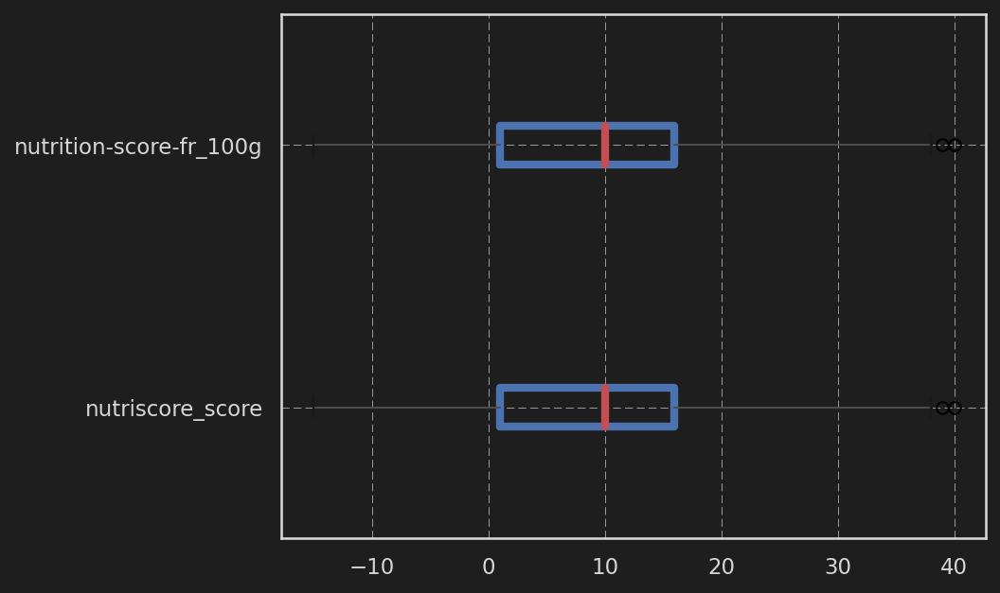

,energy-kcal_100g
count,613009.000000
mean,270.542555
std,191.147619
min,0.000000
25%,100.000000
50%,259.000000
75%,400.000000
max,900.000000
IQ,300.000000


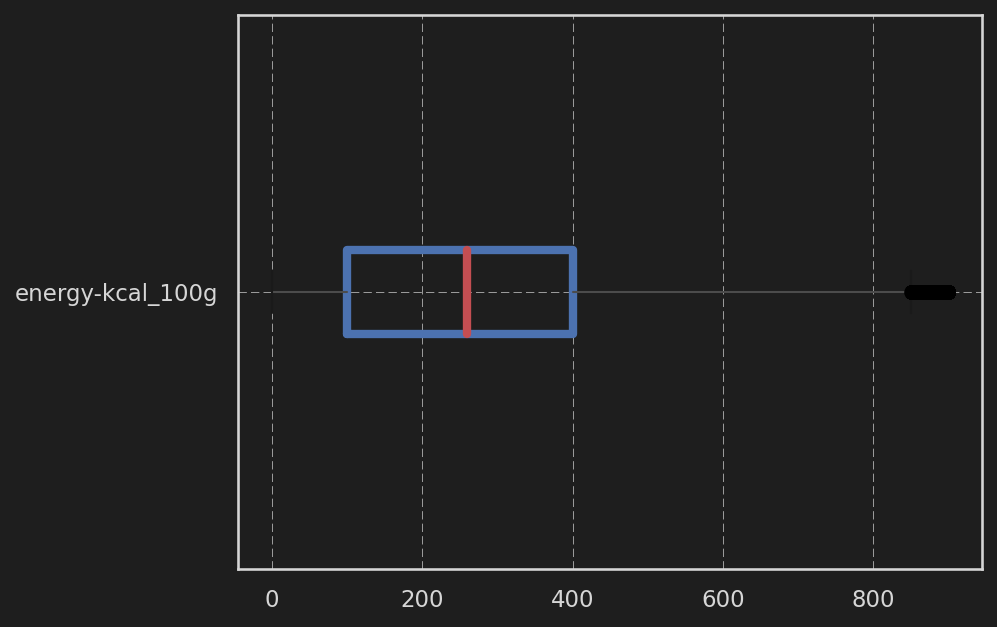

,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
count,627690.000000,610569.000000,627529.000000,620299.000000,628226.000000,582539.000000,582533.000000,272274.000000
mean,13.669906,5.056372,28.078364,13.005056,8.710977,1.359247,0.543701,8.237656
std,17.592071,7.756347,27.914560,19.350697,10.013554,4.652734,1.861109,21.662131
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.800000,0.100000,3.530000,0.600000,1.330000,0.082500,0.033000,0.000000
50%,7.000000,1.800000,15.384615,3.570000,6.000000,0.582500,0.233000,0.000000
75%,21.210000,7.058824,53.000000,17.400000,12.500000,1.400000,0.560000,0.400000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,40.000000,100.000000
IQ,20.410000,6.958824,49.470000,16.800000,11.170000,1.317500,0.527000,0.400000


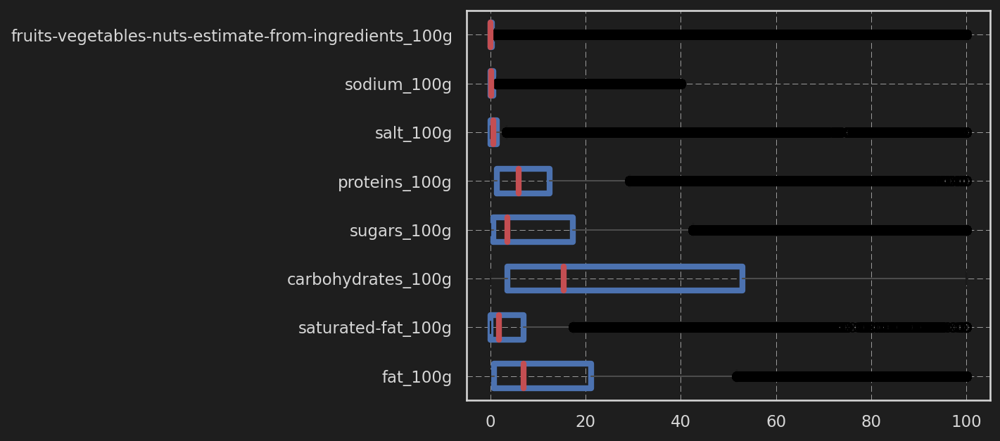

In [ ]:
keys = pd.Series( categories_float )
# keys = keys.loc[ keys!='energy_100g' ]
# keys = keys.loc[ keys.str.contains('_100g|score') ]

keys = keys.loc[ keys.str.contains('100g|score') & (keys!='energy_100g') ]
keys_float = keys.copy()
# print(categories_float)
# print('\n', keys.values)


# NUTRI SCORE
key = 'nutriscore_score'
data.loc[ (data[key] < -15.) | (data[key] > 40.) ] = np.nan
key = 'nutrition-score-fr_100g'
data.loc[ (data[key] < -15.) | (data[key] > 40.) ] = np.nan


# ENERGY
key = 'energy-kcal_100g'
data.loc[ (data[key] < 0.) | (data[key] > 900.) ] = np.nan

# (Values < 0.) | (Values > 100.)
for key in keys[ ~keys.str.contains('score|energy') ]:
    data.loc[ (data[key] < 0.) | (data[key] > 100.) ] = np.nan
    
# SODIUM
key = 'sodium_100g'
data.loc[ data[key] > data['salt_100g'], key ] = np.nan

# SUGARS
key = 'sugars_100g'
data.loc[ data[key] > data['carbohydrates_100g'], key ] = np.nan

# SATURATED_FAT
key = 'saturated-fat_100g'
data.loc[ data[key] > data['fat_100g'], key ] = np.nan

# TOTALtext
key = 'sum_100g'
data[key] = data[ ['proteins_100g', 'carbohydrates_100g', 'fat_100g'] ].fillna(0.).sum(axis=1).round(1)


display( data.loc[ np.round( data['sum_100g'], 1)>100. , ['product_name','proteins_100g', 'carbohydrates_100g', 'fat_100g', 'sum_100g']] )

del key


df_describe = data[ keys ].describe()



IQs = df_describe.loc['75%', :] - df_describe.loc['25%', :]
# IQs.rename( index={0:'IQ'}, inplace=True )

# # display(IQs)
df_describe = pd.concat( (df_describe, IQs.to_frame().T) , ignore_index=False )
df_describe.rename( index={0:'IQ'}, inplace=True )

boxprops = dict(linestyle='-', linewidth=4, color='b')
medianprops = dict(linestyle='-', linewidth=4, color='r')


for keys_tmp in [ keys.astype(str).values[keys.str.contains('score')] , ['energy-kcal_100g'], keys[~keys.str.contains('score|energy')].values ]:
    display( df_describe[keys_tmp] )
    data[keys_tmp].boxplot( showfliers=True, vert=False, boxprops=boxprops, medianprops=medianprops )
    # ax.bxp( df_describe[keys_tmp], boxprops=boxprops, medianprops=medianprops )
    plt.show()
del keys_tmp


# key = 'energy_100g'
# data.loc[ data[key] > df_describe[key]['75%'] + 1.5*df_describe[key]['IQ'] , key ] = np.nan

# df_describe = data[categories_float].describe()
# df_describe.boxplot( showfliers=False, vert=False )
# display( df_describe )


## Nouveau DataFrame et count NaN
<a id="link_prepModel"></a>
Préparation pour modélistation

In [ ]:
keys_categ_score = ['pnns_groups_1', 'nova_group', 'nutriscore_grade', 'nutriscore_score']
key_categ = keys_categ_score[2]
key_classification = keys_categ_score[2]

# copie des données catégorie, classification et float
data_base = data[keys_categ_score].copy()
# if not key_classification in key_categ:
#     data_base[key_classification] = data[key_classification].copy()
data_base[keys_float] = data[keys_float].copy()
isna_base = data_base.isna()
sum_isna_base = isna_base.sum() # sum sur les colonnes

display( 'Number of not NaN (over {:} rows)'.format( len(data)) )
display( len(data)-sum_isna_base )

key_output = 'energy-kcal_100g'
keys_stats = keys_float[ ~keys_float.str.contains( 'score|fruits') ]
keys_input = keys_stats[ keys_stats != key_output ]

b_inputs = ~isna_base[key_categ] & (~isna_base[keys_input]).all( 1 ) # logical and over all columns
b_outputs = (~isna_base[[key_output, key_classification]]).all( 1 )

data_stats = data_base.loc[ b_inputs & b_outputs , :]

print('Number of available data:')
print('inputs          : {:}'.format( b_inputs.sum() ) )
print('inputs & outputs: {:}'.format( ( b_inputs & b_outputs ).sum() ))


'Number of not NaN (over 799996 rows)'

pnns_groups_1                                            294317
nova_group                                               243336
nutriscore_grade                                         277591
nutriscore_score                                         277591
energy-kcal_100g                                         613009
fat_100g                                                 627690
saturated-fat_100g                                       610569
carbohydrates_100g                                       627529
sugars_100g                                              620299
proteins_100g                                            628226
salt_100g                                                582539
sodium_100g                                              582533
fruits-vegetables-nuts-estimate-from-ingredients_100g    272274
nutrition-score-fr_100g                                  277594
dtype: int64

Number of available data:
inputs          : 276185
inputs & outputs: 262646


## Affichage des histogrammes pour les différentes variabes float
- 2 groupes sont visibles pour les carbohydrates
- les autres sont globalement des distribution avec un `skweness empirique > 0`
- 1 second groupe (très petit) est parfois visible

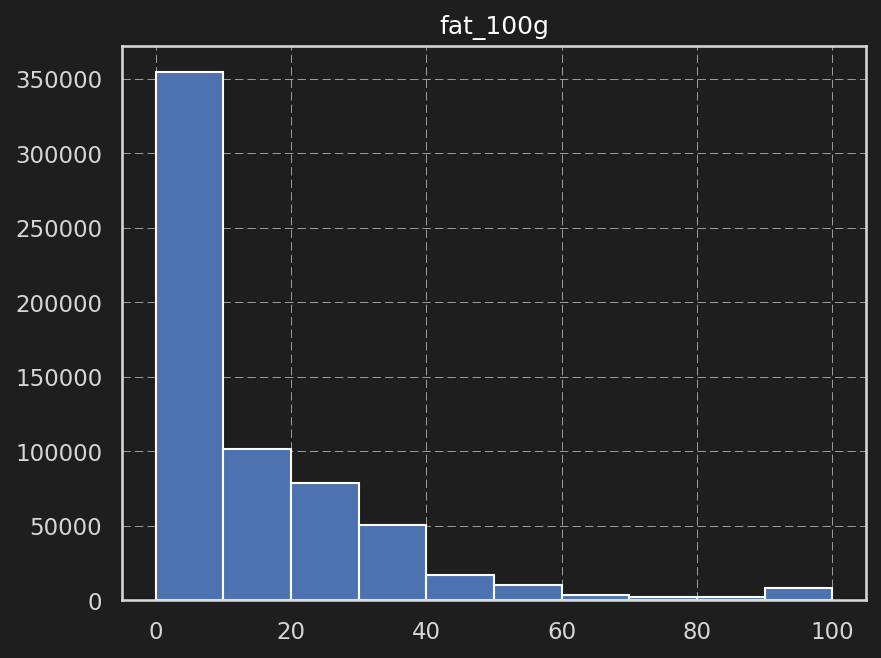

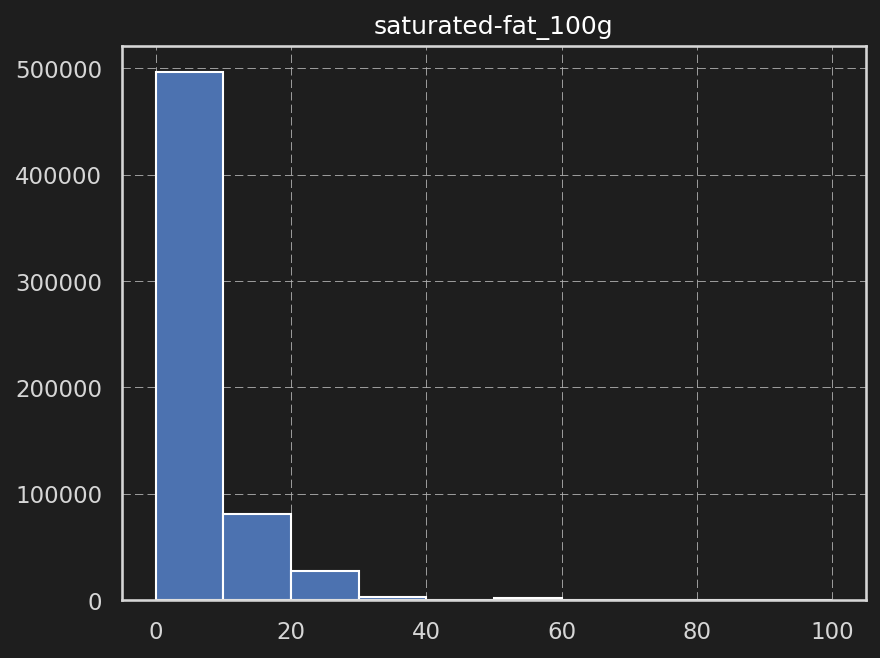

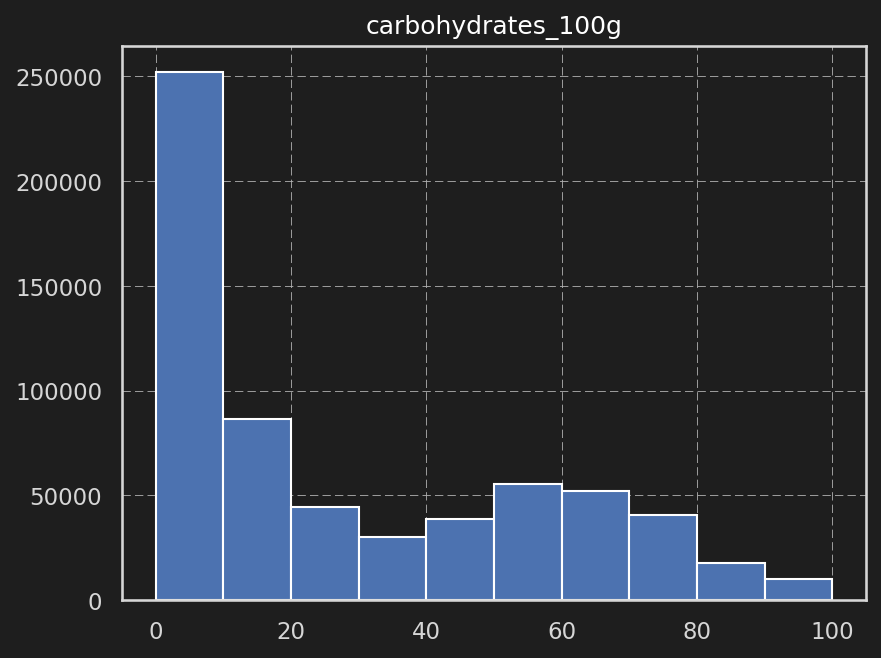

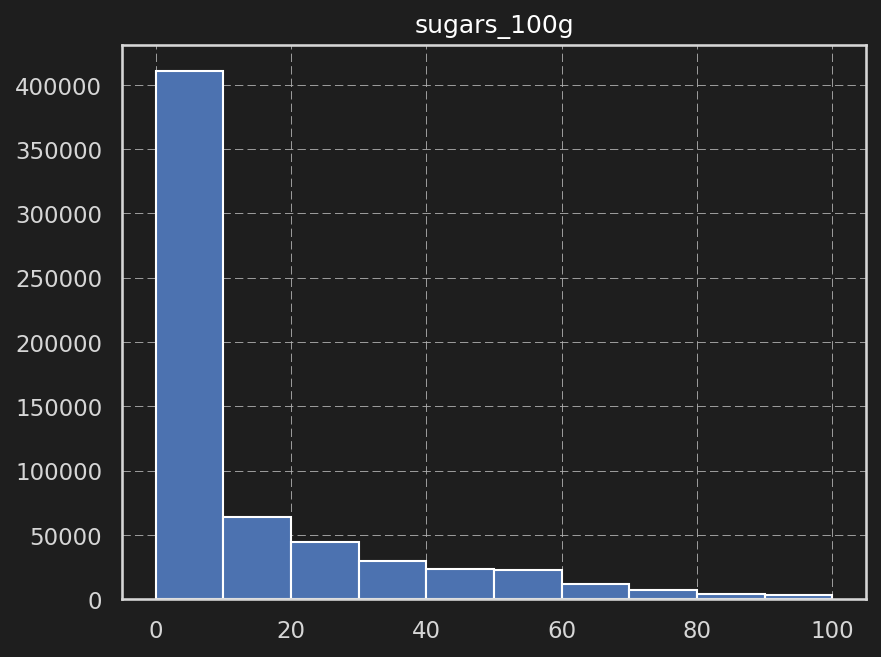

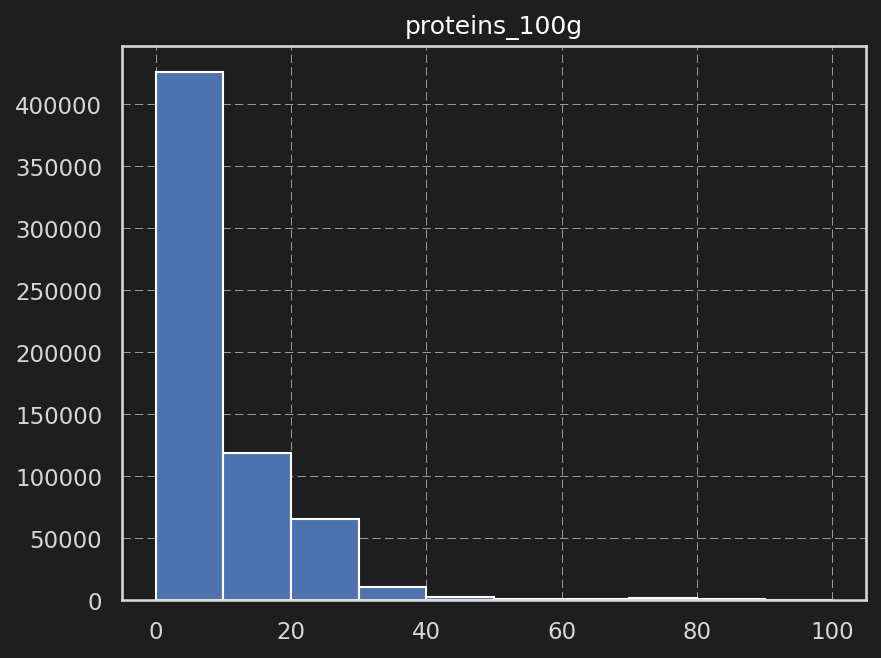

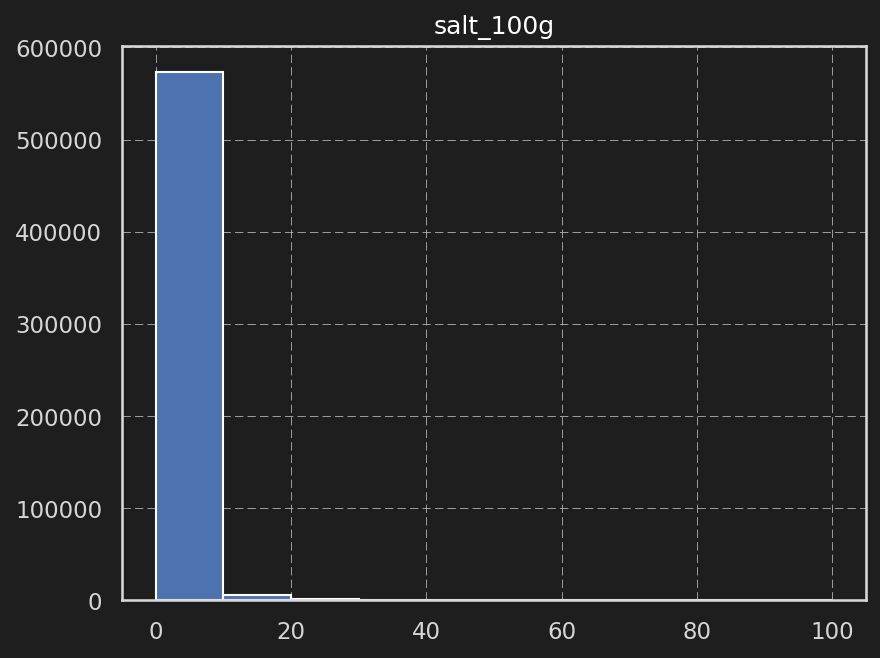

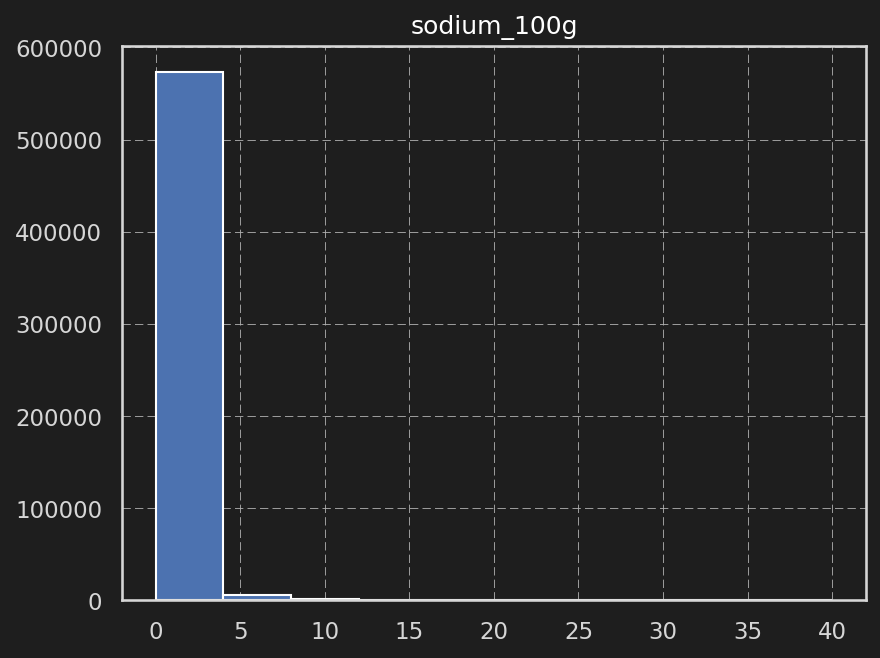

In [ ]:
for key in keys_input:
    fig, ax = plt.subplots()
    data_base[ key ].hist( ax=ax )
    ax.set_title(key)

## Analyse bivariée
Tracés:
- energy_kcal vs fat
- energy_kcal vs carbohydrates
- energy_kcal vs proteins
La couleur code la catégorie choisie ( variable key_categ définie [deux sections avant](#link_prepModel) : pnns_group_1 / food_group / nutriscore_grade)

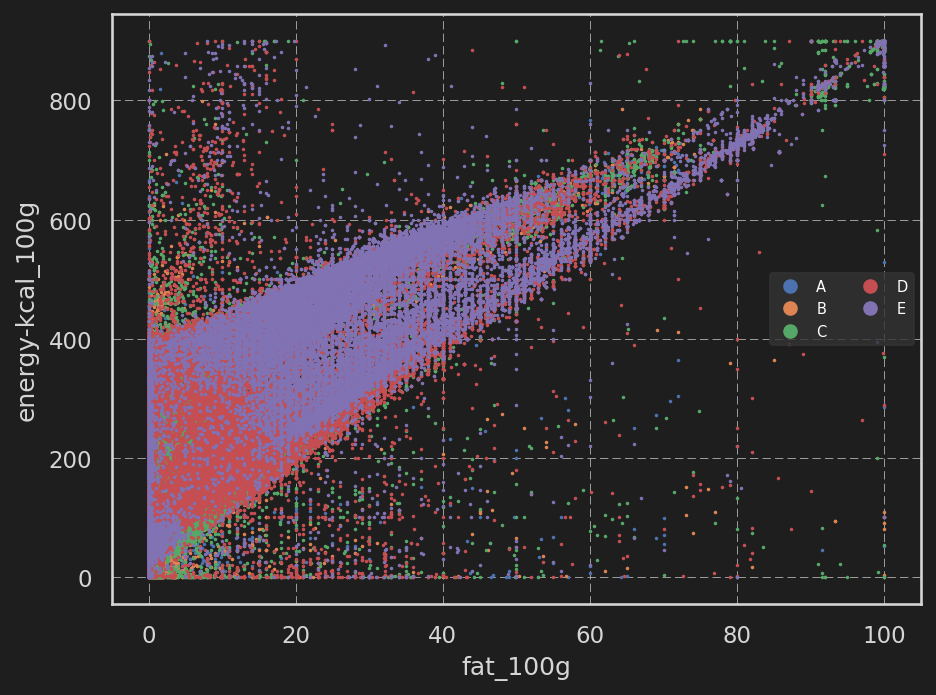

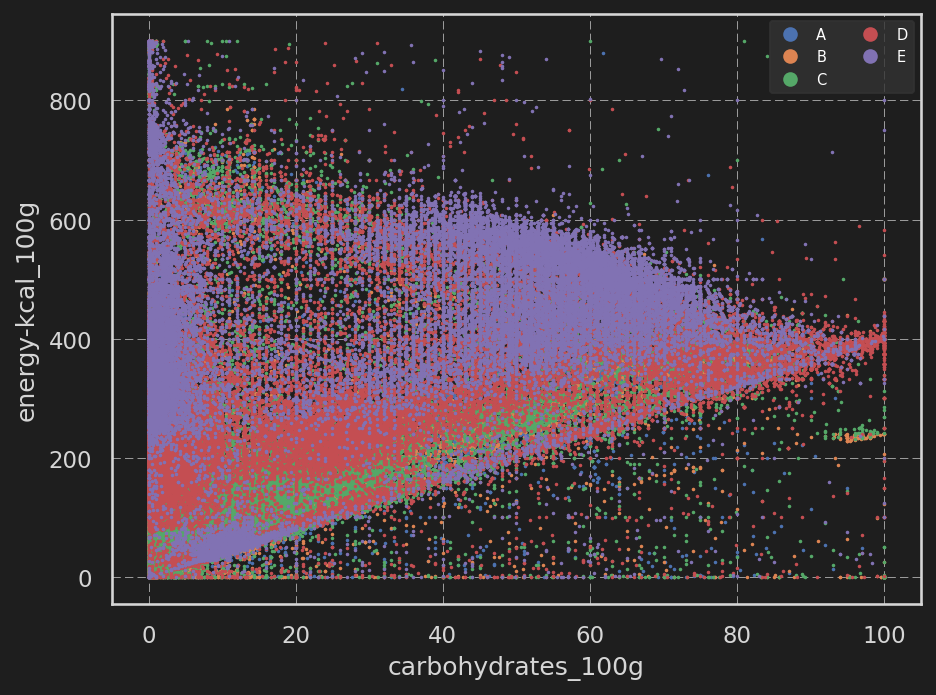

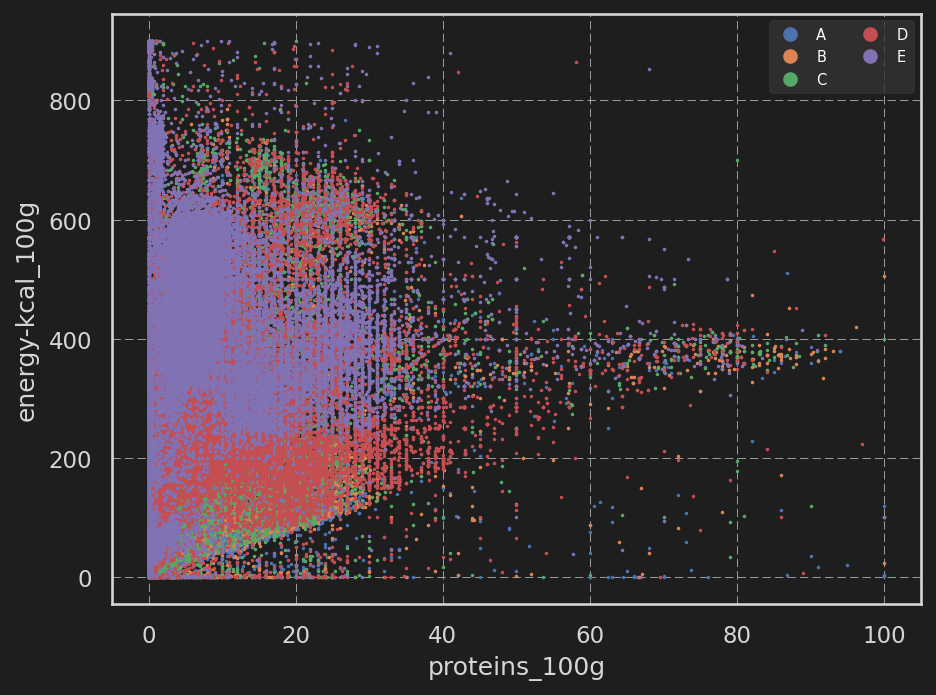

In [ ]:
groups = data_stats.groupby( key_categ )

for key in ['fat_100g', 'carbohydrates_100g', 'proteins_100g']:
    fig, ax = plt.subplots()
    ax.set_xlabel( key )
    ax.set_ylabel( key_output )
    for name, group in groups:
        ax.plot( group[key], group[key_output], 'o', markersize=0.7, label=name )
    lgnd = ax.legend( ncol=2, fontsize=7 )
    for handle in lgnd.legendHandles:
        handle.set_markersize(6.0) # change markersize in legend
    fig.tight_layout( )
    plt.show()

# Modelisation
<!-- Les entrées <span style="color:orange"> "salt" </span> et <span style="color:orange"> "sodium" </span> sont <span style="color:orange"> retirées </span>, car il n'y a <span style="color:orange"> pas de corrélation visible </span>sur les graphiques -->

## Remplir quantitatives avec valeur moyenne
<span style="color:red"> Il y a bien plus de NaN dans les variables groupes que dans les variables quantitées (pour celles gardée en tout cas) <br> $\rightarrow$ quid ? </span>

In [ ]:
# keys_input_model = keys_stats[ ~keys_stats.str.contains('salt|sodium')]
keys_input_model = keys_stats
display( keys_input_model.tolist() )

['energy-kcal_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g']

## KNN: classification / Regression

'k-nn to fit "nutriscore_grade"'

k: 2
k: 3
k: 4
k: 5
k: 6
k: 7
k: 8
k: 9
k: 10


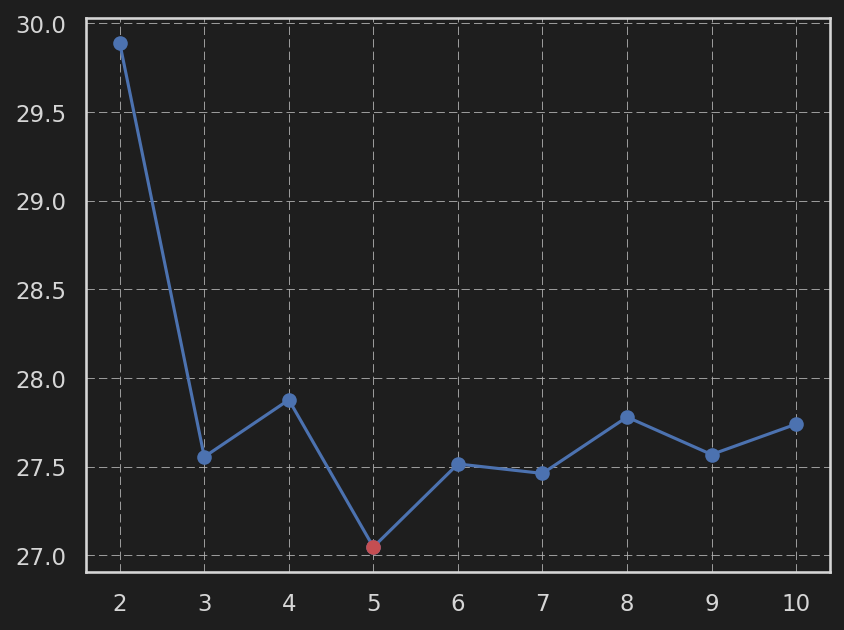

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import neighbors



# display( group[keys_stats] )
display( "k-nn to fit \"{:}\"".format( key_classification) )

xtrain, xtest, ytrain, ytest = train_test_split( data_stats[keys_input_model].values , data_stats[key_classification].values, train_size=0.8)


kmin, kmax = 2, 10
fig, ax = plt.subplots()
errors, dico_knn = [], {}
for k in range(kmin, kmax+1):
    print('k:', k)
    if ytrain.dtype in ['object', 'category']:
        knn = neighbors.KNeighborsClassifier(k)
    else:
        knn = neighbors.KNeighborsRegressor(k)
    dico_knn[k] = knn
    # knn.fit(xtrain, ytrain)
    errors.append(100*(1 - knn.fit(xtrain, ytrain).score(xtest, ytest)))
imin = np.argmin(errors)
ax.plot( range(kmin, kmax+1), errors, 'o-b')
ax.plot( [kmin+imin], [errors[imin]], 'or' )
plt.show()


## Iterative imputer

Categories ['A' 'B' 'C' 'D' 'E']
categories_classification ['A' 'B' 'C' 'D' 'E' 'NaN']


'score:'

38.418046830382636

'prediction:'

array(['B', 'E', 'C', 'D', 'B', 'C', 'C', 'B', 'B', 'C'], dtype='<U3')

'true:'

['B', 'E', 'C', 'D', 'A', 'A', 'A', 'B', 'A', 'C']
Categories (5, object): ['A', 'B', 'C', 'D', 'E']

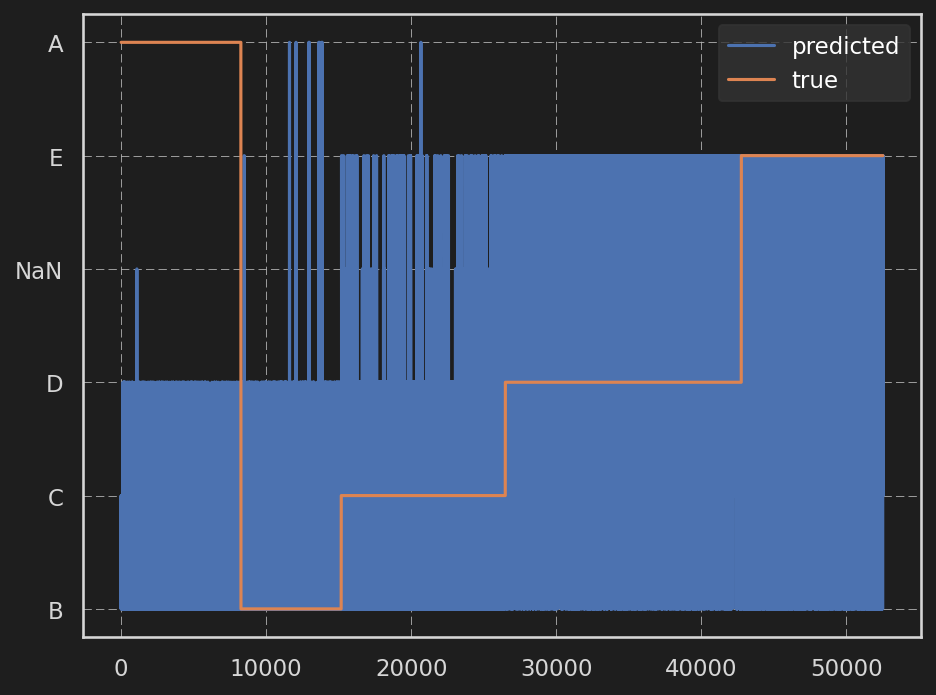

In [ ]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer(max_iter=20, random_state=0)

# X_fit = np.hstack( (xtrain, ytrain.reshape(-1,1)) )
X_fit = pd.DataFrame( { key:xtrain[:,i] for i, key in enumerate(keys_stats) } )
ytrain_cat = pd.Series( ytrain, dtype='category' )
X_fit[key_classification] = ytrain_cat.cat.rename_categories( {cat:i for i,cat in enumerate( ytrain_cat.cat.categories )} )

# X_fit = [[1, 2], [3, 6], [4, 8], [np.nan, 3], [7, np.nan]]
# print('X_fit:\n', X_fit)
imp.fit( X_fit.values )
IterativeImputer(random_state=0)
# X_test = [[np.nan, 2], [6, np.nan], [np.nan, 6]]
# the model learns that the second feature is double the first
# print('completed X_test:\n', np.round(imp.transform(X_test)))

# X_test = np.hstack( (xtest, np.full(shape=xtest[:,:1].shape, fill_value=np.nan) ) )
X_test = pd.DataFrame( { key:xtest[:,i] for i, key in enumerate(keys_stats) } )
X_test[key_classification] = np.nan
Y_pred = imp.transform( X_test.values )

print
if "float" in str(ytest.dtype):
    score = 100*(r2_score(y_true=ytest, y_pred=Y_pred[:,-1] ) )
else:
    print( 'Categories', data[key_classification].cat.categories.values )
    prediction = (Y_pred[:,-1] +0.5 ).astype('int')
    categories_classification = np.array( data[key_classification].cat.categories.tolist() + ['NaN'] )
    print( 'categories_classification', categories_classification )
    prediction[ (prediction<0) | (prediction > len(categories_classification)-1) ] = 5
    prediction = categories_classification[ prediction ]
    score = (ytest == prediction).sum() * 100 / ytest.size
display( 'score:', score )

display( 'prediction:', prediction[:10])
display( 'true:', ytest[:10])

argsort = ytest.argsort()
fig, ax = plt.subplots()
ax.plot( prediction[argsort], label='predicted' )
ax.plot( ytest[argsort], label='true' )
ax.legend()
fig.tight_layout()

## Test SVD

In [ ]:
from sklearn.metrics import r2_score

array = np.empty( (xtrain.shape[0], xtrain.shape[1]+1), dtype='float64' )
array[:,:-1] = xtrain[:,:]
display('IF CATEGORY -> TO NUMERIC')
array[:,-1] = ytrain[:]

U,S,VT = np.linalg.svd( array.T @ array )

fig, axs = plt.subplots( ncols=2 )
for i in range(VT.shape[0]):
    axs[0].plot( VT[i] )
    axs[1].plot( U[i] )

np.set_printoptions( formatter={'float':'{:.3E}'.format})

phi = U[:,:-1]
phi2 = U[:,-1:]

estimator = np.linalg.inv( phi @ phi.T ) @ phi

display( phi @ phi.T )

coefs = estimator @ xtest.T

y_pred = (coefs.T @ phi2 ).ravel()


display( ytest[:10] )
display( y_pred[:10] )

display( r2_score( y_true=ytest, y_pred=y_pred ) )


argsort = ytest.argsort()
fig, ax = plt.subplots()
ax.plot( y_pred[argsort], label='predicted' )
ax.plot( ytest[argsort], label='true' )
ax.legend()
fig.tight_layout()

del array

# <span style="color:orange"> FIN PARTIE UTILE </span>

## Labels
Several labels per product

In [ ]:
key = 'labels_en'

print('Example of labels:\n')
i = 0
for value in data[key]:
        if value is np.nan : continue
        print(value)
        i += 1
        if i == 10: break
dico_value_labels = tools.value_count_labels_in_string_series( data.loc[~data[key].isnull(),key] , ',' )
print(dico_value_labels)

## Visiualisation of NaN with missingno
as barplot 

In [ ]:
msno.bar( data )

## Heatmap without fully filled categories

In [ ]:
msno.heatmap( data[ [key for key in data.keys() if (not key in categories_full)] ] )

## Heatmap without fully filled categories (qualitatives + nutriscore)

In [ ]:
ax = msno.heatmap( data[ [key for key in data.keys() if (not key in categories_full) and (not '_100g' in key) or 'score' in key] ] )

## A REGARDER

# END OF NOTEBOOK

In [ ]:
fig = ax.get_figure()
fig.tight_layout()
tools.savefig( fig, 'Figures/test' )